## Overview

My dataset is from Kaggle: https://www.kaggle.com/datasets/arunavakrchakraborty/australia-weather-data

It is weather data for Australia, contains about 10 years of daily weather observations from many locations across Australia. It's suitable for developing a classifier to predict the next-day rain on the target variable RainTomorrow.

Weather forecasting is very important in modern life, it affects people’s personal and business decisions in many ways. On top of that I have been always interested in knowning what factors affect weather in which way, it's exciting to learn some techniques to do my own weather forecast.

I follow CRISP-DM for this project.

I will build a model for the whole Australia and build separate models for Sydney and Perth, to see how models of the same kind (e.g. LogisticRegression) perform in different datasets.
I will use visualization in for both data analysis and model comparisons, specifically feature correlation heapmap is used to examine the dataset and believed to be quite useful.

The model is also compared to the DummyClassifier and the "common windom" approach by guessing tomorrow's weather is the same as today's.

### Initial Report

This initial report include typical data understanding, data preparation, visualization and a LogisticRegression model.

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from sklearn.compose import make_column_selector
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier

In [512]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import time
import seaborn as sns
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier

In [5]:
pd.options.display.max_columns = None

## Data Understanding

### Examine the data

In [9]:
weather = pd.read_csv('weather/weatherAUS.csv')

In [10]:
df = weather.copy()

#### check general info of the data

In [12]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [14]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [16]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

#### Drop NaN

In [18]:
df=df.dropna()

In [19]:
df['Location'].value_counts()

Location
Darwin              3062
Perth               3025
Brisbane            2953
MelbourneAirport    2929
PerthAirport        2913
SydneyAirport       2870
Watsonia            2730
Mildura             2594
MountGambier        2465
NorfolkIsland       2464
Cairns              2444
Townsville          2419
WaggaWagga          2416
AliceSprings        2223
Nuriootpa           2008
Hobart              1939
Moree               1913
Melbourne           1898
Portland            1863
Woomera             1734
Sydney              1690
Sale                1678
CoffsHarbour        1380
Williamtown         1198
Canberra            1078
Cobar                534
Name: count, dtype: int64

### Keep the month portion of the Date feature

In [22]:
df['Date'].map(lambda x: x.split('-')[1])

6049      01
6050      01
6052      01
6053      01
6054      01
          ..
142298    06
142299    06
142300    06
142301    06
142302    06
Name: Date, Length: 56420, dtype: object

In [23]:
df['Date'] = df['Date'].map(lambda x: x.split('-')[1])

/var/folders/53/8cwfffh14nj6bpk9_kvxyx8r0000gn/T/ipykernel_4035/875933511.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = df['Date'].map(lambda x: x.split('-')[1])


In [26]:
df0 = df.rename(columns={'Date': 'Month'})
df0

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,Cobar,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,01,Cobar,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,01,Cobar,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,01,Cobar,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,01,Cobar,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,Darwin,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
142299,06,Darwin,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No
142300,06,Darwin,20.7,32.8,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
142301,06,Darwin,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


#### Now df has month instead of the full Date, still keeps Location. This becomes the base dataframe from my investigation

#### drop Location for the Australia model

In [41]:
aus = df0.drop(columns='Location')
aus

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,01,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,01,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,01,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,01,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
142299,06,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No
142300,06,20.7,32.8,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
142301,06,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


#### function for feature encoding and polynomial feature engineering

In [45]:
def featureEncoding(df, oneHot=False, PolyNomial=False):
    # Define column selectors
    categorical_selector = make_column_selector(dtype_include=object)
    numerical_selector = make_column_selector(dtype_include=['int64', 'float64'])
    
    # Identify categorical and numerical columns
    categorical_columns = categorical_selector(df)
    numerical_columns = numerical_selector(df)
    OneHotEncoding = OneHotEncoder(drop='if_binary', sparse_output=False) if oneHot else 'passthrough'
    PolynomialEncoding = PolynomialFeatures(degree=2, include_bias=False) if PolyNomial else 'passthrough'
    preprocessor = ColumnTransformer(verbose_feature_names_out=False,
        transformers=[
            ('onehot', OneHotEncoding, categorical_columns),
            ('polynomial', PolynomialEncoding, numerical_columns)  # polynomial on numerical columns
        ])
    
    encoded_data = preprocessor.fit_transform(df)
    return pd.DataFrame(encoded_data, columns = preprocessor.get_feature_names_out())

In [1064]:
def custom_predict(model, X, threshold):
    probs = model.predict_proba(X) 
    return (probs[:, 1] > threshold).astype(int)

In [1061]:
aus1 = featureEncoding(aus, oneHot=True, PolyNomial=False)
aus1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,291.05,308.35,0.0,12.0,12.3,48.0,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,299.75,306.55,17.060188,17.559897,0.0,3.464102,3.507136,6.928203,2.449490,4.472136,4.472136,3.605551,31.722232,31.692270,1.414214,2.236068,17.313290,17.508569
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,291.55,302.05,0.0,14.8,13.0,37.0,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,293.45,300.15,17.074835,17.379586,0.0,3.847077,3.605551,6.082763,4.358899,4.358899,5.477226,2.828427,31.826090,31.813519,1.000000,1.000000,17.130382,17.324838
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,292.55,310.75,0.0,10.8,10.6,46.0,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,301.85,308.05,17.104093,17.628103,0.0,3.286335,3.255764,6.782330,5.477226,3.872983,6.480741,4.690416,31.816662,31.767908,1.000000,2.449490,17.373831,17.551353
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,295.05,311.55,0.0,11.4,12.2,31.0,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,302.25,308.75,17.177020,17.650779,0.0,3.376389,3.492850,5.567764,2.449490,2.449490,6.082763,4.690416,31.822948,31.766334,1.000000,2.236068,17.385339,17.571283
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,297.35,314.15,0.0,11.2,8.4,35.0,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,306.75,310.75,17.243839,17.724277,0.0,3.346640,2.898275,5.916080,4.123106,3.605551,4.358899,3.872983,31.791508,31.739565,1.000000,2.449490,17.514280,17.628103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [50]:
aus1[aus1.columns] = StandardScaler().fit_transform(aus1[aus1.columns])
aus1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,-0.216045,-0.205636,-0.220325,-0.262459,-0.273626,-0.249045,3.670707,-0.278165,-0.282175,-0.236519,-0.268389,-0.292834,3.653619,-0.253233,-0.3107,-0.252836,-0.247919,-0.237645,-0.230825,-0.254064,-0.271751,-0.272239,-0.233875,-0.251484,-0.265187,-0.233538,-0.238518,-0.266944,-0.274225,-0.265034,-0.262073,-0.252836,-0.212607,-0.227052,-0.225364,-0.280267,-0.281882,-0.250527,-0.256584,3.614251,-0.273327,-0.245210,-0.270847,-0.532445,-0.531485,0.691208,1.575298,-0.303702,1.757691,1.214537,0.534126,-1.162355,0.025055,-2.477924,-1.812261,-1.583303,-1.513002,-0.801428,0.254411,1.278186,1.563621
1,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,-0.216045,-0.205636,-0.220325,3.810125,-0.273626,-0.249045,-0.272427,-0.278165,-0.282175,-0.236519,-0.268389,-0.292834,-0.273701,-0.253233,-0.3107,-0.252836,-0.247919,-0.237645,-0.230825,-0.254064,-0.271751,3.673238,-0.233875,-0.251484,-0.265187,-0.233538,-0.238518,-0.266944,-0.274225,-0.265034,-0.262073,-0.252836,-0.212607,-0.227052,-0.225364,-0.280267,-0.281882,3.991588,-0.256584,-0.276682,-0.273327,-0.245210,-0.270847,-0.532445,-0.531485,0.769131,0.671504,-0.303702,2.515216,1.400800,-0.290764,0.400721,-0.092452,-1.937767,-2.059824,-0.628068,-0.392322,-1.158937,-1.256603,0.318980,0.627467
2,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,4.628659,-0.205636,-0.220325,-0.262459,-0.273626,-0.249045,-0.272427,-0.278165,-0.282175,-0.236519,-0.268389,-0.292834,-0.273701,-0.253233,-0.3107,-0.252836,4.033567,-0.237645,-0.230825,-0.254064,-0.271751,-0.272239,-0.233875,-0.251484,-0.265187,-0.233538,-0.238518,-0.266944,-0.274225,-0.265034,-0.262073,-0.252836,-0.212607,4.404280,-0.225364,-0.280267,-0.281882,-0.250527,-0.256584,-0.276682,-0.273327,-0.245210,-0.270847,-0.532445,-0.531485,0.924976,1.919600,-0.303702,1.433038,0.762183,0.384146,1.723325,-0.562482,-1.289578,-1.366647,-0.714907,-0.814396,-1.158937,0.632165,1.597921,1.783032
3,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,-0.216045,-0.205636,-0.220325,-0.262459,-0.273626,-0.249045,-0.272427,-0.278165,-0.282175,4.227987,-0.268389,-0.292834,-0.273701,-0.253233,-0.3107,-0.252836,-0.247919,-0.237645,-0.230825,-0.254064,-0.271751,-0.272239,-0.233875,-0.251484,-0.265187,4.281958,-0.238518,-0.266944,-0.274225,-0.265034,-0.262073,-0.252836,-0.212607,-0.227052,-0.225364,-0.280267,-0.281882,-0.250527,-0.256584,-0.276682,-0.273327,-0.245210,3.692119,-0.532445,-0.531485,1.314588,2.034368,-0.303702,1.595364,1.187928,-0.740704,-1.162355,-1.620048,-1.559657

### heapmap on correlations

#### full heapmap

In [56]:
full_corr_matrix = aus1.corr()

In [57]:
full_corr_matrix

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
Month_01,1.000000,-0.091341,-0.101960,-0.093575,-0.098915,-0.095208,-0.096832,-0.097045,-0.096033,-0.097972,-0.096922,-0.091749,0.007951,0.013244,0.008764,-0.037563,0.016807,0.005349,-0.030783,-0.025178,0.026689,0.021329,0.021927,0.021406,0.006544,-0.031338,-0.022312,-0.009710,0.020108,0.014819,0.027290,-0.018639,-0.002427,0.004960,-0.018025,-0.025140,0.020074,0.025227,0.015282,0.014245,-0.014242,-0.022883,-0.028997,-0.018496,0.009204,0.008510,0.017544,-0.024471,0.010647,-0.008021,-0.030534,-0.023740,0.020962,0.011036,0.022212,0.008772,0.007933,-0.017998,-0.016259,-0.005546,-0.018265,-0.013834,0.250762,0.271835,0.028536,0.275334,0.119843,0.077484,0.034683,0.050714,-0.101663,-0.061849,-0.225915,-0.215629,0.004594,-0.028256,0.255811,0.259968
Month_02,-0.091341,1.000000,-0.090449,-0.083011,-0.087748,-0.084459,-0.085900,-0.086089,-0.085192,-0.086911,-0.085980,-0.081391,0.029394,0.004203,0.020544,-0.030626,-0.001089,-0.011605,-0.022372,-0.031324,0.038230,0.035015,0.043349,0.001545,-0.004881,-0.032936,-0.020147,-0.026659,0.026454,0.013554,0.023519,-0.031430,-0.005410,-0.017257,-0.013785,-0.029770,0.018495,0.035156,0.032718,-0.000704,-0.006133,-0.022511,-0.023319,-0.007051,0.023687,0.001643,0.030834,-0.026292,-0.004843,-0.016840,-0.023794,-0.027745,0.030049,0.028795,0.036334,0.005810,-0.006737,-0.026989,-0.014218,-0.020814,-0.006831,-0.007548,0.218819,0.215969,0.033749,0.168723,0.072163,0.026655,-0.000305,0.013183,-0.016196,-0.020359,-0.131097,-0.120155,0.005747,-0.009887,0.194351,0.210306
Month_03,-0.101960,-0.090449,1.000000,-0.092661,-0.097949,-0.094278,-0.095886,-0.096097,-0.095095,-0.097015,-0.095975,-0.090853,0.030068,0.004916,0.024107,-0.020117,0.000511,-0.011523,-0.023318,-0.025583,0.007893,0.043810,0.026406,0.006910,-0.008703,-0.029978,-0.024431,-0.012180,0.023536,0.005889,0.031536,-0.028068,-0.012115,-0.015934,-0.013264,-0.012814,0.007276,0.027467,0.023501,0.001017,-0.005131,-0.011390,-0.007652,-0.018371,0.024357,0.005570,0.034574,-0.024422,-0.001261,-0.018042,-0.027776,-0.020353,0.007606,0.037899,0.006888,0.003931,-0.003804,-0.018030,-0.007555,-0.011345,0.002838,-0.000833,0.167710,0.153751,0.012317,0.067173,-0.003754,-0.012823,-0.026651,-0.011942,0.034941,-0.012299,-0.039621,-0.031944,0.009362,0.011753,0.126101,0.155007
Month_04,-0.093575,-0.083011,-0.092661,1.000000,-0.089894,-0.086525,-0.088001,-0.088195,-0.087275,-0.089037,-0.088083,-0.083382,0.015566,0.002894,0.017791,-0.017810,-0.002751,-0.017315,-0.009828,-0.008072,0.017464,0.015797,0.014272,0.003248,-0.005002,-0.014414,-0.010383,-0.006882,0.006297,0.011091,0.007904,-0.016361,-0.003801,-0.017804,-0.007149,0.000696,-0.002522,0.010137,0.013759,0.000199,-0.000009,-0.004137,0.003960,-0.002639,0.013723,-0.000071,0.010591,-0.021834,-0.009073,-0.001698,-0.013069,-0.010372,0.021052,0.018815,0.016464,0.002427,-0.000115,-0.017734,-0.012489,-0.002148,-0.000275,-0.002066,0.029850,0.015709,-0.004925,-0.073620,-0.039566,-0.075579,-0.041934,-0.057904,0.035624,0.015745,0.076037,0.069126,0.00927

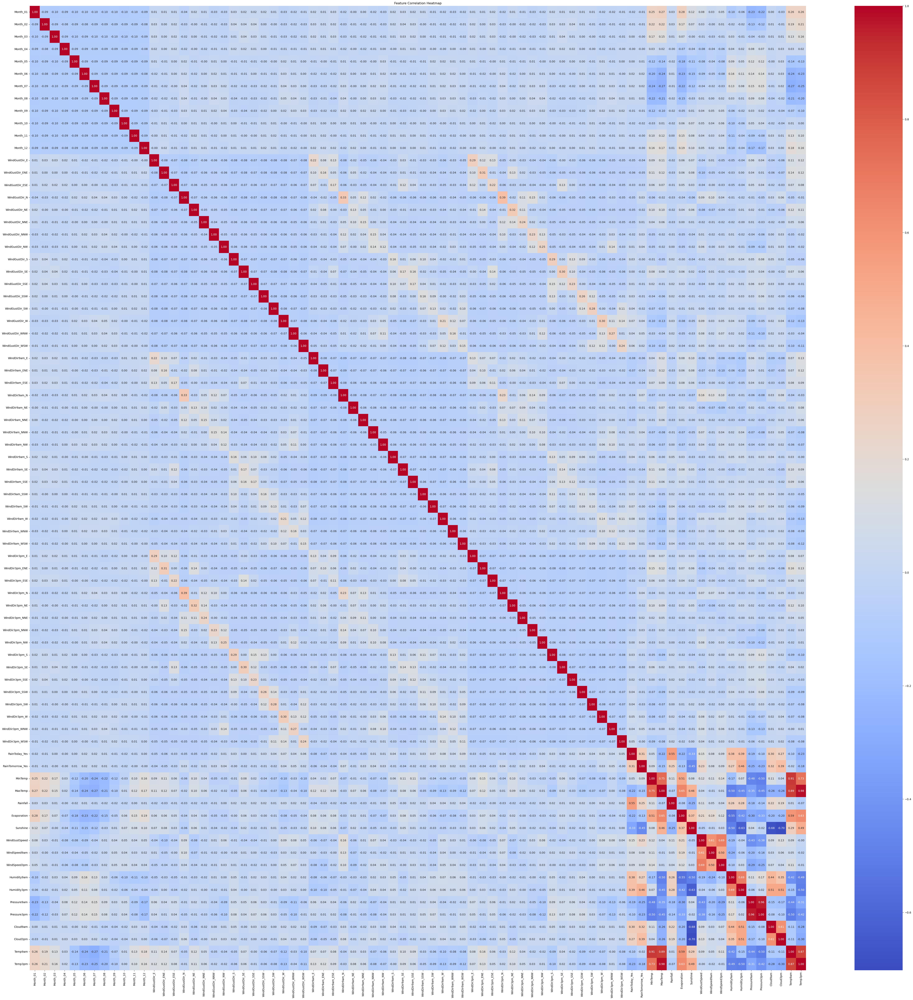

In [60]:
plt.figure(figsize=(64, 64))
sns_plot = sns.heatmap(full_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()

fig = sns_plot.get_figure()
fig.savefig("australia_full_heapmap.png", dpi=300)

The lower right corner of the heapmap has stronger correlation, they are features with numerical values(e.g. MinTemp, WindSpeed9am, Humidity3pm, Pressure9am ...), RainToday and RainTomorrow.

The lower left corner also have some level of correlation, they are between 'Month' and features with numerical values. For example, temperature is higher for January and Feburary and lower for June and July(remember this is Australia in the southern hemisphere), pressure and humidity are higher in June and July and lower in January and Feburary. These are really interesting information.

There are two diagonal strips at both below and above the main diagonal. The stronger and shorter one is between wind direction at 3PM and windGust direction. The longer and weaker one is between wind direction at 9am and (windGust directioin + wind irection at 3PM)

### Let's check the corellation of the lower right corner more closely by selecting only those columns

In [66]:
selected_clms = ['MinTemp', 'MaxTemp',	'Rainfall',	'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed9am',	'WindSpeed3pm',	'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',	'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
selected_corr_matrix = aus1[selected_clms].corr()

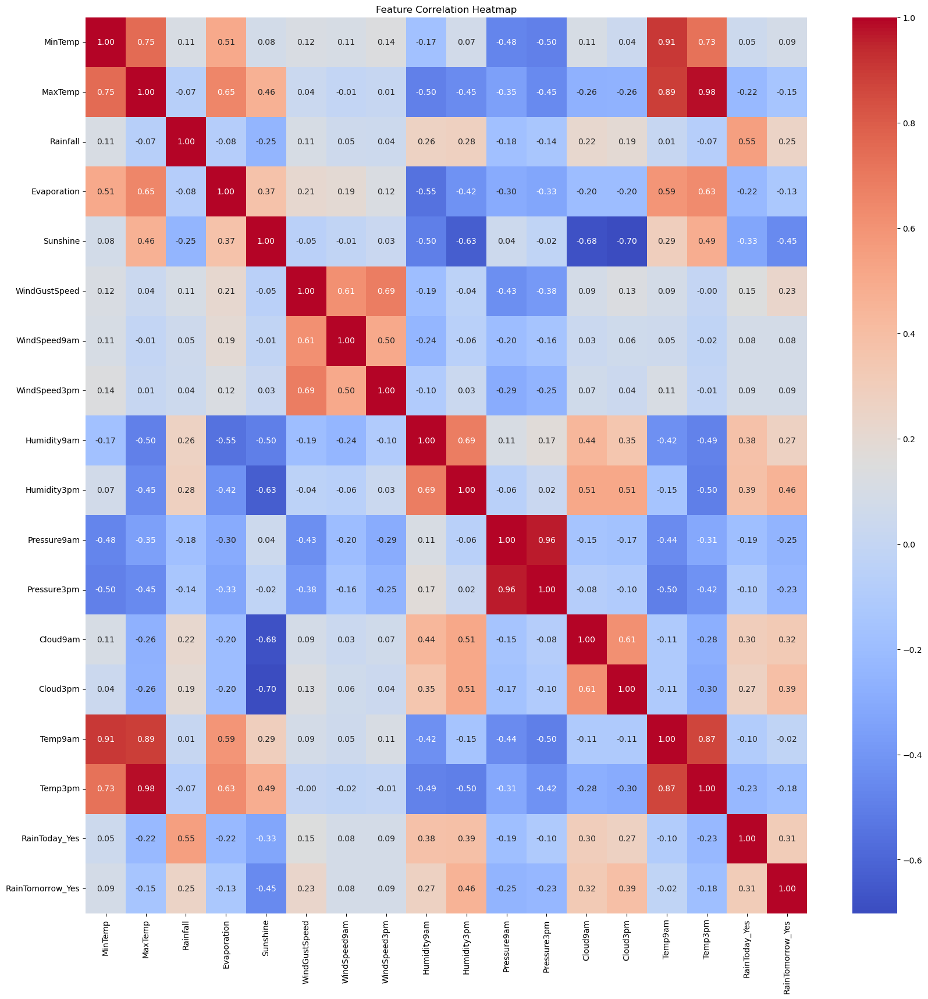

In [69]:
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(selected_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()

fig = sns_plot.get_figure()
fig.savefig("australia_selected_heapmap.png", dpi=300)

The bottom row is for RainTomorrow_Yes, we can see it has positive correlatioins with RainFall, WindGustSpeed, Cloud, Humidity and RainToday, negative correlation with Sunshine and Pressure.

In [73]:
selected_corr_matrix

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_Yes,RainTomorrow_Yes
MinTemp,1.000000,0.749687,0.110800,0.506764,0.076087,0.118054,0.108522,0.137273,-0.174991,0.070827,-0.475661,-0.495577,0.106177,0.042173,0.906295,0.727222,0.048953,0.087428
MaxTemp,0.749687,1.000000,-0.069981,0.650964,0.463913,0.035531,-0.008171,0.012266,-0.495781,-0.448116,-0.350980,-0.451691,-0.263634,-0.257752,0.893387,0.984841,-0.221810,-0.147467
Rainfall,0.110800,-0.069981,1.000000,-0.077239,-0.246379,0.106308,0.050584,0.044112,0.263625,0.277625,-0.180606,-0.137302,0.217169,0.191433,0.013713,-0.074627,0.550515,0.254342
Evaporation,0.506764,0.650964,-0.077239,1.000000,0.369250,0.209566,0.193154,0.124345,-0.554232,-0.422436,-0.297319,-0.325954,-0.199809,-0.202366,0.593122,0.630727,-0.218079,-0.130002
Sunshine,0.076087,0.463913,-0.246379,0.369250,1.000000,-0.052422,-0.013842,0.029200,-0.500343,-0.629299,0.043330,-0.020632,-0.677939,-0.702022,0.289038,0.486129,-0.328904,-0.453407
WindGustSpeed,0.118054,0.035531,0.106308,0.209566,-0.052422,1.000000,0.608852,0.685236,-0.193410,-0.042653,-0.430363,-0.383683,0.088129,0.131590,0.085520,-0.000382,0.146276,0.233158
WindSpeed9am,0.108522,-0.008171,0.050584,0.193154,-0.013842,0.608852,1.000000,0.502226,-0.236795,-0.058449,-0.201518,-0.155484,0.034908,0.062507,0.053749,-0.018357,0.083125,0.083904
WindSpeed3pm,0.137273,0.012266,0.044112,0.124345,0.029200,0.685236,0.502226,1.000000,-0.100626,0.031843,-0.293155,-0.252095,0.068224,0.041475,0.114043,-0.009436,0.085627,0.088862
Humidity9am,-0.174991,-0.495781,0.263625,-0.554232,-0.500343,-0.193410,-0.236795,-0.100626,1.000000,0.685697,0.114575,0.172972,0.438962,0.348707,-0.423598,-0.487758,0.379451,0.271033
Humidity3pm,0.070827,-0.448116,0.277625,-0.422436,-0.629299,-0.042653,-0.058449,0.031843,0.685697,1.000000,-0.063454,0.024109,0.509223,0.510996,-0.151614,-0.497245,0.385440,0.455358


### What is the accuracy of guessing tomorrow's weather is same as today
It's commonly known that guessing tomorrow's weather is the same as today's has pretty good accuracy, let's see!

The probability of raining tomorrow:

In [78]:
df[(df['RainTomorrow'] == 'Yes')].shape[0]/df.shape[0]

0.22025877348457992

The probably of not raining tomorrow:

In [80]:
df[df['RainTomorrow'] == 'No'].shape[0]/df.shape[0]

0.7797412265154201

The majority class is not raining, with a probability of 78%

The probability of having rain tomorrow if it rains today:

In [89]:
df[(df['RainToday'] == 'Yes') & (df['RainTomorrow'] == 'Yes')].shape[0] / df[(df['RainToday'] == 'Yes')].shape[0]

0.4608409565077837

It's 46.1%

The probability of not raining tomorrow if it's not raining today:

In [93]:
df[(df['RainToday'] == 'No') & (df['RainTomorrow'] == 'No')].shape[0] / df[(df['RainToday'] == 'No')].shape[0]

0.8479457664133946

It's 84.8%

#### Combining both we have the accuracy of guessing tomorrow's weather is the same as today


In [98]:
(df[(df['RainToday'] == 'No') & (df['RainTomorrow'] == 'No')].shape[0] + df[(df['RainToday'] == 'Yes') & (df['RainTomorrow'] == 'Yes')].shape[0]) / df.shape[0]

0.7624423963133641

76% is not bad but slightly fall short of blinding guessing tomorrow will not rain at 78%

### prepare data for modeling

In [104]:
X_aus, y_aus = aus.drop('RainTomorrow', axis = 1), aus['RainTomorrow']

In [106]:
X_aus.sample(10)

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
86404,04,12.0,23.8,0.2,3.8,10.8,W,28.0,W,W,13.0,6.0,61.0,45.0,1014.8,1011.2,1.0,1.0,17.5,23.3,No
78727,01,17.2,22.3,8.0,8.4,0.0,SSW,31.0,S,SSW,9.0,17.0,80.0,69.0,1018.8,1017.2,8.0,8.0,18.1,21.6,Yes
103711,04,16.6,25.7,0.4,6.4,9.4,W,37.0,W,W,17.0,20.0,75.0,38.0,1017.4,1015.3,6.0,4.0,18.6,24.9,No
36379,01,20.1,26.6,0.4,4.2,6.0,S,39.0,S,SE,20.0,17.0,74.0,60.0,1018.6,1016.9,7.0,4.0,21.2,25.7,No
9477,02,19.8,24.0,13.4,8.0,1.1,SW,41.0,SSW,SSW,22.0,17.0,70.0,69.0,1019.9,1020.1,8.0,8.0,21.6,22.9,Yes
94247,08,13.9,26.1,0.0,5.4,10.2,NE,39.0,SSE,ENE,7.0,31.0,53.0,64.0,1020.7,1017.2,1.0,1.0,22.8,23.7,No
105170,05,7.7,13.3,1.0,2.8,1.3,NE,28.0,ENE,NE,15.0,17.0,90.0,80.0,1021.1,1019.6,8.0,7.0,9.0,12.3,No
140965,10,20.5,34.4,17.6,9.2,9.3,ENE,72.0,ESE,WNW,15.0,33.0,61.0,64.0,1013.9,1009.4,6.0,4.0,29.9,32.0,Yes
67210,07,7.4,13.5,0.2,1.8,5.6,WSW,52.0,W,WSW,26.0,26.0,71.0,56.0,1016.3,1018.5,3.0,6.0,9.2,13.0,No
118356,12,17.2,30.5,0.0,11.6,13.1,ENE,46.0,ENE,WSW,19.0,28.0,46.0,38.0,1012.5,1009.9,0.0,0.0,23.2,29.2,No


In [108]:
y_aus.sample(20)

78704     Yes
34538      No
132558     No
71965      No
61336      No
106188     No
122544     No
13219      No
36254     Yes
85681      No
141556     No
68133      No
62467     Yes
65355     Yes
84239     Yes
40220      No
72108      No
101208     No
22914      No
45626      No
Name: RainTomorrow, dtype: object

In [110]:
X_aus = featureEncoding(X_aus, oneHot=True, PolyNomial=True)
X_aus

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed WindSpeed3pm,WindGustSpeed Humidity9am,WindGustSpeed Humidity3pm,WindGustSpeed Pressure9am,WindGustSpeed Pressure3pm,WindGustSpeed Cloud9am,WindGustSpeed Cloud3pm,WindGustSpeed Temp9am,WindGustSpeed Temp3pm,WindSpeed9am^2,WindSpeed9am WindSpeed3pm,WindSpeed9am Humidity9am,WindSpeed9am Humidity3pm,WindSpeed9am Pressure9am,WindSpeed9am Pressure3pm,WindSpeed9am Cloud9am,WindSpeed9am Cloud3pm,WindSpeed9am Temp9am,WindSpeed9am Temp3pm,WindSpeed3pm^2,WindSpeed3pm Humidity9am,WindSpeed3pm Humidity3pm,WindSpeed3pm Pressure9am,WindSpeed3pm Pressure3pm,WindSpeed3pm Cloud9am,WindSpeed3pm Cloud3pm,WindSpeed3pm Temp9am,WindSpeed3pm Temp3pm,Humidity9am^2,Humidity9am Humidity3pm,Humidity9am Pressure9am,Humidity9am Pressure3pm,Humidity9am Cloud9am,Humidity9am Cloud3pm,Humidity9am Temp9am,Humidity9am Temp3pm,Humidity3pm^2,Humidity3pm Pressure9am,Humidity3pm Pressure3pm,Humidity3pm Cloud9am,Humidity3pm Cloud3pm,Humidity3pm Temp9am,Humidity3pm Temp3pm,Pressure9am^2,Pressure9am Pressure3pm,Pressure9am Cloud9am,Pressure9am Cloud3pm,Pressure9am Temp9am,Pressure9am Temp3pm,Pressure3pm^2,Pressure3pm Cloud9am,Pressure3pm Cloud3pm,Pressure3pm Temp9am,Pressure3pm Temp3pm,Cloud9am^2,Cloud9am Cloud3pm,Cloud9am Temp9am,Cloud9am Temp3pm,Cloud3pm^2,Cloud3pm Temp9am,Cloud3pm Temp3pm,Temp9am^2,Temp9am Temp3pm,Temp3pm^2
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,17.9,35.2,0.0,12.0,12.3,48.0,6.0,20.0,20.0,

In [112]:
X_aus[X_aus.columns] = StandardScaler().fit_transform(X_aus[X_aus.columns])
X_aus

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed WindSpeed3pm,WindGustSpeed Humidity9am,WindGustSpeed Humidity3pm,WindGustSpeed Pressure9am,WindGustSpeed Pressure3pm,WindGustSpeed Cloud9am,WindGustSpeed Cloud3pm,WindGustSpeed Temp9am,WindGustSpeed Temp3pm,WindSpeed9am^2,WindSpeed9am WindSpeed3pm,WindSpeed9am Humidity9am,WindSpeed9am Humidity3pm,WindSpeed9am Pressure9am,WindSpeed9am Pressure3pm,WindSpeed9am Cloud9am,WindSpeed9am Cloud3pm,WindSpeed9am Temp9am,WindSpeed9am Temp3pm,WindSpeed3pm^2,WindSpeed3pm Humidity9am,WindSpeed3pm Humidity3pm,WindSpeed3pm Pressure9am,WindSpeed3pm Pressure3pm,WindSpeed3pm Cloud9am,WindSpeed3pm Cloud3pm,WindSpeed3pm Temp9am,WindSpeed3pm Temp3pm,Humidity9am^2,Humidity9am Humidity3pm,Humidity9am Pressure9am,Humidity9am Pressure3pm,Humidity9am Cloud9am,Humidity9am Cloud3pm,Humidity9am Temp9am,Humidity9am Temp3pm,Humidity3pm^2,Humidity3pm Pressure9am,Humidity3pm Pressure3pm,Humidity3pm Cloud9am,Humidity3pm Cloud3pm,Humidity3pm Temp9am,Humidity3pm Temp3pm,Pressure9am^2,Pressure9am Pressure3pm,Pressure9am Cloud9am,Pressure9am Cloud3pm,Pressure9am Temp9am,Pressure9am Temp3pm,Pressure3pm^2,Pressure3pm Cloud9am,Pressure3pm Cloud3pm,Pressure3pm Temp9am,Pressure3pm Temp3pm,Cloud9am^2,Cloud9am Cloud3pm,Cloud9am Temp9am,Cloud9am Temp3pm,Cloud3pm^2,Cloud3pm Temp9am,Cloud3pm Temp3pm,Temp9am^2,Temp9am Temp3pm,Temp3pm^2
0,3.116405,-0.284656,-0.317748,-0.291619,-0.308259,-0.296705,-0.301768,-0.302432,-0.299279,-0.30532,-0.302047,-0.285928,-0.294969,-0.277276,-0.249727,-0.283965,-0.2446,-0.216045,-0.205636,-0.220325,-0.262459,-0.273626,-0.249045,3.670707,-0.278165,-0.282175,-0.236519,-0.268389,-0.292834,3.

#### function for plotting confusion matrix

In [116]:
def plotConfusionMatrix(cm, model):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
    disp.plot()
    plt.show()
    if (cm[1][1] + cm[0][1]) != 0:
        precision = cm[1][1]/(cm[1][1] + cm[0][1])
    recall = cm[1][1]/(cm[1][1] + cm[1][0])
    specificity = cm[0][0]/(cm[0][0] + cm[0][1])
    accuracy = (cm[0][0] + cm[1][1])/(cm[0][0] + cm[1][1] + cm[0][1] + cm[1][0])
    print('accuracy:', accuracy)
    print('precision:', precision if (cm[1][1] + cm[0][1]) != 0 else "Nan")
    print('recall:', recall)
    print('specificity:', specificity)

In [118]:
X_aus_train, X_aus_test, y_aus_train, y_aus_test = train_test_split(X_aus, y_aus, random_state=42)


### Dummy Classifier

In [121]:
dummy = DummyClassifier().fit(X_aus_train, y_aus_train)
accuracy_score(y_aus_train, dummy.predict(X_aus_train))

0.7801961479380835

In [123]:
accuracy_score(y_aus_test, dummy.predict(X_aus_test))


0.77837646224743

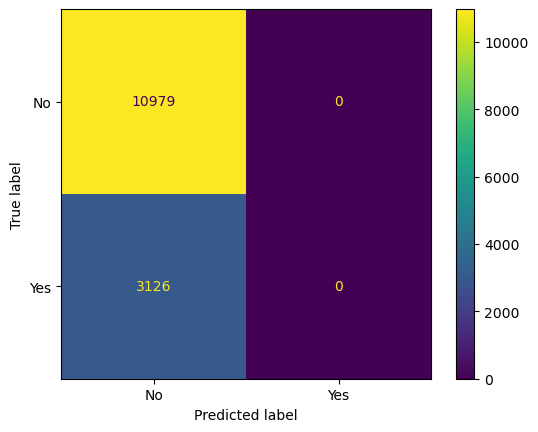

accuracy: 0.77837646224743
precision: Nan
recall: 0.0
specificity: 1.0


In [125]:
cm = confusion_matrix(y_aus_test, dummy.predict(X_aus_test))
plotConfusionMatrix(cm, dummy)

The DummyClassifier() has an accuracy of 0.78, by falling back to the majority class as expected.

### LogisticRegression

In [130]:
lgr = LogisticRegression(max_iter=1000).fit(X_aus_train, y_aus_train)
accuracy_score(y_aus_train, lgr.predict(X_aus_train))

0.8598133049745953

In [132]:
accuracy_score(y_aus_test, lgr.predict(X_aus_test))

0.857851825593761

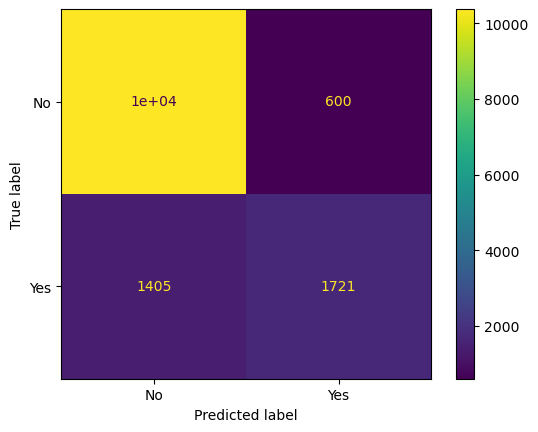

accuracy: 0.857851825593761
precision: 0.7414907367514002
recall: 0.5505438259756877
specificity: 0.945350214044995


In [133]:
cm = confusion_matrix(y_aus_test, lgr.predict(X_aus_test))
plotConfusionMatrix(cm, lgr)

#### LogisticRegression() feature coefficients

In [136]:
coef = sorted(zip(lgr.coef_[0], X_aus_train.columns), reverse=True)

In [137]:
data = {'features': [x[1] for x in coef], 'coefficient': [x[0] for x in coef]}

In [142]:
pd.DataFrame(data).head(20)

,features,coefficient
0,Temp3pm^2,1.079169
1,WindGustSpeed Temp9am,0.994433
2,Humidity3pm Pressure3pm,0.871275
3,Humidity3pm Pressure9am,0.844457
4,Cloud9am Temp9am,0.797663
5,Sunshine Temp9am,0.719541
6,WindGustSpeed Humidity9am,0.689461
7,MinTemp Evaporation,0.622213
8,Pressure9am^2,0.611256
9,MinTemp Sunshine,0.569843


## Let's build a model for Sydney

In [150]:
aus

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,01,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,01,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,01,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,01,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
142299,06,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No
142300,06,20.7,32.8,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
142301,06,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


In [152]:
df0

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,Cobar,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,01,Cobar,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,01,Cobar,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,01,Cobar,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,01,Cobar,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,Darwin,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
142299,06,Darwin,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No
142300,06,Darwin,20.7,32.8,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
142301,06,Darwin,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


#### Include both Sydney and SydneyAirport since they very close

In [155]:
syd = df0[(df0['Location'] == 'Sydney') | (df0['Location'] == 'SydneyAirport')]
syd

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
31168,10,Sydney,12.9,20.3,0.2,3.0,10.9,ENE,37.0,W,E,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,16.9,19.8,No,No
31169,10,Sydney,13.3,21.5,0.0,6.6,11.0,ENE,41.0,W,ENE,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,17.6,21.3,No,No
31170,10,Sydney,15.3,23.0,0.0,5.6,11.0,NNE,41.0,W,ENE,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,19.0,22.2,No,No
31174,10,Sydney,12.9,26.7,0.2,3.8,12.1,NE,33.0,W,ENE,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,17.8,22.5,No,No
31175,10,Sydney,14.8,23.8,0.0,6.8,9.6,SSE,54.0,SSE,SE,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,20.2,20.6,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36524,06,SydneyAirport,8.6,18.6,0.2,2.0,7.8,SSW,56.0,NNW,S,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,13.3,17.7,No,No
36525,06,SydneyAirport,9.5,17.8,0.2,2.0,9.2,SW,35.0,NNW,SSE,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,14.3,16.8,No,No
36526,06,SydneyAirport,8.7,19.4,0.0,2.4,2.7,NNW,30.0,NW,NW,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,10.9,18.2,No,No
36527,06,SydneyAirport,9.4,19.9,0.0,1.4,9.3,SW,43.0,WNW,W,22.0,28.0,61.0,41.0,1017.3,1015.2,5.0,2.0,12.9,19.3,No,No


#### Drop Locatiion

In [158]:
syd = syd.drop(columns=['Location'])

In [160]:
syd1 = featureEncoding(syd, oneHot=True, PolyNomial=False)
syd1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.9,20.3,0.2,3.0,10.9,37.0,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,16.9,19.8
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.3,21.5,0.0,6.6,11.0,41.0,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,17.6,21.3
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.3,23.0,0.0,5.6,11.0,41.0,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,19.0,22.2
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.9,26.7,0.2,3.8,12.1,33.0,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,17.8,22.5
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,14.8,23.8,0.0,6.8,9.6,54.0,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,20.2,20.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4555,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.6,18.6,0.2,2.0,7.8,56.0,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,13.3,17.7
4556,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.5,17.8,0.2,2.0,9.2,35.0,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,14.3,16.8
4557,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.7,19.4,0.0,2.4,2.7,30.0,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,10.9,18.2
4558,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,

### Check Sydney's average and monthly raining probability

In [164]:
syd1[(syd1['RainTomorrow_Yes'] == 1.0)].shape[0]/syd1.shape[0]

0.24802631578947368

Year round average is 24.8%

In [167]:
rainData = {'month': [], 'raining Probability': []}

for m in ['Month_01', 'Month_02', 'Month_03', 'Month_04', 'Month_05', 'Month_06', 'Month_07', 'Month_08', 'Month_09', 'Month_10', 'Month_11', 'Month_12']:
    p = syd1[(syd1[m] == 1.0) & (syd1['RainTomorrow_Yes'] == 1.0)].shape[0] / syd1[syd1[m] == 1.0].shape[0]
    rainData['month'].append(m)
    rainData['raining Probability'].append(p)
rainData
rainDF = pd.DataFrame(rainData)
rainDF

,month,raining Probability
0,Month_01,0.231527
1,Month_02,0.275758
2,Month_03,0.314356
3,Month_04,0.338798
4,Month_05,0.180288
5,Month_06,0.303342
6,Month_07,0.222222
7,Month_08,0.193634
8,Month_09,0.200535
9,Month_10,0.205063


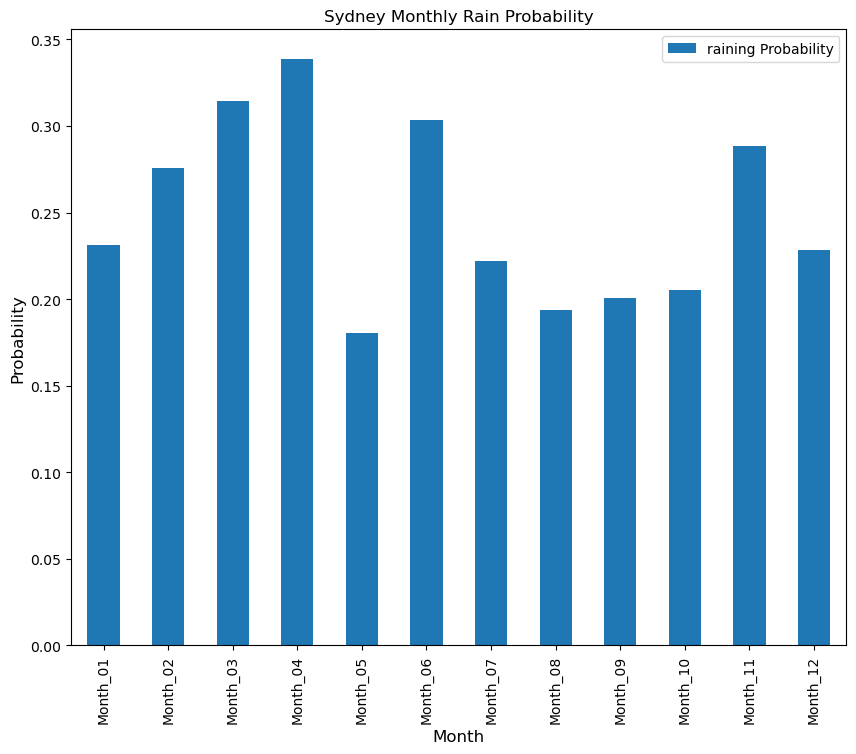

In [169]:
ax = rainDF.plot.bar(x='month', title ="Sydney Monthly Rain Probability", figsize=(10, 8), legend=True)
ax.set_xlabel("Month", fontsize=12)
ax.set_ylabel("Probability", fontsize=12)
plt.show()

### Accuracy of guessing tomorrow's weather is same as today, for Sydney

In [173]:
df2 = df[(df['Location'] == 'Sydney') | (df['Location'] == 'SydneyAirport')]
(df2[(df2['RainToday'] == 'No') & (df2['RainTomorrow'] == 'No')].shape[0] + df2[(df2['RainToday'] == 'Yes') & (df2['RainTomorrow'] == 'Yes')].shape[0]) / df2.shape[0]

0.7410087719298246

The common wisdom guess is still slightly lower than the majority class, which is about 0.752

In [178]:
syd1[syd1.columns] = StandardScaler().fit_transform(syd1[syd1.columns])
syd1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,3.506346,-0.174667,-0.142697,-0.356034,-0.266790,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,-0.122115,-0.162987,-0.234664,-0.165101,-0.202721,-0.243884,-0.412469,-0.264424,-0.180579,-0.189454,-0.283846,-0.183791,2.096771,-0.397427,-0.236737,2.846365,-0.346977,-0.274259,-0.142697,-0.397797,-0.167192,-0.135321,-0.175996,-0.346580,-0.298907,-0.299777,-0.241859,-0.127551,-0.235183,-0.236737,-0.183153,-0.573299,-0.574312,-0.442937,-0.640533,-0.326300,-0.816348,0.952002,-0.585698,-0.752423,0.278299,0.306625,0.207571,1.478600,1.356389,-0.451730,-1.226503,-0.316570,-0.440958
1,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,3.506346,-0.174667,-0.142697,-0.356034,-0.266790,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,-0.122115,-0.162987,-0.234664,-0.165101,-0.202721,-0.243884,-0.412469,-0.264424,-0.180579,-0.189454,-0.283846,-0.183791,2.096771,-0.397427,-0.236737,-0.351325,2.882034,-0.274259,-0.142697,-0.397797,-0.167192,-0.135321,-0.175996,-0.346580,-0.298907,-0.299777,-0.241859,-0.127551,-0.235183,-0.236737,-0.183153,-0.573299,-0.574312,-0.356037,-0.394798,-0.353505,0.459334,0.978487,-0.293538,-0.752423,0.496816,0.624546,0.264419,1.063931,0.901841,-0.819699,0.301912,-0.167673,-0.117728
2,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,-0.285197,-0.174667,-0.142697,-0.356034,3.748267,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,-0.122115,-0.162987,-0.234664,-0.165101,-0.202721,-0.243884,-0.412469,-0.264424,-0.180579,-0.189454,-0.283846,-0.183791,2.096771,-0.397427,-0.236737,-0.351325,2.882034,-0.274259,-0.142697,-0.397797,-0.167192,-0.135321,-0.175996,-0.346580,-0.298907,-0.299777,-0.241859,-0.127551,-0.235183,-0.236737,-0.183153,-0.573299,-0.574312,0.078462,-0.087629,-0.353505,0.104978,0.978487,-0.293538,-1.357397,-0.486513,0.306625,0.548660,0.420479,0.248428,-1.187668,-0.080192,0.130122,0.076209
3,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,-0.285197,-0.174667,-0.142697,2.808717,-0.266790,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,-0.122115,-0.162987,-0.234664,-0.165101,-0.202721,-0.243884,-0.412469,-0.264424,-0.180579,-0.189454,-0.283846,-0.183791,2.096771,-0.397427,-0.236737,-0.351325,2.882034,-0.274259,-0.142697,-0.397797,-0.167192,-0.135321,-0.175996,-0.346580,-0.298907,-0.299777,-0.241859,-0.127551,-0.235183,-0.236737,-0.183153,-0.573299,-0.574312,-0.442937,0.670056,-0.326300,-0.532863,1.269813,-0.877858,-0.510433

In [182]:
syd_full_corr_matrix = syd1.corr()

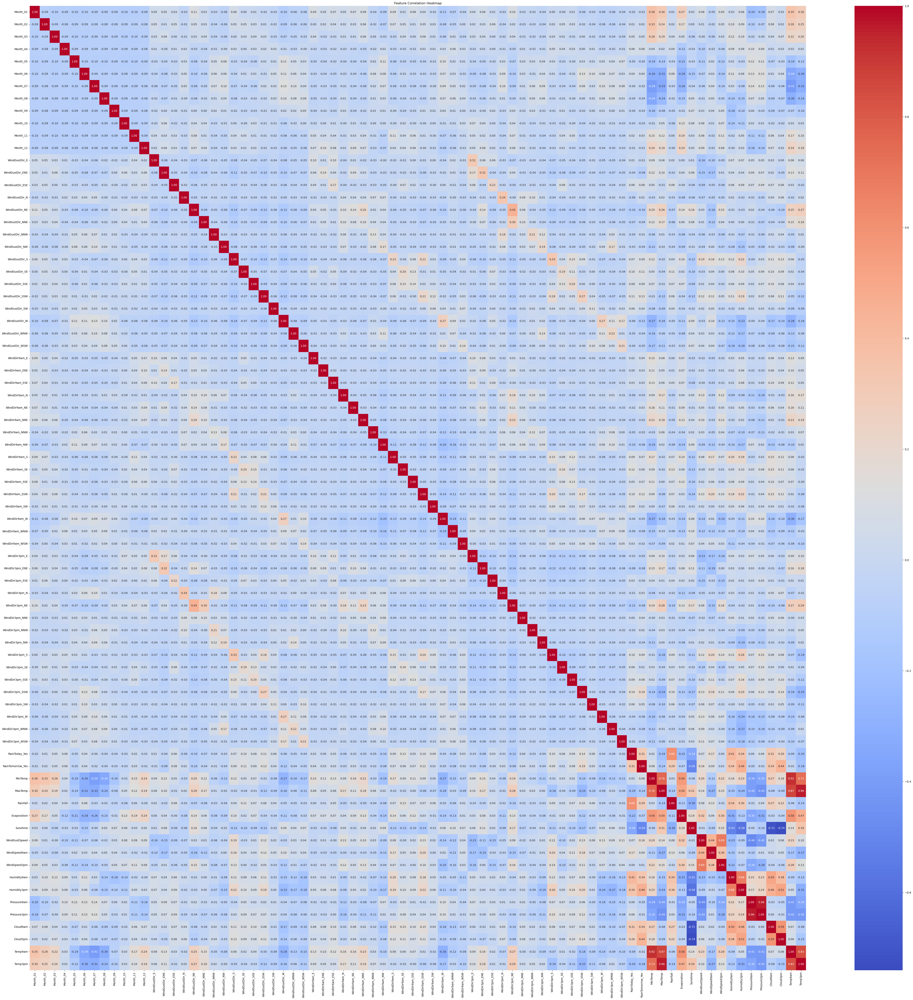

In [184]:
plt.figure(figsize=(64, 64))
sns_plot = sns.heatmap(syd_full_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("sydney_full_heapmap.png", dpi=300)

### Sydney has stronger correlation between numerical features, RainToday and RainTomorrow when compared to the whole Australia
In the Sydney heatmap, we see the colors are slightly deeper for most cells in the lowest 20% rows or rightmost 20% columns.
It makes sense since data for the whole Australia contain cities in different regions, things got averaged out so it won't show characteristics as string as a single city like Sydney here.
For example, the correlations between (temperature, humidity) and Month are stronger. The correlation between (windGust direction, wind direction) and humility are also stronger.

### Let's have a heapmap for numerical features, RainToday and RainTomorrow

In [189]:
selected_clms = ['MinTemp', 'MaxTemp',	'Rainfall',	'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed9am',	'WindSpeed3pm',	'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',	'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
syd_selected_corr_matrix = syd1[selected_clms].corr()

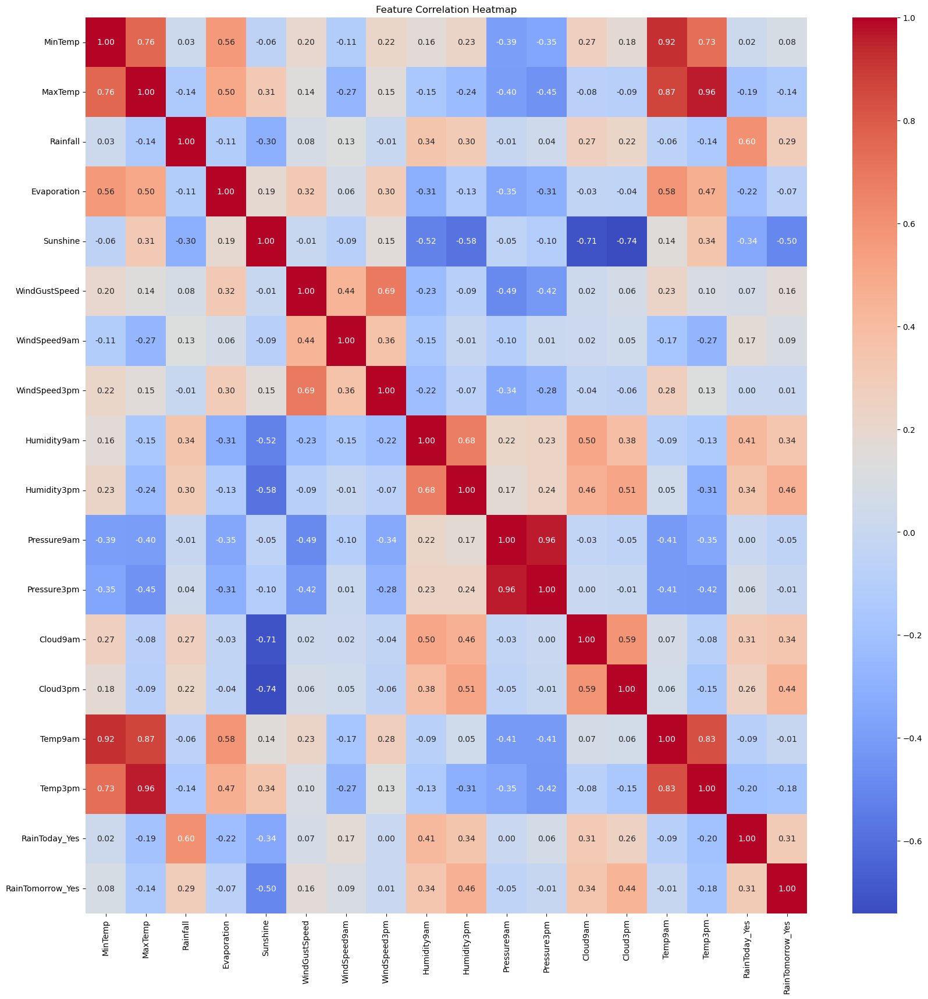

In [190]:
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(syd_selected_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("sydney_selected_heapmap.png", dpi=300)

We see humidity has positive correlation with (Cloud, Pressure and rain). We also see pressure has negative correlation with (rain, temperature, cloud, wind speed, evaporation)

### Let's have a heatmap for the months, some of the numerical features, RainToday and RainTomorrow

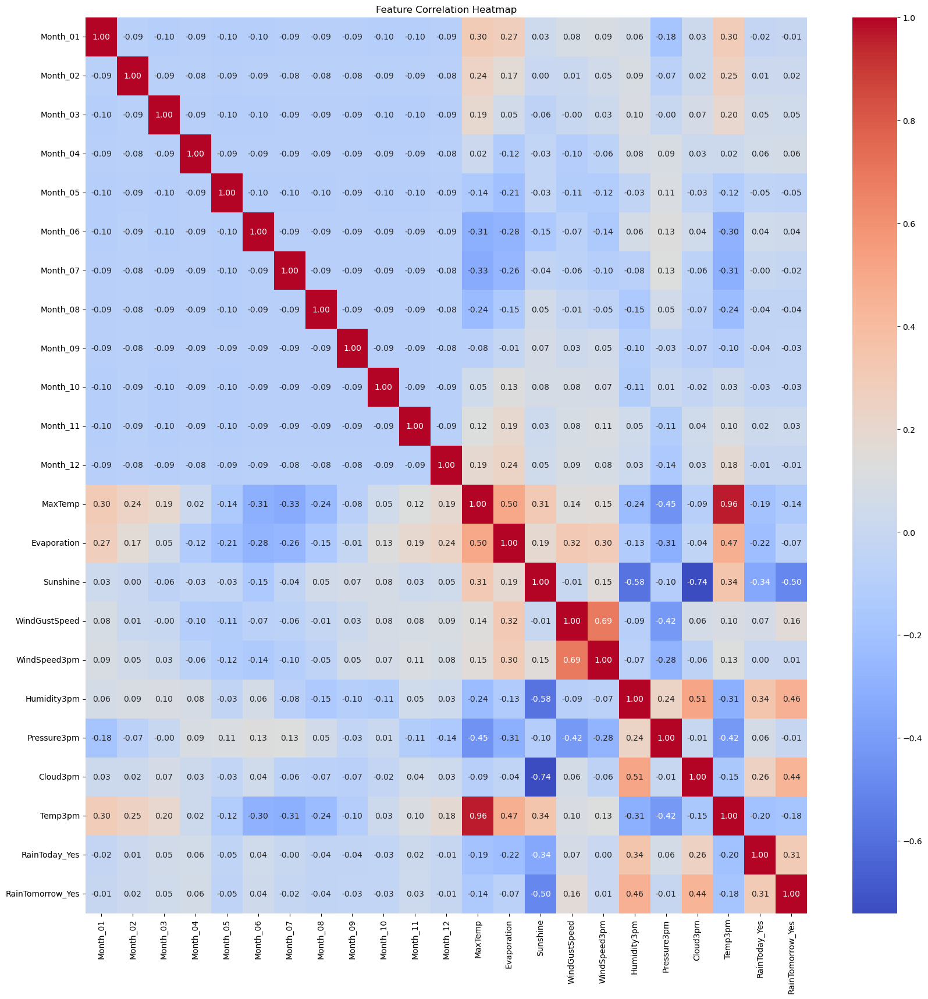

In [193]:
selected_clms2 = ['Month_01', 'Month_02', 'Month_03', 'Month_04', 'Month_05', 'Month_06', 'Month_07', 'Month_08', 'Month_09', 'Month_10', 'Month_11', 'Month_12', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed3pm', 'Humidity3pm', 'Pressure3pm', 'Cloud3pm', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
syd_selected_corr_matrix2 = syd1[selected_clms2].corr()
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(syd_selected_corr_matrix2, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("sydney_selected_heapmap2.png", dpi=300)

Here we can see the pattern of temperature, wind speed, pressure, humidity... across the year.

### LogisticRegression() for Sydney

In [197]:
X_syd, y_syd = syd.drop('RainTomorrow', axis = 1), syd['RainTomorrow']
X_syd = featureEncoding(X_syd, oneHot=True, PolyNomial=True)
X_syd[X_syd.columns] = StandardScaler().fit_transform(X_syd[X_syd.columns])
X_syd

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed WindSpeed3pm,WindGustSpeed Humidity9am,WindGustSpeed Humidity3pm,WindGustSpeed Pressure9am,WindGustSpeed Pressure3pm,WindGustSpeed Cloud9am,WindGustSpeed Cloud3pm,WindGustSpeed Temp9am,WindGustSpeed Temp3pm,WindSpeed9am^2,WindSpeed9am WindSpeed3pm,WindSpeed9am Humidity9am,WindSpeed9am Humidity3pm,WindSpeed9am Pressure9am,WindSpeed9am Pressure3pm,WindSpeed9am Cloud9am,WindSpeed9am Cloud3pm,WindSpeed9am Temp9am,WindSpeed9am Temp3pm,WindSpeed3pm^2,WindSpeed3pm Humidity9am,WindSpeed3pm Humidity3pm,WindSpeed3pm Pressure9am,WindSpeed3pm Pressure3pm,WindSpeed3pm Cloud9am,WindSpeed3pm Cloud3pm,WindSpeed3pm Temp9am,WindSpeed3pm Temp3pm,Humidity9am^2,Humidity9am Humidity3pm,Humidity9am Pressure9am,Humidity9am Pressure3pm,Humidity9am Cloud9am,Humidity9am Cloud3pm,Humidity9am Temp9am,Humidity9am Temp3pm,Humidity3pm^2,Humidity3pm Pressure9am,Humidity3pm Pressure3pm,Humidity3pm Cloud9am,Humidity3pm Cloud3pm,Humidity3pm Temp9am,Humidity3pm Temp3pm,Pressure9am^2,Pressure9am Pressure3pm,Pressure9am Cloud9am,Pressure9am Cloud3pm,Pressure9am Temp9am,Pressure9am Temp3pm,Pressure3pm^2,Pressure3pm Cloud9am,Pressure3pm Cloud3pm,Pressure3pm Temp9am,Pressure3pm Temp3pm,Cloud9am^2,Cloud9am Cloud3pm,Cloud9am Temp9am,Cloud9am Temp3pm,Cloud3pm^2,Cloud3pm Temp9am,Cloud3pm Temp3pm,Temp9am^2,Temp9am Temp3pm,Temp3pm^2
0,-0.312629,-0.27931,-0.311783,-0.295411,-0.316838,-0.305390,-0.300645,-0.300211,-0.298907,3.247199,-0.304961,-0.282491,-0.210226,3.506346,-0.174667,-0.142697,-0.356034,-0.266790,-0.152019,-0.216407,-0.383627,-0.191924,-0.255774,-0.339794,-0.172657,-0.363808,-0.233099,-0.253822,-0.163694,

In [198]:
X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)
lgr_syd = LogisticRegression(max_iter=1000).fit(X_syd_train, y_syd_train)

In [199]:
accuracy_score(y_syd_train, lgr_syd.predict(X_syd_train))

0.8508771929824561

In [200]:
accuracy_score(y_syd_test, lgr_syd.predict(X_syd_test))

0.8526315789473684

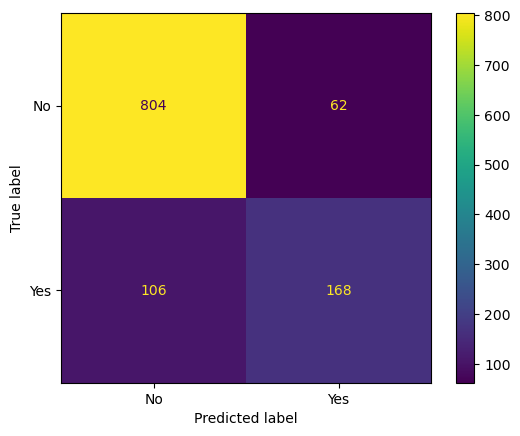

accuracy: 0.8526315789473684
precision: 0.7304347826086957
recall: 0.6131386861313869
specificity: 0.9284064665127021


In [201]:
cm = confusion_matrix(y_syd_test, lgr_syd.predict(X_syd_test))
plotConfusionMatrix(cm, lgr_syd)

### LogisticRegression() coefficients

In [204]:
coef_syd = sorted(zip(lgr_syd.coef_[0], X_syd_train.columns), reverse=True)
data_syd = {'features': [x[1] for x in coef_syd], 'coefficient': [x[0] for x in coef_syd]}
pd.DataFrame(data_syd).head(20)

,features,coefficient
0,Rainfall Cloud9am,1.052345
1,WindSpeed3pm Temp3pm,0.980298
2,Humidity3pm^2,0.892440
3,WindGustSpeed Humidity3pm,0.788515
4,MinTemp Temp3pm,0.761266
5,Humidity9am Pressure3pm,0.760532
6,Humidity9am Pressure9am,0.729346
7,Rainfall Humidity9am,0.697189
8,Humidity9am,0.675137
9,Cloud9am Cloud3pm,0.648489


## Let's build a model for Perth

In [211]:
pth = df0[df0['Location'] == 'Perth']
pth

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
120639,07,Perth,6.4,20.7,0.0,1.8,7.0,NE,22.0,ESE,ENE,6.0,9.0,80.0,39.0,1024.1,1019.0,0.0,6.0,11.1,19.7,No,No
120641,07,Perth,9.5,19.2,1.8,1.2,4.7,W,26.0,NNE,NNW,11.0,6.0,93.0,73.0,1019.3,1018.4,6.0,6.0,13.2,17.7,Yes,Yes
120642,07,Perth,9.5,16.4,1.8,1.4,4.9,WSW,44.0,W,SW,13.0,17.0,69.0,57.0,1020.4,1022.1,7.0,5.0,15.9,16.0,Yes,Yes
120643,07,Perth,0.7,15.9,6.8,2.4,9.3,NNE,24.0,ENE,NE,4.0,7.0,86.0,41.0,1032.0,1029.6,0.0,1.0,6.9,15.5,Yes,No
120644,07,Perth,0.7,18.3,0.0,0.8,9.3,N,37.0,NE,NNE,15.0,13.0,72.0,36.0,1028.9,1024.2,1.0,5.0,8.7,17.9,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123826,06,Perth,10.3,19.9,0.2,1.8,7.5,NW,37.0,NNE,NNW,9.0,15.0,89.0,60.0,1017.1,1013.8,5.0,6.0,13.0,18.5,No,Yes
123827,06,Perth,13.0,16.8,61.2,3.6,0.0,SSW,46.0,W,SW,17.0,17.0,90.0,75.0,1005.6,1008.9,7.0,7.0,16.4,15.6,Yes,No
123828,06,Perth,13.3,18.9,0.4,1.8,6.5,SE,37.0,SE,ESE,11.0,11.0,85.0,65.0,1019.2,1019.4,6.0,6.0,15.1,18.0,No,No
123829,06,Perth,11.5,18.2,0.0,3.8,9.3,SE,30.0,ESE,ESE,9.0,11.0,62.0,47.0,1025.9,1023.4,1.0,3.0,14.0,17.6,No,No


In [212]:
pth = pth.drop(columns=['Location'])
pth

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
120639,07,6.4,20.7,0.0,1.8,7.0,NE,22.0,ESE,ENE,6.0,9.0,80.0,39.0,1024.1,1019.0,0.0,6.0,11.1,19.7,No,No
120641,07,9.5,19.2,1.8,1.2,4.7,W,26.0,NNE,NNW,11.0,6.0,93.0,73.0,1019.3,1018.4,6.0,6.0,13.2,17.7,Yes,Yes
120642,07,9.5,16.4,1.8,1.4,4.9,WSW,44.0,W,SW,13.0,17.0,69.0,57.0,1020.4,1022.1,7.0,5.0,15.9,16.0,Yes,Yes
120643,07,0.7,15.9,6.8,2.4,9.3,NNE,24.0,ENE,NE,4.0,7.0,86.0,41.0,1032.0,1029.6,0.0,1.0,6.9,15.5,Yes,No
120644,07,0.7,18.3,0.0,0.8,9.3,N,37.0,NE,NNE,15.0,13.0,72.0,36.0,1028.9,1024.2,1.0,5.0,8.7,17.9,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123826,06,10.3,19.9,0.2,1.8,7.5,NW,37.0,NNE,NNW,9.0,15.0,89.0,60.0,1017.1,1013.8,5.0,6.0,13.0,18.5,No,Yes
123827,06,13.0,16.8,61.2,3.6,0.0,SSW,46.0,W,SW,17.0,17.0,90.0,75.0,1005.6,1008.9,7.0,7.0,16.4,15.6,Yes,No
123828,06,13.3,18.9,0.4,1.8,6.5,SE,37.0,SE,ESE,11.0,11.0,85.0,65.0,1019.2,1019.4,6.0,6.0,15.1,18.0,No,No
123829,06,11.5,18.2,0.0,3.8,9.3,SE,30.0,ESE,ESE,9.0,11.0,62.0,47.0,1025.9,1023.4,1.0,3.0,14.0,17.6,No,No


In [213]:
pth1 = featureEncoding(pth, oneHot=True, PolyNomial=False)


### Check Perth's average and monthly raining probability

In [216]:
pth1[(pth1['RainTomorrow_Yes'] == 1.0)].shape[0]/pth1.shape[0]

0.20363636363636364

On average it rains less in Perth

In [218]:
rainData = {'month': [], 'raining Probability': []}

for m in ['Month_01', 'Month_02', 'Month_03', 'Month_04', 'Month_05', 'Month_06', 'Month_07', 'Month_08', 'Month_09', 'Month_10', 'Month_11', 'Month_12']:
    p = pth1[(pth1[m] == 1.0) & (pth1['RainTomorrow_Yes'] == 1.0)].shape[0] / pth1[pth1[m] == 1.0].shape[0]
    rainData['month'].append(m)
    rainData['raining Probability'].append(p)
rainData
rainDF = pd.DataFrame(rainData)
rainDF

,month,raining Probability
0,Month_01,0.066914
1,Month_02,0.040179
2,Month_03,0.077206
3,Month_04,0.128440
4,Month_05,0.272727
5,Month_06,0.329004
6,Month_07,0.459677
7,Month_08,0.386100
8,Month_09,0.347170
9,Month_10,0.148014


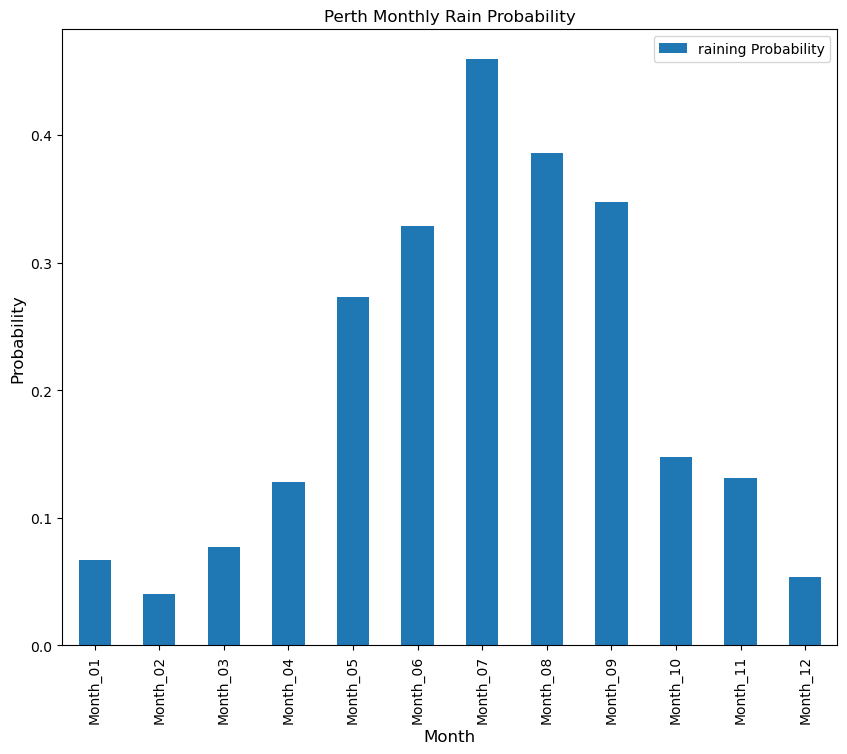

In [219]:
ax = rainDF.plot.bar(x='month', title ="Perth Monthly Rain Probability", figsize=(10, 8), legend=True)
ax.set_xlabel("Month", fontsize=12)
ax.set_ylabel("Probability", fontsize=12)
plt.show()

### Perth has a typical mediterranean climate, very dry in the summer and wet in the winter

### Accuracy of guessing tomorrow's weather is same as today, for Perth

In [225]:
df2 = df[df['Location'] == 'Perth']
(df2[(df2['RainToday'] == 'No') & (df2['RainTomorrow'] == 'No')].shape[0] + df2[(df2['RainToday'] == 'Yes') & (df2['RainTomorrow'] == 'Yes')].shape[0]) / df2.shape[0]

0.8023140495867769

We have better luck in guessing Perth's weather, which is even sligtly better than guessing the majority class

In [227]:


pth1[pth1.columns] = StandardScaler().fit_transform(pth1[pth1.columns])
pth1

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,3.227243,-0.202360,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,-0.202360,-0.219462,-0.310502,-0.428897,-0.361135,3.338951,-0.191491,-0.390360,-0.294221,-0.1034,-0.142254,-0.266076,-0.249297,-0.290223,-0.200584,-0.192417,-0.195172,-0.159448,-0.179084,-0.21445,4.700171,-0.214450,-0.143458,-0.186804,-0.150501,-0.141039,-0.210199,-0.178098,-0.229216,-0.194257,-0.396523,-0.525198,-0.313691,-0.243256,-0.362887,-0.493276,-0.505676,-1.328990,-0.737081,-0.323062,-1.147644,-0.538355,-1.412358,-1.116464,-1.118194,1.054241,-0.459687,0.994354,0.615860,-1.201320,0.954267,-1.447300,-0.663980
1,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,-0.309862,-0.202360,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,4.941677,-0.219462,-0.310502,-0.428897,-0.361135,-0.299495,-0.191491,-0.390360,3.398804,-0.1034,-0.142254,-0.266076,-0.249297,-0.290223,-0.200584,-0.192417,-0.195172,-0.159448,-0.179084,-0.21445,-0.212758,-0.214450,-0.143458,-0.186804,-0.150501,7.090218,-0.210199,-0.178098,-0.229216,-0.194257,-0.396523,-0.525198,-0.313691,-0.243256,-0.362887,2.027263,1.977553,-0.710968,-0.983428,-0.008830,-1.323299,-1.202553,-0.984841,-0.037315,-1.708000,1.809011,1.579510,0.255685,0.517081,0.947912,0.954267,-1.050053,-1.005426
2,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,-0.309862,-0.202360,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,-0.202360,-0.219462,3.220587,-0.428897,-0.361135,-0.299495,-0.191491,-0.390360,-0.294221,-0.1034,-0.142254,-0.266076,-0.249297,-0.290223,-0.200584,-0.192417,5.123695,-0.159448,-0.179084,-0.21445,-0.212758,-0.214450,-0.143458,-0.186804,-0.150501,-0.141039,-0.210199,-0.178098,-0.229216,-0.194257,-0.396523,1.904044,-0.313691,-0.243256,-0.362887,2.027263,1.977553,-0.710968,-1.443275,-0.008830,-1.264747,-1.144796,0.938981,0.394344,0.454622,0.415589,0.619888,0.424964,1.126219,1.306117,0.582083,-0.539306,-1.295655
3,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,-0.309862,4.941677,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,-0.202360,-0.219462,-0.310502,-0.428897,2.769047,-0.299495,-0.191491,-0.390360,-0.294221,-0.1034,-0.142254,-0.266076,-0.249297,-0.290223,-0.200584,-0.192417,-0.195172,-0.159448,-0.179084,-0.21445,-0.212758,-0.214450,-0.143458,5.353211,-0.150501,-0.141039,-0.210199,-0.178098,-0.229216,-0.194257,-0.396523,-0.525198,-0.313691,-0.243256,-0.362887,2.027263,-0.505676,-2.465353,-1.525391,0.864037,-0.971988,0.125842,-1.198599,-1.548124,-1.51139

In [229]:
pth_full_corr_matrix = pth1.corr()

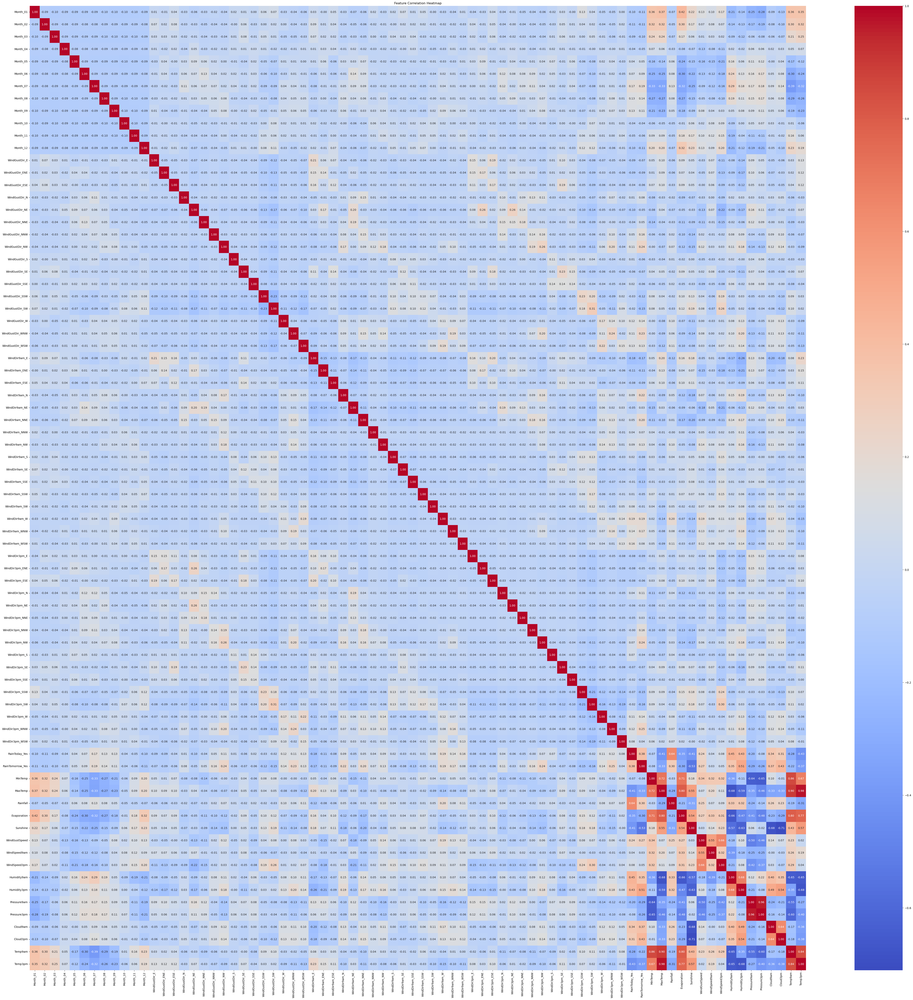

In [230]:
plt.figure(figsize=(64, 64))
sns_plot = sns.heatmap(pth_full_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("perth_full_heapmap.png", dpi=300)

### The Perth correlation heapmap also shows stronger correlation between numerical features, RainToday and RainTomorrow when compared to the whole Australia¶
Compared to Sydney, the lower left corners have a few wider blue(negative correlation) strips, they are temperture and Month correlation - the wider blue strips mean Perth have more cool/cold months.

In [232]:
selected_clms = ['MinTemp', 'MaxTemp',	'Rainfall',	'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed9am',	'WindSpeed3pm',	'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm',	'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
pth_selected_corr_matrix = pth1[selected_clms].corr()

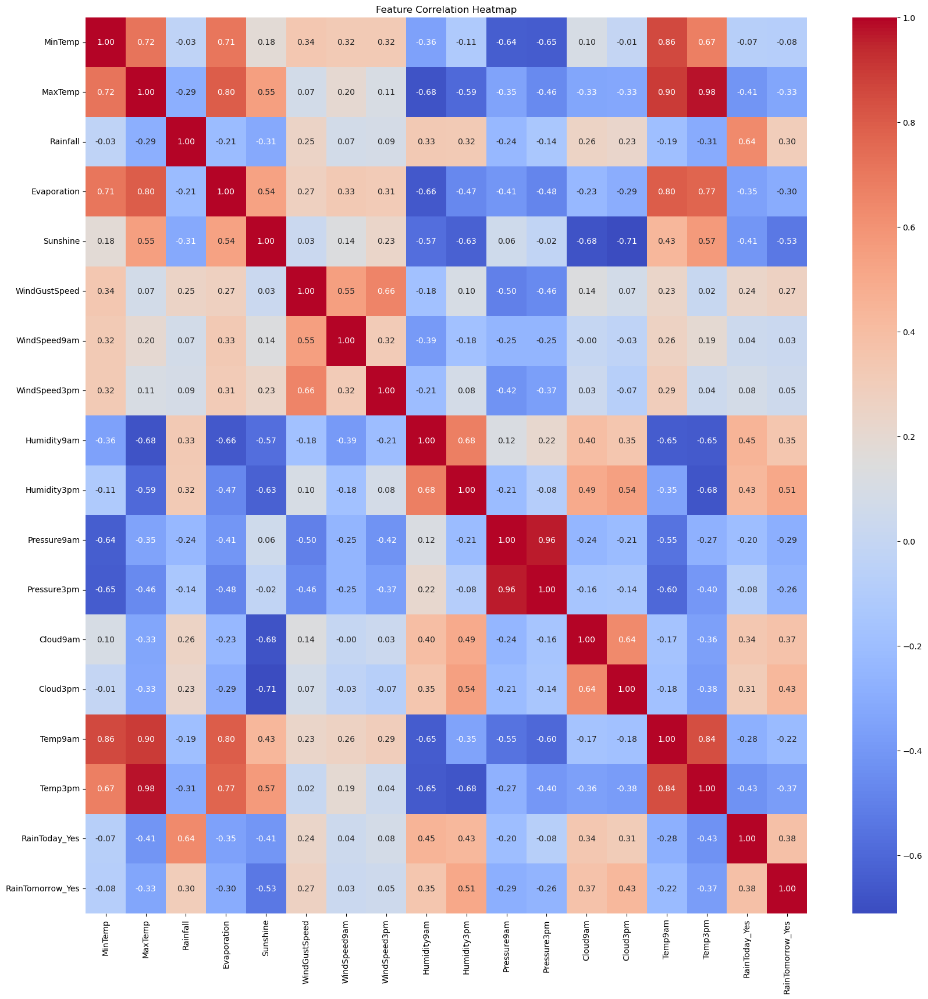

In [233]:
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(pth_selected_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("perth_selected_heapmap.png", dpi=300)

### Heatmap for the months, some of the numerical features, RainToday and RainTomorrow

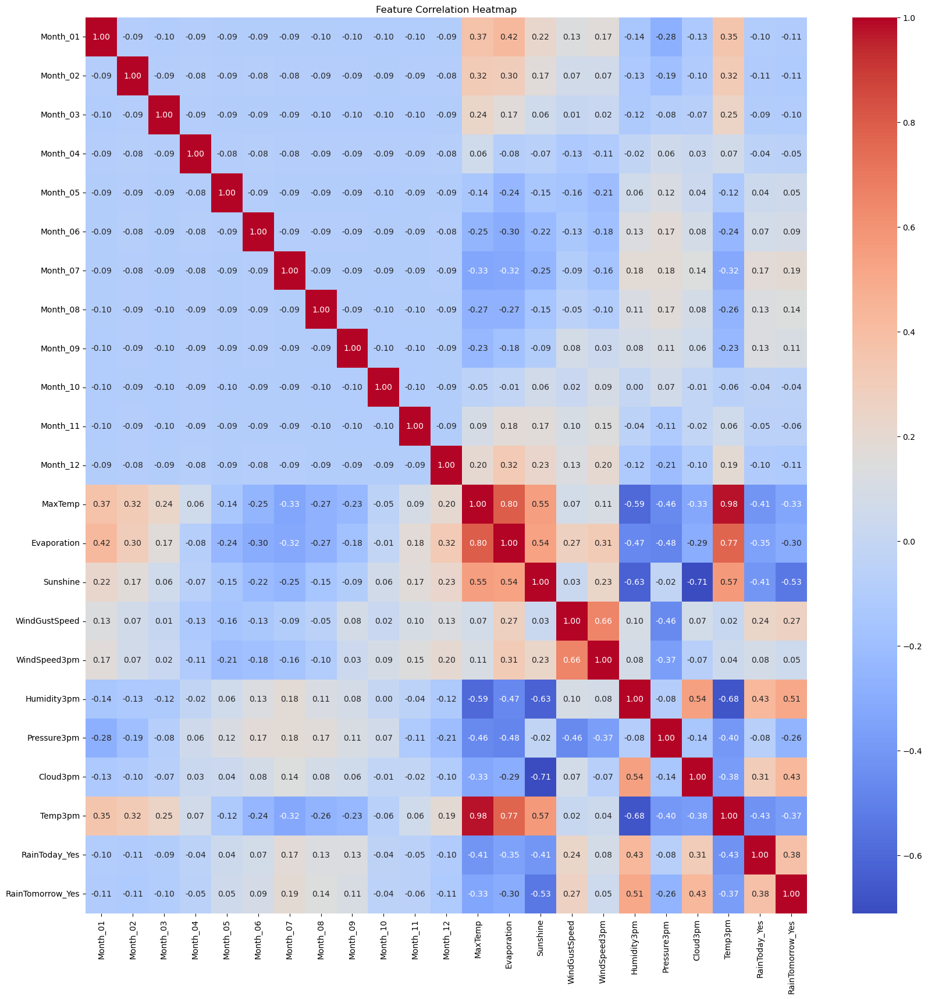

In [244]:
selected_clms2 = ['Month_01', 'Month_02', 'Month_03', 'Month_04', 'Month_05', 'Month_06', 'Month_07', 'Month_08', 'Month_09', 'Month_10', 'Month_11', 'Month_12', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed',	'WindSpeed3pm', 'Humidity3pm', 'Pressure3pm', 'Cloud3pm', 'Temp3pm', 'RainToday_Yes', 'RainTomorrow_Yes']
pth_selected_corr_matrix2 = pth1[selected_clms2].corr()
plt.figure(figsize=(20, 20))
sns_plot = sns.heatmap(pth_selected_corr_matrix2, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlation Heatmap')
plt.show()
fig = sns_plot.get_figure()
fig.savefig("perth_selected_heapmap2.png", dpi=300)

The weather pattern across the year is quite visible.

In [255]:
X_pth, y_pth = pth.drop('RainTomorrow', axis = 1), pth['RainTomorrow']
X_pth = featureEncoding(X_pth, oneHot=True, PolyNomial=True)
X_pth[X_pth.columns] = StandardScaler().fit_transform(X_pth[X_pth.columns])
X_pth

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed WindSpeed3pm,WindGustSpeed Humidity9am,WindGustSpeed Humidity3pm,WindGustSpeed Pressure9am,WindGustSpeed Pressure3pm,WindGustSpeed Cloud9am,WindGustSpeed Cloud3pm,WindGustSpeed Temp9am,WindGustSpeed Temp3pm,WindSpeed9am^2,WindSpeed9am WindSpeed3pm,WindSpeed9am Humidity9am,WindSpeed9am Humidity3pm,WindSpeed9am Pressure9am,WindSpeed9am Pressure3pm,WindSpeed9am Cloud9am,WindSpeed9am Cloud3pm,WindSpeed9am Temp9am,WindSpeed9am Temp3pm,WindSpeed3pm^2,WindSpeed3pm Humidity9am,WindSpeed3pm Humidity3pm,WindSpeed3pm Pressure9am,WindSpeed3pm Pressure3pm,WindSpeed3pm Cloud9am,WindSpeed3pm Cloud3pm,WindSpeed3pm Temp9am,WindSpeed3pm Temp3pm,Humidity9am^2,Humidity9am Humidity3pm,Humidity9am Pressure9am,Humidity9am Pressure3pm,Humidity9am Cloud9am,Humidity9am Cloud3pm,Humidity9am Temp9am,Humidity9am Temp3pm,Humidity3pm^2,Humidity3pm Pressure9am,Humidity3pm Pressure3pm,Humidity3pm Cloud9am,Humidity3pm Cloud3pm,Humidity3pm Temp9am,Humidity3pm Temp3pm,Pressure9am^2,Pressure9am Pressure3pm,Pressure9am Cloud9am,Pressure9am Cloud3pm,Pressure9am Temp9am,Pressure9am Temp3pm,Pressure3pm^2,Pressure3pm Cloud9am,Pressure3pm Cloud3pm,Pressure3pm Temp9am,Pressure3pm Temp3pm,Cloud9am^2,Cloud9am Cloud3pm,Cloud9am Temp9am,Cloud9am Temp3pm,Cloud3pm^2,Cloud3pm Temp9am,Cloud3pm Temp3pm,Temp9am^2,Temp9am Temp3pm,Temp3pm^2
0,-0.312418,-0.282792,-0.314327,-0.278681,-0.302109,-0.287536,3.346279,-0.306002,-0.309862,-0.317491,-0.310502,-0.295546,-0.217802,-0.237097,-0.206746,-0.142254,3.227243,-0.202360,-0.134817,-0.216968,-0.172081,-0.205001,-0.189628,-0.420765,-0.536453,-0.202360,-0.219462,-0.310502,-0.428897

In [256]:
X_pth_train, X_pth_test, y_pth_train, y_pth_test = train_test_split(X_pth, y_pth, random_state=42)
lgr_pth = LogisticRegression(max_iter=1000).fit(X_pth_train, y_pth_train)

In [257]:
accuracy_score(y_pth_train, lgr_pth.predict(X_pth_train))

0.9307760141093474

In [258]:
accuracy_score(y_pth_test, lgr_pth.predict(X_pth_test))

0.8996036988110965

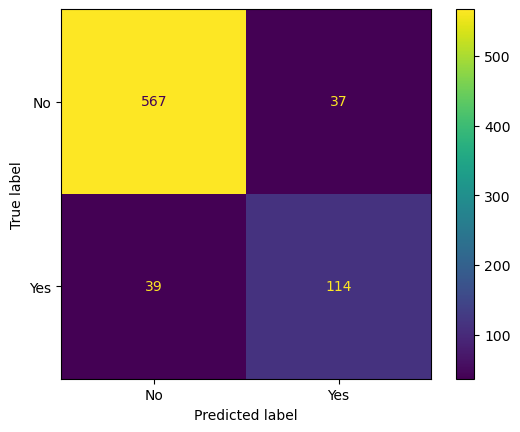

accuracy: 0.8996036988110965
precision: 0.7549668874172185
recall: 0.7450980392156863
specificity: 0.9387417218543046


In [259]:
cm = confusion_matrix(y_pth_test, lgr_pth.predict(X_pth_test))
plotConfusionMatrix(cm, lgr_pth)

### The LogisticRegression model has much better performance for Perth.
Perth weather is easier to predict (more stable) I suppose, this might be the case for most places, like California, with mediterranean climate.

### LogisticRegression() coefficients

In [264]:
coef_pth = sorted(zip(lgr_pth.coef_[0], X_pth_train.columns), reverse=True)
data_pth = {'features': [x[1] for x in coef_pth], 'coefficient': [x[0] for x in coef_pth]}
pd.DataFrame(data_pth).head(20)

,features,coefficient
0,Pressure9am,0.898260
1,Pressure9am^2,0.805325
2,Rainfall Cloud9am,0.725314
3,WindGustSpeed Humidity9am,0.674656
4,Humidity3pm Cloud3pm,0.666880
5,Rainfall Cloud3pm,0.664904
6,WindGustSpeed WindSpeed3pm,0.643608
7,Humidity3pm^2,0.617555
8,WindSpeed3pm Cloud3pm,0.533864
9,Temp3pm^2,0.521424


# Optimization, and more Feature Engineering

### Feature Engineering to include square root of numerical values

In [266]:
df0

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,Cobar,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,01,Cobar,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,01,Cobar,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,01,Cobar,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,01,Cobar,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,Darwin,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,No,No
142299,06,Darwin,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,No,No
142300,06,Darwin,20.7,32.8,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,No,No
142301,06,Darwin,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,No,No


In [279]:
# numerical_selector = make_column_selector(dtype_include=['int64', 'float64'])

# # Identify categorical and numerical columns
# categorical_columns = categorical_selector(df)
# numerical_columns = numerical_selector(df)
numerical_selector = make_column_selector(dtype_include=['int64', 'float64'])

In [281]:
numerical_selector(df0)

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

### change temperature to Kelvin based

In [306]:
df0['MinTemp'] ** (1/2)

6049      4.230839
6050      4.289522
6052      4.404543
6053      4.679744
6054      4.919350
            ...   
142298    4.393177
142299    4.604346
142300    4.549725
142301    4.415880
142302    4.494441
Name: MinTemp, Length: 56420, dtype: float64

In [358]:
df20 = df0.copy()

In [360]:
# df20['MinTemp'] = df20['MinTemp'] + 273.15

In [362]:
# df20['MaxTemp'] = df20['MaxTemp'] + 273.15

In [364]:
df20['MinTemp'] = df20['MinTemp'] + 273.15
df20['MaxTemp'] = df20['MaxTemp'] + 273.15
df20['Temp9am'] = df20['Temp9am'] + 273.15
df20['Temp3pm'] = df20['Temp3pm'] + 273.15

In [366]:
df20

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,01,Cobar,291.05,308.35,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,299.75,306.55,No,No
6050,01,Cobar,291.55,302.05,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,293.45,300.15,No,No
6052,01,Cobar,292.55,310.75,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,301.85,308.05,No,No
6053,01,Cobar,295.05,311.55,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,302.25,308.75,No,No
6054,01,Cobar,297.35,314.15,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,306.75,310.75,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,Darwin,292.45,306.55,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,297.65,305.45,No,No
142299,06,Darwin,294.35,305.75,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,297.95,305.15,No,No
142300,06,Darwin,293.85,305.95,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,297.95,305.25,No,No
142301,06,Darwin,292.65,304.95,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,297.95,302.35,No,No


In [369]:
# aus = df20.drop(columns='Location')
# X_aus, y_aus = aus.drop('RainTomorrow', axis = 1), aus['RainTomorrow']
# X_aus = featureEncoding(X_aus, oneHot=True, PolyNomial=True)


In [371]:
df20.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000,56420.000000
mean,286.614770,297.369206,2.130397,5.503135,7.735626,40.877366,15.667228,19.786778,65.874123,49.601985,1017.239505,1014.795580,4.241705,4.326515,291.354961,295.860333
std,6.416689,6.970676,7.014822,3.696282,3.758153,13.335232,8.317005,8.510180,18.513289,20.197040,6.909357,6.870892,2.797162,2.647251,6.567991,6.836543
min,266.450000,277.250000,0.000000,0.000000,0.000000,9.000000,2.000000,2.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,272.450000,276.850000
25%,281.750000,291.850000,0.000000,2.800000,5.000000,31.000000,9.000000,13.000000,55.000000,35.000000,1012.700000,1010.100000,1.000000,2.000000,286.250000,290.550000
50%,286.350000,297.050000,0.000000,5.000000,8.600000,39.000000,15.000000,19.000000,67.000000,50.000000,1017.200000,1014.700000,5.000000,5.000000,290.950000,295.550000
75%,291.550000,302.850000,0.600000,7.400000,10.700000,48.000000,20.000000,26.000000,79.000000,63.000000,1021.800000,1019.400000,7.000000,7.000000,296.450000,301.050000
max,304.550000,321.250000,206.200000,81.200000,14.500000,124.000000,67.000000,76.000000,100.000000,100.000000,1040.400000,1038.900000,8.000000,9.000000,312.550000,319.250000


In [377]:
for f in numerical_selector(df20):
    df20[f+'sq_root'] = df20[f] ** (1/2)

In [379]:
df20

,Month,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root
6049,01,Cobar,291.05,308.35,0.0,12.0,12.3,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,299.75,306.55,No,No,17.060188,17.559897,0.0,3.464102,3.507136,6.928203,2.449490,4.472136,4.472136,3.605551,31.722232,31.692270,1.414214,2.236068,17.313290,17.508569
6050,01,Cobar,291.55,302.05,0.0,14.8,13.0,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,293.45,300.15,No,No,17.074835,17.379586,0.0,3.847077,3.605551,6.082763,4.358899,4.358899,5.477226,2.828427,31.826090,31.813519,1.000000,1.000000,17.130382,17.324838
6052,01,Cobar,292.55,310.75,0.0,10.8,10.6,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,301.85,308.05,No,No,17.104093,17.628103,0.0,3.286335,3.255764,6.782330,5.477226,3.872983,6.480741,4.690416,31.816662,31.767908,1.000000,2.449490,17.373831,17.551353
6053,01,Cobar,295.05,311.55,0.0,11.4,12.2,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,302.25,308.75,No,No,17.177020,17.650779,0.0,3.376389,3.492850,5.567764,2.449490,2.449490,6.082763,4.690416,31.822948,31.766334,1.000000,2.236068,17.385339,17.571283
6054,01,Cobar,297.35,314.15,0.0,11.2,8.4,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,306.75,310.75,No,No,17.243839,17.724277,0.0,3.346640,2.898275,5.916080,4.123106,3.605551,4.358899,3.872983,31.791508,31.739565,1.000000,2.449490,17.514280,17.628103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,06,Darwin,292.45,306.55,0.0,6.0,11.0,ENE,35.0,SE,NE,9.0,20.0,63.0,32.0,1013.9,1010.5,0.0,1.0,297.65,305.45,No,No,17.101170,17.508569,0.0,2.449490,3.316625,5.916080,3.000000,4.472136,7.937254,5.656854,31.841796,31.788363,0.000000,1.000000,17.252536,17.477128
142299,06,Darwin,294.35,305.75,0.0,7.6,8.6,E,37.0,SE,SE,13.0,11.0,56.0,28.0,1014.6,1011.2,7.0,0.0,297.95,305.15,No,No,17.156631,17.485708,0.0,2.756810,2.932576,6.082763,3.605551,3.316625,7.483315,5.291503,31.852786,31.799371,2.645751,0.000000,17.261228,17.468543
142300,06,Darwin,293.85,305.95,0.0,5.6,11.0,E,33.0,E,W,17.0,11.0,46.0,23.0,1015.3,1011.8,0.0,0.0,297.95,305.25,No,No,17.142054,17.491426,0.0,2.366432,3.316625,5.744563,4.123106,3.316625,6.782330,4.795832,31.863773,31.808804,0.000000,0.000000,17.261228,17.471405
142301,06,Darwin,292.65,304.95,0.0,6.2,10.6,ESE,26.0,SE,NNW,9.0,17.0,62.0,58.0,1014.9,1010.7,1.0,1.0,297.95,302.35,No,No,17.107016,17.462818,0.0,2.489980,3.255764,5.099020,3.000000,4.123106,7.874008,7.615773,31.857495,31.791508,1.000000,1.000000,17.261228,17.388214


In [382]:
aus = df20.drop(columns='Location')
X_aus, y_aus = aus.drop('RainTomorrow', axis = 1), aus['RainTomorrow']
X_aus = featureEncoding(X_aus, oneHot=True, PolyNomial=True)

In [384]:
X_aus

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTempsq_root,MinTemp MaxTempsq_root,MinTemp Rainfallsq_root,MinTemp Evaporationsq_root,MinTemp Sunshinesq_root,MinTemp WindGustSpeedsq_root,MinTemp WindSpeed9amsq_root,MinTemp WindSpeed3pmsq_root,MinTemp Humidity9amsq_root,MinTemp Humidity3pmsq_root,MinTemp Pressure9amsq_root,MinTemp Pressure3pmsq_root,MinTemp Cloud9amsq_root,MinTemp Cloud3pmsq_root,MinTemp Temp9amsq_root,MinTemp Temp3pmsq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTempsq_root,MaxTemp MaxTempsq_root,MaxTemp Rainfallsq_root,MaxTemp Evaporationsq_root,MaxTemp Sunshinesq_root,MaxTemp WindGustSpeedsq_root,MaxTemp WindSpeed9amsq_root,MaxTemp WindSpeed3pmsq_root,MaxTemp Humidity9amsq_root,MaxTemp Humidity3pmsq_root,MaxTemp Pressure9amsq_root,MaxTemp Pressure3pmsq_root,MaxTemp Cloud9amsq_root,MaxTemp Cloud3pmsq_root,MaxTemp Temp9amsq_root,MaxTemp Temp3pmsq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTempsq_root,Rainfall MaxTempsq_root,Rainfall Rainfallsq_root,Rainfall Evaporationsq_root,Rainfall Sunshinesq_root,Rainfall WindGustSpeedsq_root,Rainfall WindSpeed9amsq_root,Rainfall WindSpeed3pmsq_root,Rainfall Humidity9amsq_root,Rainfall Humidity3pmsq_root,Rainfall Pressure9amsq_root,Rainfall Pressure3pmsq_root,Rainfall Cloud9amsq_root,Rainfall Cloud3pmsq_root,Rainfall Temp9amsq_root,Rainfall Temp3pmsq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTempsq_root,Evaporation MaxTempsq_root,Evaporation Rainfallsq_root,Evaporation Evaporationsq_root,Evaporation Sunshinesq_root,Evaporation WindGustSpeedsq_root,Evaporation WindSpeed9amsq_root,Evaporation WindSpeed3pmsq_root,Evaporation Humidity9amsq_root,Evaporation Humidity3pmsq_root,Evaporation Pressure9amsq_root,Evaporation Pressure3pmsq_root,Eva

In [386]:
X_aus[X_aus.columns] = StandardScaler().fit_transform(X_aus[X_aus.columns])
X_aus_train, X_aus_test, y_aus_train, y_aus_test = train_test_split(X_aus, y_aus, random_state=42)
X_aus

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTempsq_root,MinTemp MaxTempsq_root,MinTemp Rainfallsq_root,MinTemp Evaporationsq_root,MinTemp Sunshinesq_root,MinTemp WindGustSpeedsq_root,MinTemp WindSpeed9amsq_root,MinTemp WindSpeed3pmsq_root,MinTemp Humidity9amsq_root,MinTemp Humidity3pmsq_root,MinTemp Pressure9amsq_root,MinTemp Pressure3pmsq_root,MinTemp Cloud9amsq_root,MinTemp Cloud3pmsq_root,MinTemp Temp9amsq_root,MinTemp Temp3pmsq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTempsq_root,MaxTemp MaxTempsq_root,MaxTemp Rainfallsq_root,MaxTemp Evaporationsq_root,MaxTemp Sunshinesq_root,MaxTemp WindGustSpeedsq_root,MaxTemp WindSpeed9amsq_root,MaxTemp WindSpeed3pmsq_root,MaxTemp Humidity9amsq_root,MaxTemp Humidity3pmsq_root,MaxTemp Pressure9amsq_root,MaxTemp Pressure3pmsq_root,MaxTemp Cloud9amsq_root,MaxTemp Cloud3pmsq_root,MaxTemp Temp9amsq_root,MaxTemp Temp3pmsq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTempsq_root,Rainfall MaxTempsq_root,Rainfall Rainfallsq_root,Rainfall Evaporationsq_root,Rainfall Sunshinesq_root,Rainfall WindGustSpeedsq_root,Rainfall WindSpeed9amsq_root,Rainfall WindSpeed3pmsq_root,Rainfall Humidity9amsq_root,Rainfall Humidity3pmsq_root,Rainfall Pressure9amsq_root,Rainfall Pressure3pmsq_root,Rainfall Cloud9amsq_root,Rainfall Cloud3pmsq_root,Rainfall Temp9amsq_root,Rainfall Temp3pmsq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTempsq_root,Evaporation MaxTempsq_root,Evaporation Rainfallsq_root,Evaporation Evaporationsq_root,Evaporation Sunshinesq_root,Evaporation WindGustSpeedsq_root,Evaporation WindSpeed9amsq_root,Evaporation WindSpeed3pmsq_root,Evaporation Humidity9amsq_root,Evaporation Humidity3pmsq_root,Evaporation Pressure9amsq_root,Evaporation Pressure3pmsq_root,Eva

In [392]:
# X_aus_train, X_aus_test, y_aus_train, y_aus_test = train_test_split(X_aus, y_aus, random_state=42)

In [394]:
lgr = LogisticRegression(max_iter=1000).fit(X_aus_train, y_aus_train)
accuracy_score(y_aus_train, lgr.predict(X_aus_train))

0.8609712867777384

In [396]:
accuracy_score(y_aus_test, lgr.predict(X_aus_test))

0.858560794044665

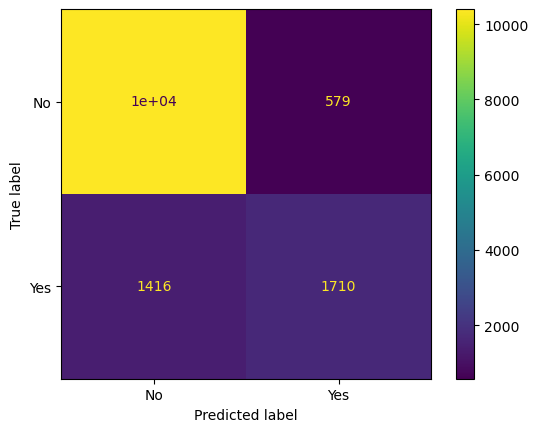

accuracy: 0.858560794044665
precision: 0.747051114023591
recall: 0.5470249520153551
specificity: 0.9472629565534202


In [398]:
cm = confusion_matrix(y_aus_test, lgr.predict(X_aus_test))
plotConfusionMatrix(cm, lgr)

### SVM

In [423]:
# params = {'kernel': ['rbf'],
#          'gamma': np.logspace(-4, 1, 100),}
start_time = time.time()
svc = SVC().fit(X_aus_train, y_aus_train)
end_time = time.time()
training_time = end_time - start_time

# params = {'kernel': ['rbf'],
#          'gamma': [0.001, 0.01, 0.1],}
# grid_svc = GridSearchCV(SVC(), params).fit(X_aus_train, y_aus_train)
# print(grid_svc2.score(X2_test, y2_test))
# print(grid_svc2.best_estimator_)
# print(grid_svc2.best_params_['kernel'])
# end_time = time.time()

print(f"Training time: {training_time:.4f} seconds")

KeyboardInterrupt: 

In [404]:
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

Training time: 442.3080 seconds


In [408]:
accuracy_score(y_aus_train, svc.predict(X_aus_train))

0.8768994446413801

In [412]:
accuracy_score(y_aus_test, svc.predict(X_aus_test))

0.8579227224388515

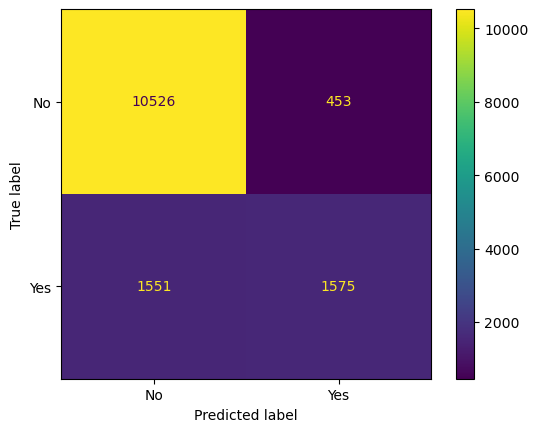

accuracy: 0.8579227224388515
precision: 0.7766272189349113
recall: 0.5038387715930902
specificity: 0.9587394116039712


In [414]:
cm = confusion_matrix(y_aus_test, svc.predict(X_aus_test))
plotConfusionMatrix(cm, svc)

In [ ]:
# knn1 = KNeighborsClassifier()
# start_time = time.time()
# knn1.fit(X1_train, y1_train)
# end_time = time.time()

# start_time = time.time()
# svc = SVC().fit(X_aus_train, y_aus_train)
# end_time = time.time()
# training_time = end_time - start_time
# print(f"Training time: {training_time:.4f} seconds")

In [416]:
start_time = time.time()
accu = []
for i in range(2, 21):
    dtci = DecisionTreeClassifier(max_depth = i).fit(X_aus_train, y_aus_train)
    dtci_preds = dtci.predict(X_aus_test)
    accu.append(("maxDepth:", i, "accuracy:", accuracy_score(y_aus_test, dtci_preds)))

accu
end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time:.4f} seconds")

[('maxDepth:', 2, 'accuracy:', 0.8221907125132931),
 ('maxDepth:', 3, 'accuracy:', 0.8337468982630273),
 ('maxDepth:', 4, 'accuracy:', 0.8436724565756824),
 ('maxDepth:', 5, 'accuracy:', 0.8441687344913151),
 ('maxDepth:', 6, 'accuracy:', 0.8451612903225807),
 ('maxDepth:', 7, 'accuracy:', 0.8448777029422191),
 ('maxDepth:', 8, 'accuracy:', 0.8442396313364056),
 ('maxDepth:', 9, 'accuracy:', 0.8374335342077277),
 ('maxDepth:', 10, 'accuracy:', 0.8353775257001064),
 ('maxDepth:', 11, 'accuracy:', 0.834952144629564),
 ('maxDepth:', 12, 'accuracy:', 0.825948245303084),
 ('maxDepth:', 13, 'accuracy:', 0.8253101736972704),
 ('maxDepth:', 14, 'accuracy:', 0.8184331797235023),
 ('maxDepth:', 15, 'accuracy:', 0.8198511166253102),
 ('maxDepth:', 16, 'accuracy:', 0.8138957816377171),
 ('maxDepth:', 17, 'accuracy:', 0.8112017015242822),
 ('maxDepth:', 18, 'accuracy:', 0.8092874867068416),
 ('maxDepth:', 19, 'accuracy:', 0.807018787663949),
 ('maxDepth:', 20, 'accuracy:', 0.8029776674937965)]

### KNN

In [419]:
accu = []
for i in range(3, 30):
    knni = KNeighborsClassifier(i).fit(X_aus_train, y_aus_train)
    accu.append(("n_neighbors:", i, "accuracy:", knni.score(X_aus_test, y_aus_test)))
accu

[('n_neighbors:', 3, 'accuracy:', 0.8336051045728465),
 ('n_neighbors:', 4, 'accuracy:', 0.8358738036157392),
 ('n_neighbors:', 5, 'accuracy:', 0.8438142502658632),
 ('n_neighbors:', 6, 'accuracy:', 0.8443814250265863),
 ('n_neighbors:', 7, 'accuracy:', 0.8472881956752925),
 ('n_neighbors:', 8, 'accuracy:', 0.8467210209145694),
 ('n_neighbors:', 9, 'accuracy:', 0.8495568947181851),
 ('n_neighbors:', 10, 'accuracy:', 0.8484225451967388),
 ('n_neighbors:', 11, 'accuracy:', 0.8501949663239986),
 ('n_neighbors:', 12, 'accuracy:', 0.8494151010280042),
 ('n_neighbors:', 13, 'accuracy:', 0.8515420063807161),
 ('n_neighbors:', 14, 'accuracy:', 0.8492733073378235),
 ('n_neighbors:', 15, 'accuracy:', 0.849911378943637),
 ('n_neighbors:', 16, 'accuracy:', 0.850620347394541),
 ('n_neighbors:', 17, 'accuracy:', 0.8501949663239986),
 ('n_neighbors:', 18, 'accuracy:', 0.849911378943637),
 ('n_neighbors:', 19, 'accuracy:', 0.8500531726338177),
 ('n_neighbors:', 20, 'accuracy:', 0.8505494505494505),
 (

## Sydney

In [1235]:
syd = df20[(df20['Location'] == 'Sydney') | (df20['Location'] == 'SydneyAirport')]
syd = syd.drop(columns=['Location'])
syd

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root
31168,10,286.05,293.45,0.2,3.0,10.9,ENE,37.0,W,E,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,290.05,292.95,No,No,16.913013,17.130382,0.447214,1.732051,3.301515,6.082763,3.316625,5.099020,8.366600,7.549834,32.074912,32.024990,1.732051,1.000000,17.030854,17.115782
31169,10,286.45,294.65,0.0,6.6,11.0,ENE,41.0,W,ENE,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,290.75,294.45,No,No,16.924834,17.165372,0.000000,2.569047,3.316625,6.403124,3.316625,5.291503,8.660254,7.615773,32.029674,31.974990,1.414214,2.236068,17.051393,17.159545
31170,10,288.45,296.15,0.0,5.6,11.0,NNE,41.0,W,ENE,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,292.15,295.35,No,No,16.983816,17.209009,0.000000,2.366432,3.316625,6.403124,2.449490,4.358899,8.366600,7.937254,31.959349,31.902978,1.000000,2.000000,17.092396,17.185750
31174,10,286.05,299.85,0.2,3.8,12.1,NE,33.0,W,ENE,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,290.95,295.65,No,No,16.913013,17.316177,0.447214,1.949359,3.478505,5.744563,3.605551,4.898979,8.544004,7.483315,31.906112,31.859065,1.000000,2.236068,17.057257,17.194476
31175,10,287.95,296.95,0.0,6.8,9.6,SSE,54.0,SSE,SE,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,293.35,293.75,No,Yes,16.969090,17.232237,0.000000,2.607681,3.098387,7.348469,3.605551,5.099020,8.717798,8.306624,31.874755,31.854356,1.414214,2.645751,17.127463,17.139137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36524,06,281.75,291.75,0.2,2.0,7.8,SSW,56.0,NNW,S,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,286.45,290.85,No,No,16.785410,17.080691,0.447214,1.414214,2.792848,7.483315,3.605551,5.291503,8.306624,8.185353,32.026551,32.020306,1.414214,1.414214,16.924834,17.054325
36525,06,282.65,290.95,0.2,2.0,9.2,SW,35.0,NNW,SSE,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,287.45,289.95,No,No,16.812198,17.057257,0.447214,1.414214,3.033150,5.916080,3.000000,3.000000,8.602325,8.366600,32.067117,32.009374,1.414214,1.414214,16.954350,17.027918
36526,06,281.85,292.55,0.0,2.4,2.7,NNW,30.0,NW,NW,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,284.05,291.35,No,No,16.788389,17.104093,0.000000,1.549193,1.643168,5.477226,3.605551,3.872983,9.110434,7.549834,31.949961,31.854356,2.449490,2.449490,16.853783,17.068978
36527,06,282.55,293.05,0.0,1.4,9.3,SW,43.0,WNW,W,22.0,28.0,61.0,41.0,1017.3,1015.2,5.0,2.0,286.05,292.45,No,No,16.809224,17.118703,0.000000,1.183216,3.049590,6.557439,4.690416,5.291503,7.810250,6.403124,31.895141,31.862203,2.236068,1.414214,16.913013,17.101170


,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root
31168,10,286.05,293.45,0.2,3.0,10.9,ENE,37.0,W,E,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,290.05,292.95,No,No,16.913013,17.130382,0.447214,1.732051,3.301515,6.082763,3.316625,5.099020,8.366600,7.549834,32.074912,32.024990,1.732051,1.000000,17.030854,17.115782
31169,10,286.45,294.65,0.0,6.6,11.0,ENE,41.0,W,ENE,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,290.75,294.45,No,No,16.924834,17.165372,0.000000,2.569047,3.316625,6.403124,3.316625,5.291503,8.660254,7.615773,32.029674,31.974990,1.414214,2.236068,17.051393,17.159545
31170,10,288.45,296.15,0.0,5.6,11.0,NNE,41.0,W,ENE,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,292.15,295.35,No,No,16.983816,17.209009,0.000000,2.366432,3.316625,6.403124,2.449490,4.358899,8.366600,7.937254,31.959349,31.902978,1.000000,2.000000,17.092396,17.185750
31174,10,286.05,299.85,0.2,3.8,12.1,NE,33.0,W,ENE,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,290.95,295.65,No,No,16.913013,17.316177,0.447214,1.949359,3.478505,5.744563,3.605551,4.898979,8.544004,7.483315,31.906112,31.859065,1.000000,2.236068,17.057257,17.194476
31175,10,287.95,296.95,0.0,6.8,9.6,SSE,54.0,SSE,SE,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,293.35,293.75,No,Yes,16.969090,17.232237,0.000000,2.607681,3.098387,7.348469,3.605551,5.099020,8.717798,8.306624,31.874755,31.854356,1.414214,2.645751,17.127463,17.139137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36524,06,281.75,291.75,0.2,2.0,7.8,SSW,56.0,NNW,S,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,286.45,290.85,No,No,16.785410,17.080691,0.447214,1.414214,2.792848,7.483315,3.605551,5.291503,8.306624,8.185353,32.026551,32.020306,1.414214,1.414214,16.924834,17.054325
36525,06,282.65,290.95,0.2,2.0,9.2,SW,35.0,NNW,SSE,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,287.45,289.95,No,No,16.812198,17.057257,0.447214,1.414214,3.033150,5.916080,3.000000,3.000000,8.602325,8.366600,32.067117,32.009374,1.414214,1.414214,16.954350,17.027918
36526,06,281.85,292.55,0.0,2.4,2.7,NNW,30.0,NW,NW,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,284.05,291.35,No,No,16.788389,17.104093,0.000000,1.549193,1.643168,5.477226,3.605551,3.872983,9.110434,7.549834,31.949961,31.854356,2.449490,2.449490,16.853783,17.068978
36527,06,282.55,293.05,0.0,1.4,9.3,SW,43.0,WNW,W,22.0,28.0,61.0,41.0,1017.3,1015.2,5.0,2.0,286.05,292.45,No,No,16.809224,17.118703,0.000000,1.183216,3.049590,6.557439,4.690416,5.291503,7.810250,6.403124,31.895141,31.862203,2.236068,1.414214,16.913013,17.101170


In [1245]:
# aus = df20.drop(columns='Location')
syd['RainTomorrow'] = syd['RainTomorrow'].map(lambda x: 1 if x=='Yes' else 0)
X_syd, y_syd = syd.drop('RainTomorrow', axis = 1), syd['RainTomorrow']
X_syd = featureEncoding(X_syd, oneHot=True, PolyNomial=True)
X_syd[X_syd.columns] = StandardScaler().fit_transform(X_syd[X_syd.columns])
X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)
X_syd


,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTempsq_root,MinTemp MaxTempsq_root,MinTemp Rainfallsq_root,MinTemp Evaporationsq_root,MinTemp Sunshinesq_root,MinTemp WindGustSpeedsq_root,MinTemp WindSpeed9amsq_root,MinTemp WindSpeed3pmsq_root,MinTemp Humidity9amsq_root,MinTemp Humidity3pmsq_root,MinTemp Pressure9amsq_root,MinTemp Pressure3pmsq_root,MinTemp Cloud9amsq_root,MinTemp Cloud3pmsq_root,MinTemp Temp9amsq_root,MinTemp Temp3pmsq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTempsq_root,MaxTemp MaxTempsq_root,MaxTemp Rainfallsq_root,MaxTemp Evaporationsq_root,MaxTemp Sunshinesq_root,MaxTemp WindGustSpeedsq_root,MaxTemp WindSpeed9amsq_root,MaxTemp WindSpeed3pmsq_root,MaxTemp Humidity9amsq_root,MaxTemp Humidity3pmsq_root,MaxTemp Pressure9amsq_root,MaxTemp Pressure3pmsq_root,MaxTemp Cloud9amsq_root,MaxTemp Cloud3pmsq_root,MaxTemp Temp9amsq_root,MaxTemp Temp3pmsq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTempsq_root,Rainfall MaxTempsq_root,Rainfall Rainfallsq_root,Rainfall Evaporationsq_root,Rainfall Sunshinesq_root,Rainfall WindGustSpeedsq_root,Rainfall WindSpeed9amsq_root,Rainfall WindSpeed3pmsq_root,Rainfall Humidity9amsq_root,Rainfall Humidity3pmsq_root,Rainfall Pressure9amsq_root,Rainfall Pressure3pmsq_root,Rainfall Cloud9amsq_root,Rainfall Cloud3pmsq_root,Rainfall Temp9amsq_root,Rainfall Temp3pmsq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTempsq_root,Evaporation MaxTempsq_root,Evaporation Rainfallsq_root,Evaporation Evaporationsq_root,Evaporation Sunshinesq_root,Evaporation WindGustSpeedsq_root,Evaporation WindSpeed9amsq_root,Evaporation WindSpeed3pmsq_root,Evaporation Humidity9amsq_root,Evaporation Humidity3pmsq_root,Evaporation Pressure9amsq_root,Evaporation Pressure3pmsq_root,Eva

### LogisticRegression Sydney

In [1083]:
lgr_syd = LogisticRegression(max_iter=1000).fit(X_syd_train, y_syd_train)
cm = confusion_matrix(y_syd_test, lgr_syd.predict(X_syd_test))
plotConfusionMatrix(cm, lgr_syd)

0.8538011695906432

In [1085]:
accuracy_score(y_syd_train, lgr_syd.predict(X_syd_train))

0.8526315789473684

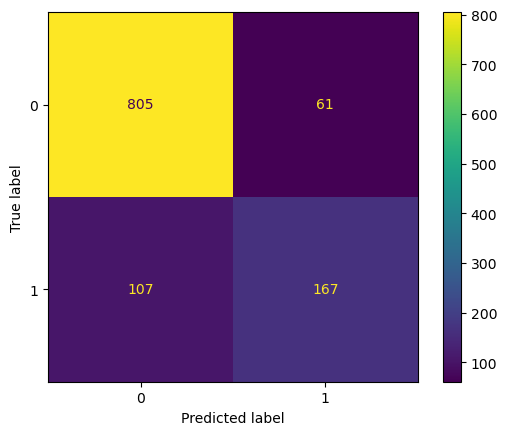

accuracy: 0.8526315789473684
precision: 0.7324561403508771
recall: 0.6094890510948905
specificity: 0.9295612009237876


In [1087]:
cm = confusion_matrix(y_syd_test, lgr_syd.predict(X_syd_test))
plotConfusionMatrix(cm, lgr_syd)

### SVM

In [1093]:
start_time = time.time()
svc_syd = SVC(probability=True).fit(X_syd_train, y_syd_train)
accu = accuracy_score(y_syd_train, svc_syd.predict(X_syd_train))
end_time = time.time()
training_time = end_time - start_time

print(f"Training-prediction time: {training_time:.4f} seconds")
print('accuracy:', accu)

Training time: 3.8037 seconds


In [1094]:
# start_time = time.time()
# accu = accuracy_score(y_syd_train, svc_syd.predict(X_syd_train))
# end_time = time.time()
# predict_time = end_time - start_time
# print(f"Prediction time: {predict_time:.4f} seconds")


Prediction time: 3.4991 seconds
accuracy: 0.8713450292397661


In [1095]:
accuracy_score(y_syd_test, svc_syd.predict(X_syd_test))

0.8552631578947368

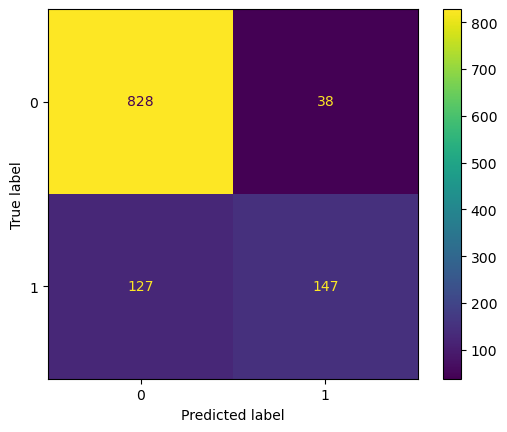

accuracy: 0.8552631578947368
precision: 0.7945945945945946
recall: 0.5364963503649635
specificity: 0.9561200923787528


In [1096]:
cm = confusion_matrix(y_syd_test, svc_syd.predict(X_syd_test))
plotConfusionMatrix(cm, svc_syd)

In [1102]:
start_time = time.time()
# params = {'kernel': ['rbf'],
#          'gamma': np.logspace(-4, 1, 100),}
# params = {
#     'C': [0.5, 1, 2],
#     'kernel': ['rbf'],
#     'gamma': [0.00001, 0.0001, 0.001, 0.01, 0.1],}
params = {
    'C': [3, 4, 5],
    'kernel': ['rbf'],
    'gamma': np.logspace(-4, -3, 10),}
grid_svc_syd = GridSearchCV(SVC(probability=True), params).fit(X_syd_train, y_syd_train)
print(grid_svc_syd.score(X_syd_test, y_syd_test))
print(grid_svc_syd.best_estimator_)
print(grid_svc_syd.best_params_['kernel'])
end_time = time.time()

print(f"Grid searchtime: {end_time - start_time:.4f} seconds")

0.8631578947368421
SVC(C=5, gamma=0.000774263682681127)
rbf
Grid searchtime: 383.0554 seconds


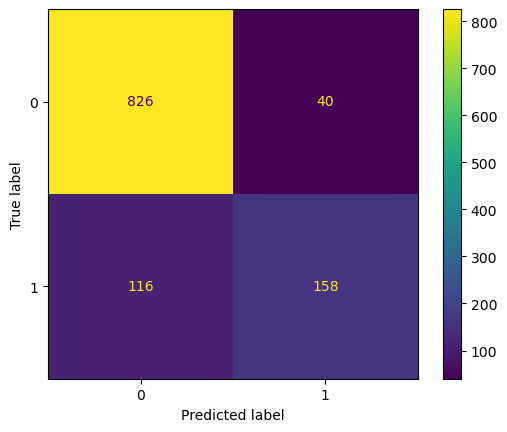

accuracy: 0.8631578947368421
precision: 0.797979797979798
recall: 0.5766423357664233
specificity: 0.953810623556582


In [1107]:
cm = confusion_matrix(y_syd_test, grid_svc_syd.predict(X_syd_test))
plotConfusionMatrix(cm, grid_svc_syd)

### DecisionTree Sydney

In [1112]:
start_time = time.time()
accu = []
for i in range(2, 41):
    dtci = DecisionTreeClassifier(max_depth = i).fit(X_syd_train, y_syd_train)
    dtci_preds = dtci.predict(X_syd_test)
    accu.append(("maxDepth:", i, "accuracy:", accuracy_score(y_syd_test, dtci_preds)))

accu
end_time = time.time()
training_time = end_time - start_time
accu

[('maxDepth:', 2, 'accuracy:', 0.8403508771929824),
 ('maxDepth:', 3, 'accuracy:', 0.8385964912280702),
 ('maxDepth:', 4, 'accuracy:', 0.8403508771929824),
 ('maxDepth:', 5, 'accuracy:', 0.8263157894736842),
 ('maxDepth:', 6, 'accuracy:', 0.8271929824561404),
 ('maxDepth:', 7, 'accuracy:', 0.8228070175438597),
 ('maxDepth:', 8, 'accuracy:', 0.8140350877192982),
 ('maxDepth:', 9, 'accuracy:', 0.8008771929824562),
 ('maxDepth:', 10, 'accuracy:', 0.7912280701754386),
 ('maxDepth:', 11, 'accuracy:', 0.8017543859649123),
 ('maxDepth:', 12, 'accuracy:', 0.7921052631578948),
 ('maxDepth:', 13, 'accuracy:', 0.793859649122807),
 ('maxDepth:', 14, 'accuracy:', 0.7736842105263158),
 ('maxDepth:', 15, 'accuracy:', 0.7912280701754386),
 ('maxDepth:', 16, 'accuracy:', 0.8026315789473685),
 ('maxDepth:', 17, 'accuracy:', 0.7842105263157895),
 ('maxDepth:', 18, 'accuracy:', 0.7763157894736842),
 ('maxDepth:', 19, 'accuracy:', 0.7798245614035088),
 ('maxDepth:', 20, 'accuracy:', 0.7850877192982456),
 (

In [1113]:
print(f"Training time: {training_time:.4f} seconds")

Training time: 49.2357 seconds


In [1119]:
# dtc = DecisionTreeClassifier().fit(X_syd_train, y_syd_train)

In [893]:
# accuracy_score(y_syd_train, dtc.predict(X_syd_train)) 

1.0

In [1123]:
# accuracy_score(y_syd_test, dtc.predict(X_syd_test)) 

In [1125]:
dtc_syd4 = DecisionTreeClassifier(max_depth = 4).fit(X_syd_train, y_syd_train)

In [1127]:
accuracy_score(y_syd_test, dtc_syd4.predict(X_syd_test)) 

0.8403508771929824

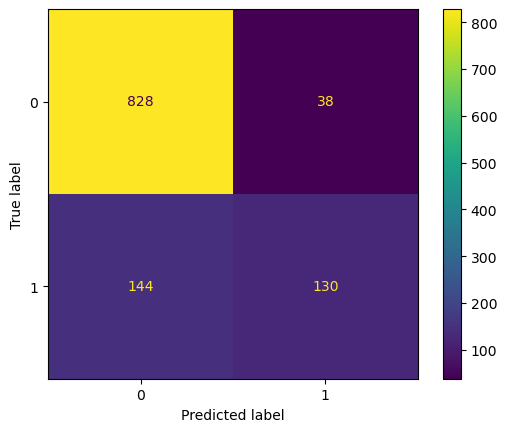

accuracy: 0.8403508771929824
precision: 0.7738095238095238
recall: 0.4744525547445255
specificity: 0.9561200923787528


In [1129]:
cm = confusion_matrix(y_syd_test, dtc_syd4.predict(X_syd_test))
plotConfusionMatrix(cm, dtc_syd4)

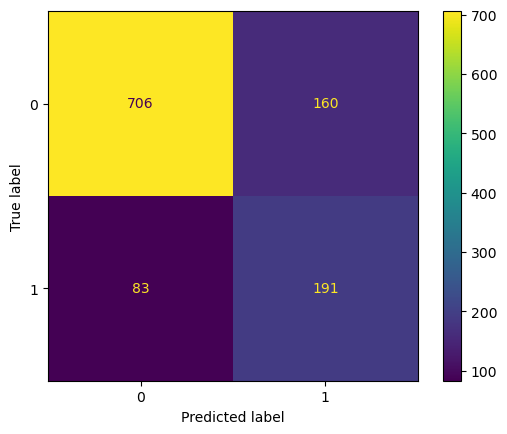

accuracy: 0.7868421052631579
precision: 0.5441595441595442
recall: 0.6970802919708029
specificity: 0.815242494226328


In [1131]:
dtc_syd4_preds = custom_predict(dtc_syd4, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, dtc_syd4_preds)
plotConfusionMatrix(cm, dtc_syd4)

### KNN Sydney

In [1133]:
start_time = time.time()
accu = []
for i in range(3, 61):
    knni = KNeighborsClassifier(i).fit(X_syd_train, y_syd_train)
    accu.append(("n_neighbors:", i, "accuracy:", knni.score(X_syd_test, y_syd_test)))
accu
end_time = time.time()
training_time = end_time - start_time
accu

[('n_neighbors:', 3, 'accuracy:', 0.8377192982456141),
 ('n_neighbors:', 4, 'accuracy:', 0.8298245614035088),
 ('n_neighbors:', 5, 'accuracy:', 0.8368421052631579),
 ('n_neighbors:', 6, 'accuracy:', 0.8342105263157895),
 ('n_neighbors:', 7, 'accuracy:', 0.8403508771929824),
 ('n_neighbors:', 8, 'accuracy:', 0.8403508771929824),
 ('n_neighbors:', 9, 'accuracy:', 0.8403508771929824),
 ('n_neighbors:', 10, 'accuracy:', 0.8421052631578947),
 ('n_neighbors:', 11, 'accuracy:', 0.8456140350877193),
 ('n_neighbors:', 12, 'accuracy:', 0.8456140350877193),
 ('n_neighbors:', 13, 'accuracy:', 0.8464912280701754),
 ('n_neighbors:', 14, 'accuracy:', 0.8429824561403508),
 ('n_neighbors:', 15, 'accuracy:', 0.8429824561403508),
 ('n_neighbors:', 16, 'accuracy:', 0.843859649122807),
 ('n_neighbors:', 17, 'accuracy:', 0.8456140350877193),
 ('n_neighbors:', 18, 'accuracy:', 0.8456140350877193),
 ('n_neighbors:', 19, 'accuracy:', 0.8456140350877193),
 ('n_neighbors:', 20, 'accuracy:', 0.8447368421052631),


In [1134]:
print(f"Training time: {training_time:.4f} seconds")

Training time: 35.6760 seconds


In [1135]:
knn_syd13 = KNeighborsClassifier(13).fit(X_syd_train, y_syd_train)

In [1136]:
accuracy_score(y_syd_test, knn_syd13.predict(X_syd_test)) 

0.8464912280701754

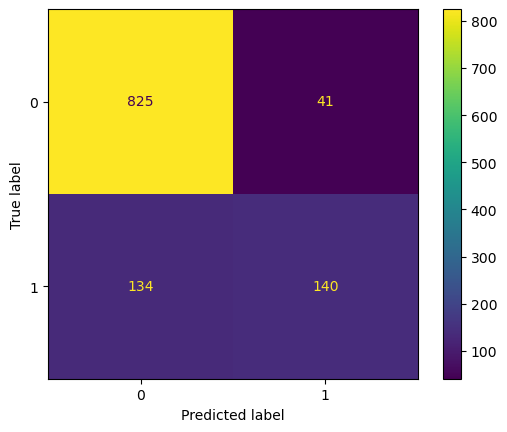

accuracy: 0.8464912280701754
precision: 0.7734806629834254
recall: 0.5109489051094891
specificity: 0.9526558891454965


In [1137]:
cm = confusion_matrix(y_syd_test, knn_syd13.predict(X_syd_test))
plotConfusionMatrix(cm, knn_syd13)

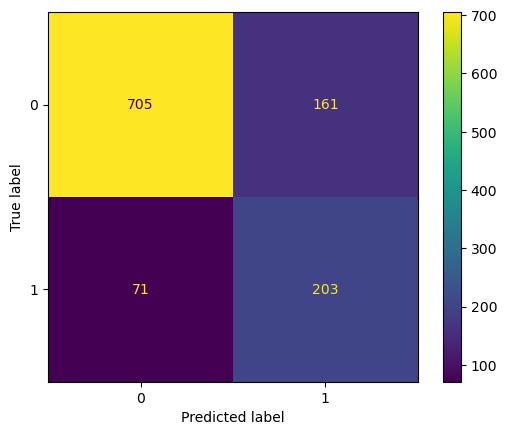

accuracy: 0.7964912280701755
precision: 0.5576923076923077
recall: 0.7408759124087592
specificity: 0.8140877598152425


In [1143]:
knn_syd13_preds = custom_predict(knn_syd13, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, knn_syd13_preds)
plotConfusionMatrix(cm, knn_syd13)

In [929]:
# from sklearn.ensemble import RandomForestClassifier
# model = RandomForestClassifier(n_estimators=30, max_features=10, oob_score=True)
# model.fit(X, y)
# model.oob_score_
# 0.9526989426822482

In [1145]:
from sklearn.ensemble import RandomForestClassifier

In [1147]:
# rfc = RandomForestClassifier(n_estimators=30, max_features=30, oob_score=True)

In [1149]:
# rfc.fit(X_syd_train, y_syd_train)
# accuracy_score(y_syd_train, rfc.predict(X_syd_train))

In [1152]:
# accuracy_score(y_syd_test, rfc.predict(X_syd_test))

In [1157]:
# start_time = time.time()
# accu=[]
# for i in range(30, 101, 10):
#     for j in range(10, 81, 10):
#         rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True)
#         rfci.fit(X_syd_train, y_syd_train)
#         # oob_score_
#         accu.append((i, j, '-', (rfci.oob_score_)))
#         # accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
# accu
# end_time = time.time()
# search_time = end_time - start_time
# accu

In [ ]:
print(f"Prediction time: {search_time:.4f} seconds")


### use all data

In [1159]:
# start_time = time.time()
# accu=[]
# for i in range(50, 91, 5):
#     for j in range(20, 51, 5):
#         rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True)
#         # rfci.fit(X_syd_train, y_syd_train)
#         rfci.fit(X_syd, y_syd)
#         # oob_score_
#         accu.append((i, j, '-', (rfci.oob_score_)))
#         # accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
# accu
# end_time = time.time()
# search_time = end_time - start_time
# accu

In [1161]:
# print(f"Prediction time: {search_time:.4f} seconds")


In [1167]:
# start_time = time.time()
# accu=[]
# for i in range(70, 121, 5):
#     for j in range(25, 51, 5):
#         rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True)
#         # rfci.fit(X_syd_train, y_syd_train)
#         rfci.fit(X_syd, y_syd)
#         # oob_score_
#         accu.append((i, j, '-', (rfci.oob_score_)))
#         # accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
# accu
# end_time = time.time()
# search_time = end_time - start_time
# accu

In [1169]:
# print(f"Prediction time: {search_time:.4f} seconds")

In [1171]:
# rfc_85_25 = RandomForestClassifier(n_estimators=85, max_features=25, oob_score=True)
# rfc_85_25.fit(X_syd, y_syd)

In [1174]:
# cm = confusion_matrix(y_syd, rfc_85_25.predict(X_syd))
# plotConfusionMatrix(cm, rfc_85_25)

In [1181]:
start_time = time.time()
accu=[]
for i in range(70, 121, 5):
    for j in range(25, 61, 5):
        rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True, random_state=0)
        rfci.fit(X_syd_train, y_syd_train)
        # rfci.fit(X_syd, y_syd)
        # oob_score_
        accu.append((i, j, '-', (rfci.oob_score_)))
        # accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
end_time = time.time()
search_time = end_time - start_time
accu

[(70, 25, '-', 0.8307017543859649),
 (70, 30, '-', 0.8388888888888889),
 (70, 35, '-', 0.8321637426900584),
 (70, 40, '-', 0.839766081871345),
 (70, 45, '-', 0.841812865497076),
 (70, 50, '-', 0.8347953216374269),
 (70, 55, '-', 0.8292397660818713),
 (70, 60, '-', 0.8362573099415205),
 (75, 25, '-', 0.8321637426900584),
 (75, 30, '-', 0.8371345029239766),
 (75, 35, '-', 0.8350877192982457),
 (75, 40, '-', 0.8403508771929824),
 (75, 45, '-', 0.8394736842105263),
 (75, 50, '-', 0.8353801169590643),
 (75, 55, '-', 0.8286549707602339),
 (75, 60, '-', 0.8350877192982457),
 (80, 25, '-', 0.8347953216374269),
 (80, 30, '-', 0.8388888888888889),
 (80, 35, '-', 0.8315789473684211),
 (80, 40, '-', 0.8409356725146199),
 (80, 45, '-', 0.8406432748538012),
 (80, 50, '-', 0.8333333333333334),
 (80, 55, '-', 0.8318713450292398),
 (80, 60, '-', 0.8371345029239766),
 (85, 25, '-', 0.835672514619883),
 (85, 30, '-', 0.8342105263157895),
 (85, 35, '-', 0.8315789473684211),
 (85, 40, '-', 0.83918128654970

In [1182]:
print(f"Prediction time: {search_time:.4f} seconds")

Prediction time: 530.3208 seconds


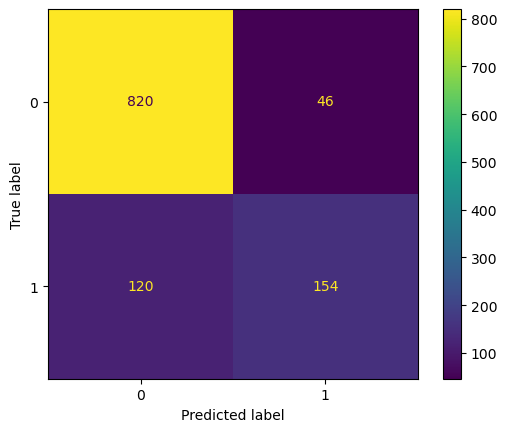

accuracy: 0.8543859649122807
precision: 0.77
recall: 0.5620437956204379
specificity: 0.9468822170900693


In [1185]:
rfc_x = RandomForestClassifier(n_estimators=110, max_features=60, oob_score=True, random_state=0)
rfc_x.fit(X_syd_train, y_syd_train)
cm = confusion_matrix(y_syd_test, rfc_x.predict(X_syd_test))
plotConfusionMatrix(cm, rfc_x)

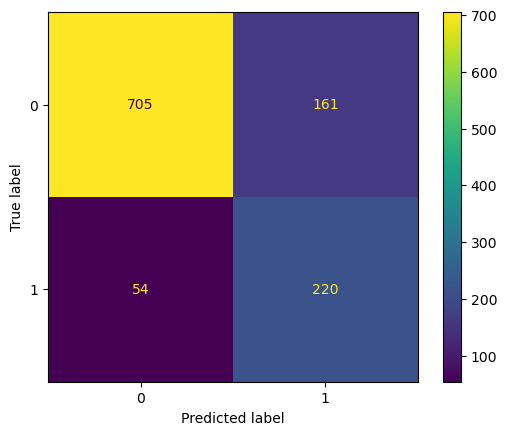

accuracy: 0.8114035087719298
precision: 0.5774278215223098
recall: 0.8029197080291971
specificity: 0.8140877598152425


In [1187]:
rfc_x_preds = custom_predict(rfc_x, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, rfc_x_preds)
plotConfusionMatrix(cm, rfc_x)

### 

In [974]:
# start_time = time.time()
# accu=[]
# for i in range(55, 80, 5):
#     for j in range(55, 85, 5):
#         rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True)
#         rfci.fit(X_syd_train, y_syd_train)
#         accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
# accu
# end_time = time.time()
# search_time = end_time - start_time
# print(f"Prediction time: {search_time:.4f} seconds")
# print('accuracy:', accu)

In [978]:
# rfc.oob_score_

In [981]:
# start_time = time.time()
# accu=[]
# for i in range(35, 61, 5):
#     for j in range(20, 51, 5):
#         rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True)
#         rfci.fit(X_syd_train, y_syd_train)
#         accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
# accu
# end_time = time.time()
# search_time = end_time - start_time
# print(f"Prediction time: {search_time:.4f} seconds")
# print('accuracy:', accu)

### Gradient Boosting Classifier Sydney

#### Default setting

In [1189]:
start_time = time.time()

gbc_syd = GradientBoostingClassifier(random_state=0)
gbc_syd.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")
# gbc_syd.oob_score_
print('Test Accuracy:', gbc_syd.score(X_syd_test, y_syd_test))

Training time: 34.6387 seconds
Test Accuracy: 0.8614035087719298


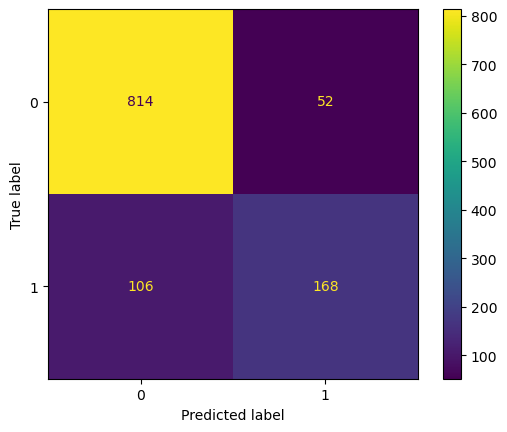

accuracy: 0.8614035087719298
precision: 0.7636363636363637
recall: 0.6131386861313869
specificity: 0.9399538106235565


In [1192]:
cm = confusion_matrix(y_syd_test, gbc_syd.predict(X_syd_test))
plotConfusionMatrix(cm, gbc_syd)

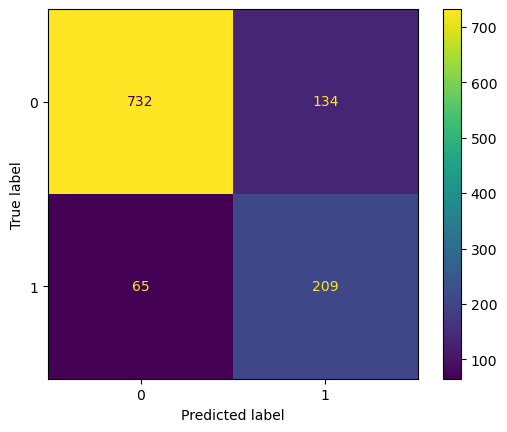

accuracy: 0.8254385964912281
precision: 0.60932944606414
recall: 0.7627737226277372
specificity: 0.8452655889145496


In [1194]:
gbc_syd_preds = custom_predict(gbc_syd, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, gbc_syd_preds)
plotConfusionMatrix(cm, gbc_syd)

### Gradient Boosting Classifier, different hyper-parameters

In [1203]:
start_time = time.time()

gbc = GradientBoostingClassifier(max_depth=5, max_features = 50, n_estimators=300, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)

Training time: 14.9858 seconds


In [1204]:
boost_acc

0.8631578947368421

In [1206]:
start_time = time.time()

gbc = GradientBoostingClassifier(max_depth=5, max_features = 80, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 41.0602 seconds


0.8614035087719298

In [1208]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=4, max_features = 40, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 16.2196 seconds


0.8605263157894737

In [1210]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=6, max_features = 50, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 30.4769 seconds


0.8736842105263158

In [1212]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=8, max_features = 50, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 39.0339 seconds


0.8675438596491228

In [1214]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=6, max_features = 80, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 52.1335 seconds


0.8666666666666667

In [1218]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=6, max_features = 40, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 27.8826 seconds


0.868421052631579

In [1219]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=6, max_features = 55, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 32.5314 seconds


0.8666666666666667

In [1220]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=6, max_features = 45, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 28.2020 seconds


0.8675438596491228

In [1222]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=6, max_features = 50, n_estimators=1000, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 58.2642 seconds


0.8719298245614036

In [1223]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=7, max_features = 50, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 37.3211 seconds


0.8719298245614036

In [1224]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=5, max_features = 50, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 27.5135 seconds


0.868421052631579

In [1005]:
start_time = time.time()
accu = []
for mDepth in [6]:
    for mFeatures in [40, 45, 50]:
        for nEstimators in [400, 500, 600]:
            
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_syd_train, y_syd_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_syd_test, gbc.predict(X_syd_test)))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")


Training time: 207.5241 seconds


In [1006]:
accu

[(6, 40, 400, '-', 0.8701754385964913),
 (6, 40, 500, '-', 0.868421052631579),
 (6, 40, 600, '-', 0.874561403508772),
 (6, 45, 400, '-', 0.8692982456140351),
 (6, 45, 500, '-', 0.8675438596491228),
 (6, 45, 600, '-', 0.8640350877192983),
 (6, 50, 400, '-', 0.8719298245614036),
 (6, 50, 500, '-', 0.8736842105263158),
 (6, 50, 600, '-', 0.8701754385964913)]

In [1009]:
start_time = time.time()
accu = []
for mDepth in [6,7]:
    for mFeatures in [40, 50, 60]:
        for nEstimators in [500, 600, 800]:
            
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_syd_train, y_syd_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_syd_test, gbc.predict(X_syd_test)))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 626.1686 seconds


In [1010]:
accu

[(6, 40, 500, '-', 0.868421052631579),
 (6, 40, 600, '-', 0.874561403508772),
 (6, 40, 800, '-', 0.874561403508772),
 (6, 50, 500, '-', 0.8736842105263158),
 (6, 50, 600, '-', 0.8701754385964913),
 (6, 50, 800, '-', 0.8728070175438597),
 (6, 60, 500, '-', 0.8657894736842106),
 (6, 60, 600, '-', 0.8649122807017544),
 (6, 60, 800, '-', 0.868421052631579),
 (7, 40, 500, '-', 0.8657894736842106),
 (7, 40, 600, '-', 0.8657894736842106),
 (7, 40, 800, '-', 0.8692982456140351),
 (7, 50, 500, '-', 0.8719298245614036),
 (7, 50, 600, '-', 0.8719298245614036),
 (7, 50, 800, '-', 0.874561403508772),
 (7, 60, 500, '-', 0.868421052631579),
 (7, 60, 600, '-', 0.8657894736842106),
 (7, 60, 800, '-', 0.8666666666666667)]

In [1013]:
start_time = time.time()
accu = []
for mDepth in [6]:
    for mFeatures in [38, 40, 42, 44]:
        for nEstimators in [600, 650, 700, 750, 800]:
            
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_syd_train, y_syd_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_syd_test, gbc.predict(X_syd_test)))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 661.8910 seconds


In [1014]:
accu

[(6, 38, 600, '-', 0.8728070175438597),
 (6, 38, 650, '-', 0.8710526315789474),
 (6, 38, 700, '-', 0.8710526315789474),
 (6, 38, 750, '-', 0.8710526315789474),
 (6, 38, 800, '-', 0.8692982456140351),
 (6, 40, 600, '-', 0.874561403508772),
 (6, 40, 650, '-', 0.8728070175438597),
 (6, 40, 700, '-', 0.8710526315789474),
 (6, 40, 750, '-', 0.8728070175438597),
 (6, 40, 800, '-', 0.874561403508772),
 (6, 42, 600, '-', 0.8701754385964913),
 (6, 42, 650, '-', 0.8719298245614036),
 (6, 42, 700, '-', 0.868421052631579),
 (6, 42, 750, '-', 0.868421052631579),
 (6, 42, 800, '-', 0.8692982456140351),
 (6, 44, 600, '-', 0.8692982456140351),
 (6, 44, 650, '-', 0.8736842105263158),
 (6, 44, 700, '-', 0.8701754385964913),
 (6, 44, 750, '-', 0.8692982456140351),
 (6, 44, 800, '-', 0.8701754385964913)]

In [1017]:
gbc_6_40_600 = GradientBoostingClassifier(max_depth=6, max_features=40, n_estimators=600, random_state=0)

In [1019]:
gbc_6_40_600.fit(X_syd_train, y_syd_train)

GradientBoostingClassifier(max_depth=6, max_features=40, n_estimators=600,
                           random_state=0)

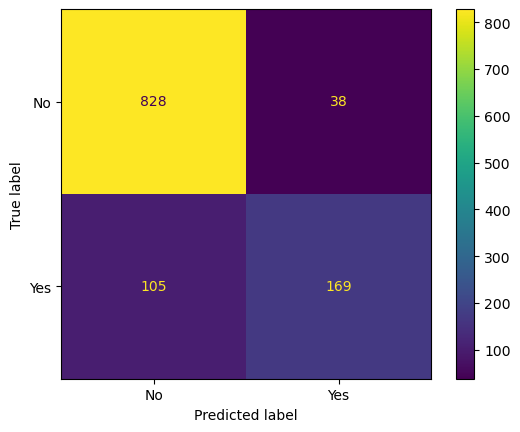

accuracy: 0.874561403508772
precision: 0.8164251207729468
recall: 0.6167883211678832
specificity: 0.9561200923787528


In [1021]:
cm = confusion_matrix(y_syd_test, gbc_6_40_600.predict(X_syd_test))
plotConfusionMatrix(cm, gbc_6_40_600)

### custom threshold

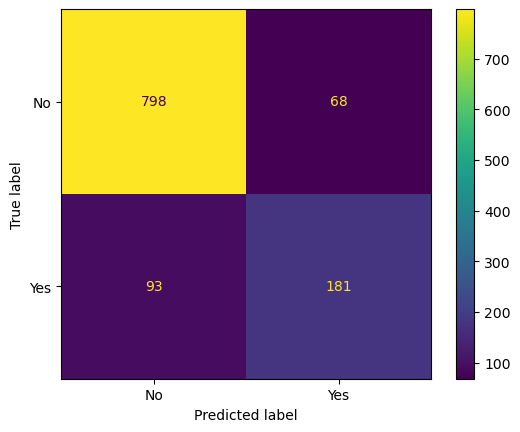

accuracy: 0.8587719298245614
precision: 0.7269076305220884
recall: 0.6605839416058394
specificity: 0.9214780600461894


In [1068]:
gbc_6_40_600_preds = custom_predict(gbc_6_40_600, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, gbc_6_40_600_preds)
plotConfusionMatrix(cm, gbc_6_40_600)

In [1196]:
gbc_6_50_500 = GradientBoostingClassifier(max_depth=6, max_features = 50, n_estimators=500, random_state=0)
gbc_6_50_500.fit(X_syd_train, y_syd_train)

GradientBoostingClassifier(max_depth=6, max_features=50, n_estimators=500,
                           random_state=0)

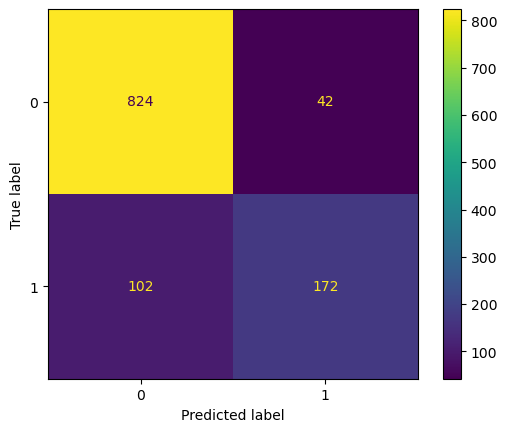

accuracy: 0.8736842105263158
precision: 0.8037383177570093
recall: 0.6277372262773723
specificity: 0.9515011547344111


In [1198]:
cm = confusion_matrix(y_syd_test, gbc_6_50_500.predict(X_syd_test))
plotConfusionMatrix(cm, gbc_6_50_500)

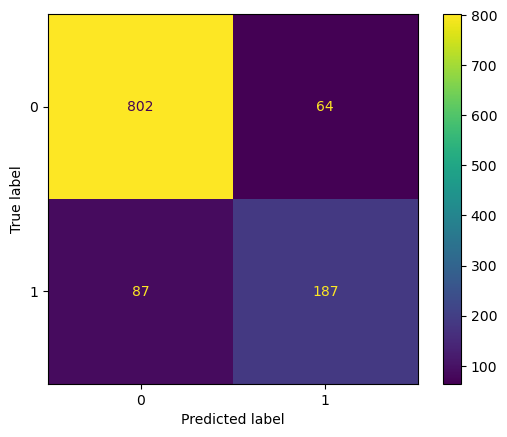

accuracy: 0.8675438596491228
precision: 0.7450199203187251
recall: 0.6824817518248175
specificity: 0.9260969976905312


In [1200]:
gbc_6_50_500_preds = custom_predict(gbc_6_50_500, X_syd_test, threshold=0.3)
cm = confusion_matrix(y_syd_test, gbc_6_50_500_preds)
plotConfusionMatrix(cm, gbc_6_50_500)

## Perth

In [1242]:
pth = df20[(df20['Location'] == 'Perth')]
pth = pth.drop(columns=['Location'])
pth

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root
120639,07,279.55,293.85,0.0,1.8,7.0,NE,22.0,ESE,ENE,6.0,9.0,80.0,39.0,1024.1,1019.0,0.0,6.0,284.25,292.85,No,No,16.719749,17.142054,0.000000,1.341641,2.645751,4.690416,2.449490,3.000000,8.944272,6.244998,32.001562,31.921779,0.000000,2.449490,16.859715,17.112861
120641,07,282.65,292.35,1.8,1.2,4.7,W,26.0,NNE,NNW,11.0,6.0,93.0,73.0,1019.3,1018.4,6.0,6.0,286.35,290.85,Yes,Yes,16.812198,17.098246,1.341641,1.095445,2.167948,5.099020,3.316625,2.449490,9.643651,8.544004,31.926478,31.912380,2.449490,2.449490,16.921879,17.054325
120642,07,282.65,289.55,1.8,1.4,4.9,WSW,44.0,W,SW,13.0,17.0,69.0,57.0,1020.4,1022.1,7.0,5.0,289.05,289.15,Yes,Yes,16.812198,17.016169,1.341641,1.183216,2.213594,6.633250,3.605551,4.123106,8.306624,7.549834,31.943700,31.970299,2.645751,2.236068,17.001471,17.004411
120643,07,273.85,289.05,6.8,2.4,9.3,NNE,24.0,ENE,NE,4.0,7.0,86.0,41.0,1032.0,1029.6,0.0,1.0,280.05,288.65,Yes,No,16.548414,17.001471,2.607681,1.549193,3.049590,4.898979,2.000000,2.645751,9.273618,6.403124,32.124757,32.087381,0.000000,1.000000,16.734694,16.989703
120644,07,273.85,291.45,0.0,0.8,9.3,N,37.0,NE,NNE,15.0,13.0,72.0,36.0,1028.9,1024.2,1.0,5.0,281.85,291.05,No,No,16.548414,17.071907,0.000000,0.894427,3.049590,6.082763,3.872983,3.605551,8.485281,6.000000,32.076471,32.003125,1.000000,2.236068,16.788389,17.060188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123826,06,283.45,293.05,0.2,1.8,7.5,NW,37.0,NNE,NNW,9.0,15.0,89.0,60.0,1017.1,1013.8,5.0,6.0,286.15,291.65,No,Yes,16.835973,17.118703,0.447214,1.341641,2.738613,6.082763,3.000000,3.872983,9.433981,7.745967,31.892005,31.840226,2.236068,2.449490,16.915969,17.077763
123827,06,286.15,289.95,61.2,3.6,0.0,SSW,46.0,W,SW,17.0,17.0,90.0,75.0,1005.6,1008.9,7.0,7.0,289.55,288.75,Yes,No,16.915969,17.027918,7.823043,1.897367,0.000000,6.782330,4.123106,4.123106,9.486833,8.660254,31.711197,31.763186,2.645751,2.645751,17.016169,16.992645
123828,06,286.45,292.05,0.4,1.8,6.5,SE,37.0,SE,ESE,11.0,11.0,85.0,65.0,1019.2,1019.4,6.0,6.0,288.25,291.15,No,No,16.924834,17.089470,0.632456,1.341641,2.549510,6.082763,3.316625,3.316625,9.219544,8.062258,31.924912,31.928044,2.449490,2.449490,16.977927,17.063118
123829,06,284.65,291.35,0.0,3.8,9.3,SE,30.0,ESE,ESE,9.0,11.0,62.0,47.0,1025.9,1023.4,1.0,3.0,287.15,290.75,No,No,16.871574,17.068978,0.000000,1.949359,3.049590,5.477226,3.000000,3.316625,7.874008,6.855655,32.029674,31.990624,1.000000,1.732051,16.945501,17.051393


In [1247]:
pth['RainTomorrow'] = pth['RainTomorrow'].map(lambda x: 1 if x=='Yes' else 0)
X_pth, y_pth = pth.drop('RainTomorrow', axis = 1), pth['RainTomorrow']
X_pth = featureEncoding(X_pth, oneHot=True, PolyNomial=True)
X_pth[X_pth.columns] = StandardScaler().fit_transform(X_pth[X_pth.columns])
X_pth_train, X_pth_test, y_pth_train, y_pth_test = train_test_split(X_pth, y_pth, random_state=42)
X_pth

,Month_01,Month_02,Month_03,Month_04,Month_05,Month_06,Month_07,Month_08,Month_09,Month_10,Month_11,Month_12,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTempsq_root,MinTemp MaxTempsq_root,MinTemp Rainfallsq_root,MinTemp Evaporationsq_root,MinTemp Sunshinesq_root,MinTemp WindGustSpeedsq_root,MinTemp WindSpeed9amsq_root,MinTemp WindSpeed3pmsq_root,MinTemp Humidity9amsq_root,MinTemp Humidity3pmsq_root,MinTemp Pressure9amsq_root,MinTemp Pressure3pmsq_root,MinTemp Cloud9amsq_root,MinTemp Cloud3pmsq_root,MinTemp Temp9amsq_root,MinTemp Temp3pmsq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTempsq_root,MaxTemp MaxTempsq_root,MaxTemp Rainfallsq_root,MaxTemp Evaporationsq_root,MaxTemp Sunshinesq_root,MaxTemp WindGustSpeedsq_root,MaxTemp WindSpeed9amsq_root,MaxTemp WindSpeed3pmsq_root,MaxTemp Humidity9amsq_root,MaxTemp Humidity3pmsq_root,MaxTemp Pressure9amsq_root,MaxTemp Pressure3pmsq_root,MaxTemp Cloud9amsq_root,MaxTemp Cloud3pmsq_root,MaxTemp Temp9amsq_root,MaxTemp Temp3pmsq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTempsq_root,Rainfall MaxTempsq_root,Rainfall Rainfallsq_root,Rainfall Evaporationsq_root,Rainfall Sunshinesq_root,Rainfall WindGustSpeedsq_root,Rainfall WindSpeed9amsq_root,Rainfall WindSpeed3pmsq_root,Rainfall Humidity9amsq_root,Rainfall Humidity3pmsq_root,Rainfall Pressure9amsq_root,Rainfall Pressure3pmsq_root,Rainfall Cloud9amsq_root,Rainfall Cloud3pmsq_root,Rainfall Temp9amsq_root,Rainfall Temp3pmsq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTempsq_root,Evaporation MaxTempsq_root,Evaporation Rainfallsq_root,Evaporation Evaporationsq_root,Evaporation Sunshinesq_root,Evaporation WindGustSpeedsq_root,Evaporation WindSpeed9amsq_root,Evaporation WindSpeed3pmsq_root,Evaporation Humidity9amsq_root,Evaporation Humidity3pmsq_root,Evaporation Pressure9amsq_root,Evaporation Pressure3pmsq_root,Eva

### LogisticRegression Perth

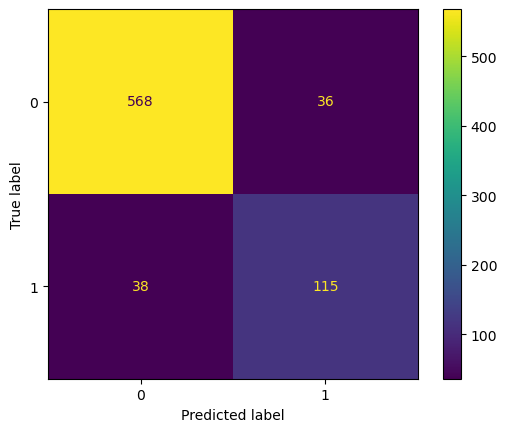

accuracy: 0.9022457067371202
precision: 0.7615894039735099
recall: 0.7516339869281046
specificity: 0.9403973509933775


In [1249]:
lgr_pth = LogisticRegression(max_iter=1000).fit(X_pth_train, y_pth_train)
cm = confusion_matrix(y_pth_test, lgr_pth.predict(X_pth_test))
plotConfusionMatrix(cm, lgr_pth)

In [1251]:
accuracy_score(y_pth_train, lgr_pth.predict(X_pth_train))

0.9329805996472663

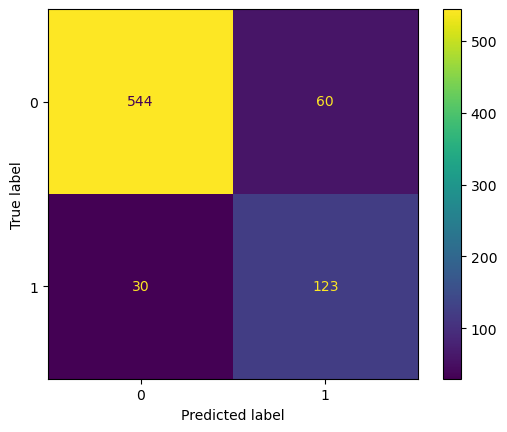

accuracy: 0.8811096433289299
precision: 0.6721311475409836
recall: 0.803921568627451
specificity: 0.9006622516556292


In [1256]:
lgr_pth_preds = custom_predict(lgr_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, lgr_pth_preds)
plotConfusionMatrix(cm, lgr_pth)

### SVM Perth

In [1265]:
start_time = time.time()
svc_pth = SVC(probability=True).fit(X_pth_train, y_pth_train)
accu = accuracy_score(y_pth_train, svc_pth.predict(X_pth_train))
end_time = time.time()
training_time = end_time - start_time

print(f"Training-prediction time: {training_time:.4f} seconds")
print('accuracy:', accu)

Training-prediction time: 5.9783 seconds
accuracy: 0.9343033509700176


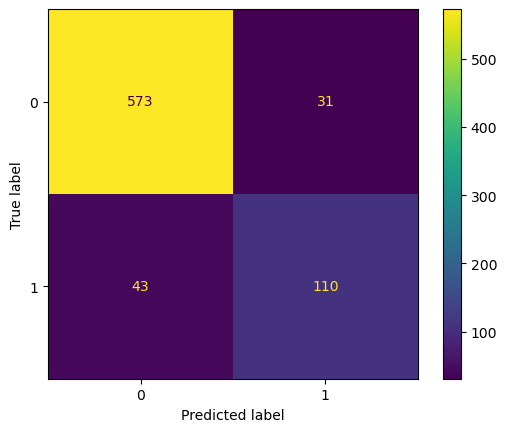

accuracy: 0.9022457067371202
precision: 0.7801418439716312
recall: 0.7189542483660131
specificity: 0.9486754966887417


In [1268]:
cm = confusion_matrix(y_pth_test, svc_pth.predict(X_pth_test))
plotConfusionMatrix(cm, svc_pth)

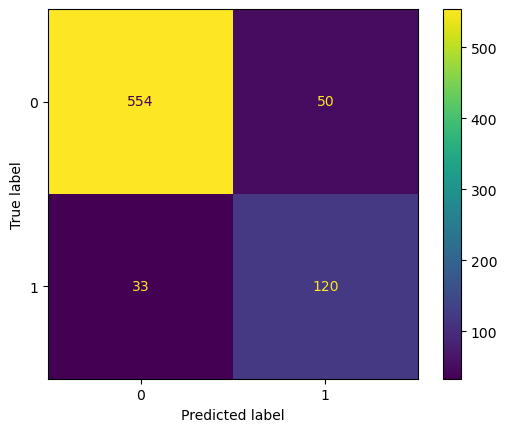

accuracy: 0.8903566710700133
precision: 0.7058823529411765
recall: 0.7843137254901961
specificity: 0.9172185430463576


In [1271]:
svc_pth_preds = custom_predict(svc_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, svc_pth_preds)
plotConfusionMatrix(cm, svc_pth)

In [1290]:
start_time = time.time()
# params = {'kernel': ['rbf'],
#          'gamma': np.logspace(-4, 1, 100),}
# params = {
#     'C': [0.5, 1, 2],
#     'kernel': ['rbf'],
#     'gamma': [0.00001, 0.0001, 0.001, 0.01, 0.1],}
params = {
    # 'C': [5, 10, 15],
    'kernel': ['rbf'],
    'gamma': np.logspace(-5, -2, 20),}
grid_svc_pth = GridSearchCV(SVC(probability=True), params).fit(X_pth_train, y_pth_train)
print(grid_svc_pth.score(X_pth_test, y_pth_test))
print(grid_svc_pth.best_estimator_)
print(grid_svc_pth.best_params_['kernel'])
end_time = time.time()

0.904887714663144
SVC(gamma=0.000379269019073225, probability=True)
rbf


In [1291]:
training_time = end_time - start_time
print(f"grid search time: {training_time:.4f} seconds")

grid search time: 420.0888 seconds


In [1294]:
start_time = time.time()
# params = {'kernel': ['rbf'],
#          'gamma': np.logspace(-4, 1, 100),}
# params = {
#     'C': [0.5, 1, 2],
#     'kernel': ['rbf'],
#     'gamma': [0.00001, 0.0001, 0.001, 0.01, 0.1],}
params = {
    'C': [0.5, 1, 2],
    'kernel': ['rbf'],
    'gamma': np.logspace(-4, -3, 7),}
grid_svc_pth = GridSearchCV(SVC(probability=True), params).fit(X_pth_train, y_pth_train)
print(grid_svc_pth.score(X_pth_test, y_pth_test))
print(grid_svc_pth.best_estimator_)
print(grid_svc_pth.best_params_['kernel'])
end_time = time.time()

0.9075297225891678
SVC(C=2, gamma=0.00021544346900318845, probability=True)
rbf


In [1295]:
training_time = end_time - start_time
print(f"grid search time: {training_time:.4f} seconds")

grid search time: 368.4142 seconds


In [1298]:
start_time = time.time()
# params = {'kernel': ['rbf'],
#          'gamma': np.logspace(-4, 1, 100),}
# params = {
#     'C': [0.5, 1, 2],
#     'kernel': ['rbf'],
#     'gamma': [0.00001, 0.0001, 0.001, 0.01, 0.1],}
params = {
    'C': [1.5, 2, 2.5, 3],
    'kernel': ['rbf'],
    'gamma': np.logspace(-4, -3, 7),}
grid_svc_pth = GridSearchCV(SVC(probability=True), params).fit(X_pth_train, y_pth_train)
print(grid_svc_pth.score(X_pth_test, y_pth_test))
print(grid_svc_pth.best_estimator_)
print(grid_svc_pth.best_params_['kernel'])
end_time = time.time()

0.9075297225891678
SVC(C=3, gamma=0.0001467799267622069, probability=True)
rbf


In [1299]:
training_time = end_time - start_time
print(f"grid search time: {training_time:.4f} seconds")

grid search time: 445.4303 seconds


In [1302]:
start_time = time.time()
# params = {'kernel': ['rbf'],
#          'gamma': np.logspace(-4, 1, 100),}
# params = {
#     'C': [0.5, 1, 2],
#     'kernel': ['rbf'],
#     'gamma': [0.00001, 0.0001, 0.001, 0.01, 0.1],}
params = {
    'C': [2, 2.5, 3, 4],
    'kernel': ['rbf'],
    'gamma': np.logspace(-4, -3, 10),}
grid_svc_pth = GridSearchCV(SVC(probability=True), params).fit(X_pth_train, y_pth_train)
print(grid_svc_pth.score(X_pth_test, y_pth_test))
print(grid_svc_pth.best_estimator_)
print(grid_svc_pth.best_params_['kernel'])
end_time = time.time()

0.9075297225891678
SVC(C=2.5, gamma=0.0001668100537200059, probability=True)
rbf


In [1303]:
training_time = end_time - start_time
print(f"grid search time: {training_time:.4f} seconds")

grid search time: 604.6387 seconds


In [1306]:
svc_g_pth = SVC(C=2.5, gamma=0.0001668100537200059, probability=True).fit(X_pth_train, y_pth_train)
accuracy_score(y_pth_train, svc_g_pth.predict(X_pth_train))

0.9144620811287478

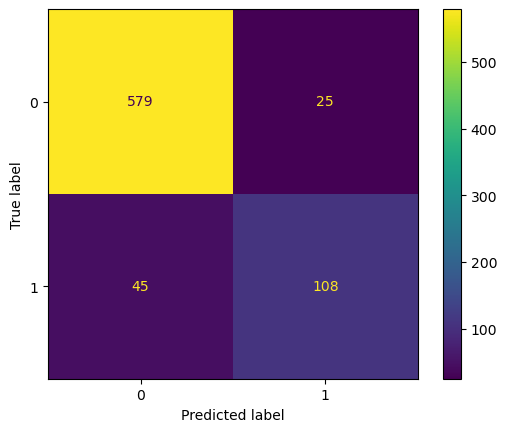

accuracy: 0.9075297225891678
precision: 0.8120300751879699
recall: 0.7058823529411765
specificity: 0.9586092715231788


In [1308]:
cm = confusion_matrix(y_pth_test, svc_g_pth.predict(X_pth_test))
plotConfusionMatrix(cm, svc_g_pth)

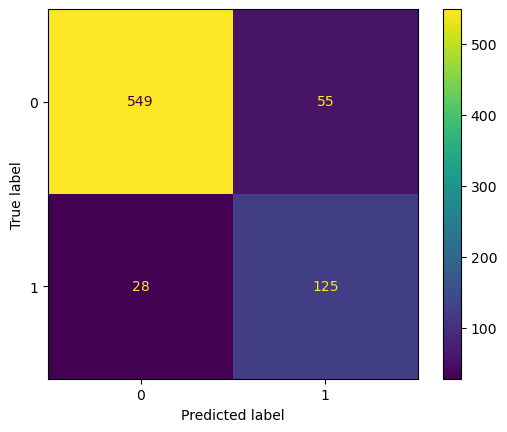

accuracy: 0.8903566710700133
precision: 0.6944444444444444
recall: 0.8169934640522876
specificity: 0.9089403973509934


In [1310]:
svc_g_pth_preds = custom_predict(svc_g_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, svc_g_pth_preds)
plotConfusionMatrix(cm, svc_g_pth)

### RandomForest Perth

In [1314]:
start_time = time.time()
accu=[]
for i in range(70, 121, 5):
    for j in range(25, 61, 5):
        rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True, random_state=0)
        rfci.fit(X_pth_train, y_pth_train)
        # rfci.fit(X_syd, y_syd)
        # oob_score_
        accu.append((i, j, '-', (rfci.oob_score_)))
        # accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
end_time = time.time()
search_time = end_time - start_time
accu

[(70, 25, '-', 0.8862433862433863),
 (70, 30, '-', 0.8915343915343915),
 (70, 35, '-', 0.8902116402116402),
 (70, 40, '-', 0.8897707231040565),
 (70, 45, '-', 0.8937389770723104),
 (70, 50, '-', 0.8844797178130511),
 (70, 55, '-', 0.890652557319224),
 (70, 60, '-', 0.8853615520282186),
 (75, 25, '-', 0.8888888888888888),
 (75, 30, '-', 0.8919753086419753),
 (75, 35, '-', 0.8897707231040565),
 (75, 40, '-', 0.8941798941798942),
 (75, 45, '-', 0.8959435626102292),
 (75, 50, '-', 0.8858024691358025),
 (75, 55, '-', 0.8910934744268078),
 (75, 60, '-', 0.8880070546737213),
 (80, 25, '-', 0.8902116402116402),
 (80, 30, '-', 0.8915343915343915),
 (80, 35, '-', 0.8902116402116402),
 (80, 40, '-', 0.8919753086419753),
 (80, 45, '-', 0.8959435626102292),
 (80, 50, '-', 0.8862433862433863),
 (80, 55, '-', 0.8932980599647267),
 (80, 60, '-', 0.8893298059964727),
 (85, 25, '-', 0.8888888888888888),
 (85, 30, '-', 0.894620811287478),
 (85, 35, '-', 0.8932980599647267),
 (85, 40, '-', 0.8924162257495

In [1315]:

print(f"grid search time: {search_time:.4f} seconds")

grid search time: 267.3751 seconds


In [1318]:
rfc_g_pth = RandomForestClassifier(n_estimators=115, max_features=45, oob_score=True, random_state=0)

In [1322]:
rfc_g_pth.fit(X_pth_train, y_pth_train)

RandomForestClassifier(max_features=45, n_estimators=115, oob_score=True,
                       random_state=0)

In [1323]:
accuracy_score(y_pth_train, rfc_g_pth.predict(X_pth_train))

1.0

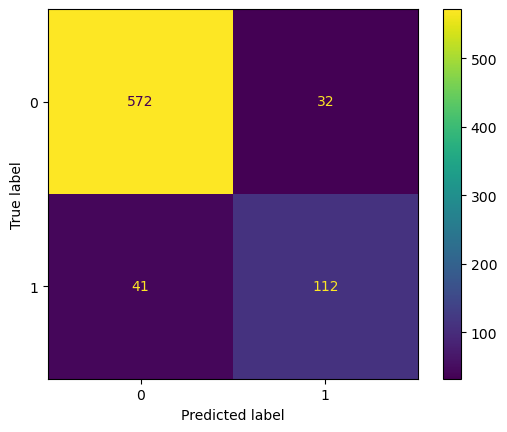

accuracy: 0.9035667107001321
precision: 0.7777777777777778
recall: 0.7320261437908496
specificity: 0.9470198675496688


In [1326]:
cm = confusion_matrix(y_pth_test, rfc_g_pth.predict(X_pth_test))
plotConfusionMatrix(cm, rfc_g_pth)

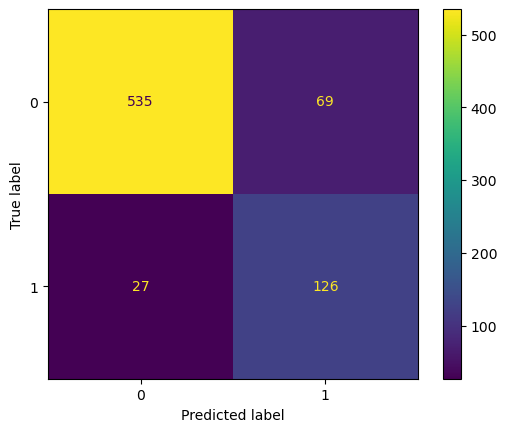

accuracy: 0.8731836195508587
precision: 0.6461538461538462
recall: 0.8235294117647058
specificity: 0.8857615894039735


In [1328]:
rfc_g_pth_preds = custom_predict(rfc_g_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, rfc_g_pth_preds)
plotConfusionMatrix(cm, rfc_g_pth)

In [1330]:
start_time = time.time()
accu = []
for mDepth in [6]:
    for mFeatures in [30, 35, 40, 45, 50]:
        for nEstimators in [400, 500, 600, 800]:
            
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_pth_train, y_pth_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_pth_test, gbc.predict(X_pth_test)))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 276.4647 seconds


In [1331]:
accu

[(6, 30, 400, '-', 0.8996036988110965),
 (6, 30, 500, '-', 0.9022457067371202),
 (6, 30, 600, '-', 0.8982826948480845),
 (6, 30, 800, '-', 0.8996036988110965),
 (6, 35, 400, '-', 0.9062087186261559),
 (6, 35, 500, '-', 0.9035667107001321),
 (6, 35, 600, '-', 0.9022457067371202),
 (6, 35, 800, '-', 0.9009247027741083),
 (6, 40, 400, '-', 0.8943196829590488),
 (6, 40, 500, '-', 0.8996036988110965),
 (6, 40, 600, '-', 0.8996036988110965),
 (6, 40, 800, '-', 0.8996036988110965),
 (6, 45, 400, '-', 0.904887714663144),
 (6, 45, 500, '-', 0.904887714663144),
 (6, 45, 600, '-', 0.9035667107001321),
 (6, 45, 800, '-', 0.8996036988110965),
 (6, 50, 400, '-', 0.9009247027741083),
 (6, 50, 500, '-', 0.8996036988110965),
 (6, 50, 600, '-', 0.9009247027741083),
 (6, 50, 800, '-', 0.8996036988110965)]

In [1334]:
start_time = time.time()
accu = []
for mDepth in [5, 6]:
    for mFeatures in [30, 35, 40, 45]:
        for nEstimators in [400, 500, 600]:
            
            gbc = GradientBoostingClassifier(max_depth=mDepth, max_features=mFeatures, n_estimators=nEstimators, random_state=0)
            gbc.fit(X_pth_train, y_pth_train)
            accu.append((mDepth, mFeatures, nEstimators, '-', (accuracy_score(y_pth_test, gbc.predict(X_pth_test)))))

end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

Training time: 252.9328 seconds


In [1335]:
accu

[(5, 30, 400, '-', 0.8956406869220608),
 (5, 30, 500, '-', 0.8969616908850726),
 (5, 30, 600, '-', 0.8996036988110965),
 (5, 35, 400, '-', 0.9009247027741083),
 (5, 35, 500, '-', 0.9022457067371202),
 (5, 35, 600, '-', 0.9022457067371202),
 (5, 40, 400, '-', 0.9009247027741083),
 (5, 40, 500, '-', 0.8982826948480845),
 (5, 40, 600, '-', 0.8996036988110965),
 (5, 45, 400, '-', 0.8996036988110965),
 (5, 45, 500, '-', 0.8982826948480845),
 (5, 45, 600, '-', 0.9022457067371202),
 (6, 30, 400, '-', 0.8996036988110965),
 (6, 30, 500, '-', 0.9022457067371202),
 (6, 30, 600, '-', 0.8982826948480845),
 (6, 35, 400, '-', 0.9062087186261559),
 (6, 35, 500, '-', 0.9035667107001321),
 (6, 35, 600, '-', 0.9022457067371202),
 (6, 40, 400, '-', 0.8943196829590488),
 (6, 40, 500, '-', 0.8996036988110965),
 (6, 40, 600, '-', 0.8996036988110965),
 (6, 45, 400, '-', 0.904887714663144),
 (6, 45, 500, '-', 0.904887714663144),
 (6, 45, 600, '-', 0.9035667107001321)]

In [1346]:
gbc_pth = GradientBoostingClassifier(max_depth=6, max_features=35, n_estimators=400, random_state=0)
gbc_pth.fit(X_pth_train, y_pth_train)
accuracy_score(y_pth_test, gbc_pth.predict(X_pth_test))

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/displayhook.py:281: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


0.9062087186261559

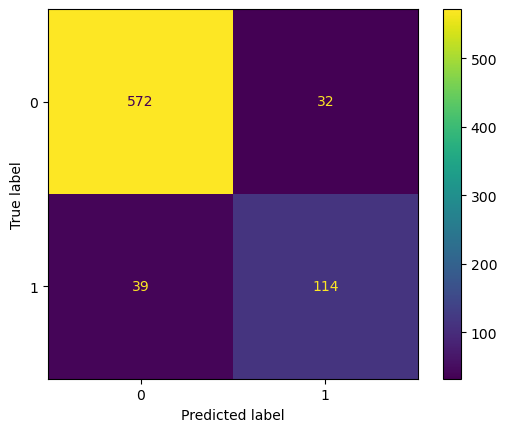

accuracy: 0.9062087186261559
precision: 0.7808219178082192
recall: 0.7450980392156863
specificity: 0.9470198675496688


In [1347]:
cm = confusion_matrix(y_pth_test, gbc_pth.predict(X_pth_test))
plotConfusionMatrix(cm, gbc_pth)

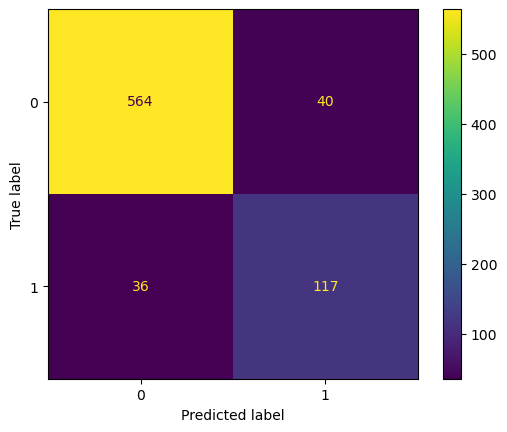

accuracy: 0.8996036988110965
precision: 0.7452229299363057
recall: 0.7647058823529411
specificity: 0.9337748344370861


In [1352]:
gbc_pth_preds = custom_predict(gbc_pth, X_pth_test, threshold=0.3)
cm = confusion_matrix(y_pth_test, gbc_pth_preds)
plotConfusionMatrix(cm, gbc_pth)

In [1044]:
# y_syd_test

32225     No
34533     No
31210    Yes
35396     No
31869     No
        ... 
32438     No
33584     No
35588     No
35010     No
34255    Yes
Name: RainTomorrow, Length: 1140, dtype: object

In [1058]:
# y_syd_test_int = y_syd_test.map(lambda x: 1 if x == 'Yes' else 0)

In [ ]:
# parameters = {
#     "loss":["deviance"],
#     "learning_rate": [0.01, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2],
#     "min_samples_split": np.linspace(0.1, 0.5, 12),
#     "min_samples_leaf": np.linspace(0.1, 0.5, 12),
#     "max_depth":[3,5,8],
#     "max_features":["log2","sqrt"],
#     "criterion": ["friedman_mse",  "mae"],
#     "subsample":[0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0],
#     "n_estimators":[10]
#     }
# #passing the scoring function in the GridSearchCV
# clf = GridSearchCV(GradientBoostingClassifier(), parameters,scoring=scoring,refit=False,cv=2, n_jobs=-1)

# clf.fit(trainX, trainY)

In [992]:
# start_time = time.time()
# parameters = {
#     "max_depth":[5],
#     "max_features":[40, 60],
#     "n_estimators":[500, 800]
#     }
# #passing the scoring function in the GridSearchCV
# grid_gbc = GridSearchCV(GradientBoostingClassifier(), parameters, cv=5)
# grid_gbc.fit(X_syd_train, y_syd_train)
# end_time = time.time()
# train_time = end_time - start_time
# print(f"Training time: {train_time:.4f} seconds")

# boost_acc = grid_gbc.score(X_syd_test, y_syd_test)

Training time: 451.6907 seconds


In [993]:
# boost_acc

0.8666666666666667

#### Turn off cross validation

In [998]:
# start_time = time.time()
# parameters = {
#     "max_depth":[5],
#     "max_features":[40, 60],
#     "n_estimators":[500, 800]
#     }
# # passing the scoring function in the GridSearchCV
# # Turn off cross validation
# grid_gbc = GridSearchCV(GradientBoostingClassifier(), parameters)
# grid_gbc.fit(X_syd_train, y_syd_train)
# end_time = time.time()
# train_time = end_time - start_time
# print(f"Training time: {train_time:.4f} seconds")

# boost_acc = grid_gbc.score(X_syd_test, y_syd_test)

Training time: 476.3068 seconds


In [996]:
# grid_gbc.best_estimator_

GradientBoostingClassifier(max_depth=5, max_features=40, n_estimators=500)

In [528]:
# grid_gbc.best_estimator_

GradientBoostingClassifier(max_depth=5, max_features='sqrt', n_estimators=300)

In [1032]:
# start_time = time.time()
# parameters = {
#     "max_depth":[5, 6, 7],
#     "max_features":["log2","sqrt", 0.05, 0.06, 0.07, 0.08, 0.09, 0.1],
#     "n_estimators":[300, 350, 400, 450, 500, 550, 600]
#     }
# #passing the scoring function in the GridSearchCV
# grid_gbc = GridSearchCV(GradientBoostingClassifier(), parameters, cv=5)
# grid_gbc.fit(X_syd_train, y_syd_train)
# end_time = time.time()
# train_time = end_time - start_time
# print(f"Training time: {train_time:.4f} seconds")

# boost_acc = grid_gbc.score(X_syd_test, y_syd_test)

In [1028]:
# start_time = time.time()
# parameters = {
#     "max_depth":[6],
#     "max_features":[0.08],
#     "n_estimators":[450, 500, 550]
#     }
# #passing the scoring function in the GridSearchCV
# grid_gbc = GridSearchCV(GradientBoostingClassifier(), parameters, cv=5)
# grid_gbc.fit(X_syd_train, y_syd_train)
# end_time = time.time()
# train_time = end_time - start_time
# print(f"Training time: {train_time:.4f} seconds")

# boost_acc = grid_gbc.score(X_syd_test, y_syd_test)

In [1030]:
# boost_acc

In [1025]:
# grid_gbc.best_estimator_

In [1038]:
# start_time = time.time()
# accu = []
# for i in range(4, 31):
#     dtci = DecisionTreeClassifier(max_depth = i).fit(X_syd_train, y_syd_train)
#     dtci_preds = dtci.predict(X_syd_test)
#     accu.append(("maxDepth:", i, "accuracy:", accuracy_score(y_syd_test, dtci_preds)))

# accu
# end_time = time.time()
# training_time = end_time - start_time
# print(f"Training time: {training_time:.4f} seconds")

In [1040]:
# accu

## Target Encoder

In [570]:
encoder=TargetEncoder(target_type="binary", random_state=42)

In [ ]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# X_train_encoded = encoder.fit_transform(X_train, y_train)
# X_test_encoded = encoder.transform(X_test)

In [ ]:
# X_train_encoded = encoder.fit_transform(X_syd_train, y_syd_train)

In [573]:
syd = df20[(df20['Location'] == 'Sydney') | (df20['Location'] == 'SydneyAirport')]
syd = syd.drop(columns=['Location'])
X_syd, y_syd = syd.drop('RainTomorrow', axis = 1), syd['RainTomorrow']
X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)



# X_syd = featureEncoding(X_syd, oneHot=True, PolyNomial=True)
# X_syd

In [575]:
# X_syd[X_syd.columns] = StandardScaler().fit_transform(X_syd[X_syd.columns])
# X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)
# X_syd

In [577]:
X_syd_train

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root
32024,05,282.55,289.15,0.0,2.2,1.3,WNW,31.0,WNW,SSW,17.0,20.0,71.0,79.0,1015.0,1010.1,6.0,8.0,284.35,287.65,No,16.809224,17.004411,0.000000,1.483240,1.140175,5.567764,4.123106,4.472136,8.426150,8.888194,31.859065,31.782070,2.449490,2.828427,16.862681,16.960248
33652,05,282.65,295.15,0.0,1.6,9.7,W,37.0,WNW,W,15.0,24.0,65.0,30.0,1016.7,1012.6,1.0,2.0,287.35,294.65,No,16.812198,17.179930,0.000000,1.264911,3.114482,6.082763,3.872983,4.898979,8.062258,5.477226,31.885733,31.821376,1.000000,1.414214,16.951401,17.165372
33886,01,296.95,304.95,0.0,6.8,4.8,SSW,59.0,NW,NNE,13.0,7.0,62.0,73.0,1007.6,1005.5,7.0,7.0,300.05,299.65,No,17.232237,17.462818,0.000000,2.607681,2.190890,7.681146,3.605551,2.645751,7.874008,8.544004,31.742716,31.709620,2.645751,2.645751,17.321951,17.310401
34976,03,294.55,302.25,0.0,4.4,4.3,NNE,46.0,NW,NE,11.0,30.0,73.0,60.0,1019.4,1016.2,7.0,7.0,296.15,300.95,No,17.162459,17.385339,0.000000,2.097618,2.073644,6.782330,3.316625,5.477226,8.544004,7.745967,31.928044,31.877892,2.645751,2.645751,17.209009,17.347911
33055,03,292.75,301.35,3.4,5.6,4.4,SSW,52.0,NNE,NNE,11.0,13.0,71.0,67.0,1003.6,997.6,7.0,7.0,296.55,299.55,Yes,17.109939,17.359435,1.843909,2.366432,2.097618,7.211103,3.316625,3.605551,8.426150,8.185353,31.679646,31.584806,2.645751,2.645751,17.220627,17.307513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36384,02,293.05,296.95,1.6,9.2,0.0,SSW,39.0,SW,S,11.0,17.0,96.0,87.0,1016.1,1012.7,8.0,8.0,293.35,294.75,Yes,17.118703,17.232237,1.264911,3.033150,0.000000,6.244998,3.316625,4.123106,9.797959,9.327379,31.876324,31.822948,2.828427,2.828427,17.127463,17.168285
32220,12,290.95,300.95,0.0,8.8,7.9,NNE,54.0,ENE,E,13.0,15.0,61.0,63.0,1006.3,1000.5,5.0,7.0,296.65,298.05,No,17.057257,17.347911,0.000000,2.966479,2.810694,7.348469,3.605551,3.872983,7.810250,7.937254,31.722232,31.630681,2.236068,2.645751,17.223530,17.264125
35006,04,285.95,295.65,0.0,4.8,10.1,WSW,33.0,W,SE,20.0,15.0,44.0,46.0,1021.8,1019.4,2.0,1.0,289.35,293.25,No,16.910056,17.194476,0.000000,2.190890,3.178050,5.744563,4.472136,3.872983,6.633250,6.782330,31.965607,31.928044,1.414214,1.000000,17.010291,17.124544
35698,03,292.25,302.95,0.0,5.8,7.8,N,39.0,NNE,S,17.0,24.0,67.0,75.0,1007.0,1004.0,7.0,2.0,296.25,297.25,No,17.095321,17.405459,0.000000,2.408319,2.792848,6.244998,4.123106,4.898979,8.185353,8.660254,31.733263,31.685959,2.645751,1.414214,17.211914,17.240940


In [579]:
X_syd_train_encoded = encoder.fit_transform(X_syd_train, y_syd_train)

In [581]:
X_syd_test_encoded = encoder.transform(X_syd_test)

In [583]:
X_syd_train_encoded

array([[0.16946468, 0.10900279, 0.59817006, ..., 0.67922501, 0.32592153,
        0.51388246],
       [0.18624798, 0.22486623, 0.31207611, ..., 0.1152383 , 0.19055012,
        0.3031226 ],
       [0.21717193, 1.        , 0.25014597, ..., 0.44957747, 0.43777359,
        0.11881675],
       ...,
       [0.33912487, 0.45912866, 0.22486623, ..., 0.04567997, 0.        ,
        0.19504097],
       [0.31422233, 0.26043647, 0.        , ..., 0.10309399, 0.04992738,
        0.26043647],
       [0.23559574, 0.2164584 , 0.41013116, ..., 0.68894591, 0.27877917,
        0.44297961]])

In [589]:
pd.DataFrame(X_syd_train_encoded)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36
0,0.169465,0.109003,0.598170,0.164380,0.414329,0.574508,0.155013,0.183614,0.166362,0.563937,0.225778,0.248987,0.291615,0.647129,0.133529,0.250081,0.300542,0.679225,0.325922,0.513882,0.176499,0.109003,0.598170,0.164380,0.414329,0.574508,0.183614,0.225778,0.248987,0.291615,0.647129,0.133529,0.250081,0.300542,0.679225,0.325922,0.513882
1,0.186248,0.224866,0.312076,0.161717,0.367290,0.000000,0.102391,0.232013,0.174322,0.155397,0.109166,0.204426,0.182796,0.031343,0.379817,0.147656,0.086866,0.115238,0.190550,0.303123,0.177762,0.224866,0.312076,0.161717,0.367290,0.000000,0.232013,0.109166,0.204426,0.182796,0.031343,0.379817,0.147656,0.086866,0.115238,0.190550,0.303123
2,0.217172,1.000000,0.250146,0.161717,0.278381,0.327296,0.427263,0.311416,0.154992,0.262991,0.229563,0.183036,0.171836,0.505562,0.152046,0.175889,0.354690,0.449577,0.437774,0.118817,0.177762,1.000000,0.250146,0.161717,0.278381,0.327296,0.311416,0.229563,0.183036,0.171836,0.505562,0.152046,0.175889,0.354690,0.449577,0.437774,0.118817
3,0.308043,0.262518,0.250043,0.161717,0.254477,0.437685,0.164426,0.241457,0.154992,0.156422,0.202316,0.356222,0.254477,0.282374,0.179703,0.348600,0.354690,0.449577,0.169983,0.224866,0.177762,0.262518,0.250043,0.161717,0.254477,0.437685,0.241457,0.202316,0.356222,0.254477,0.282374,0.179703,0.348600,0.354690,0.449577,0.169983,0.224866
4,0.329194,0.242653,0.070639,0.597459,0.242961,0.388246,0.423884,0.390576,0.215786,0.256333,0.179982,0.292307,0.322296,0.466141,0.548858,0.250365,0.371547,0.443194,0.419693,0.250028,0.480971,0.242653,0.070639,0.597459,0.242961,0.388246,0.390576,0.179982,0.292307,0.322296,0.466141,0.548858,0.250365,0.371547,0.443194,0.419693,0.250028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3415,0.269899,0.268514,0.121837,0.228229,0.131336,0.780554,0.430355,0.165947,0.278049,0.362500,0.209264,0.273861,0.711664,0.820867,0.171545,0.366011,0.655437,0.679225,0.180529,0.169179,0.467977,0.268514,0.121837,0.228229,0.131336,0.780554,0.165947,0.209264,0.273861,0.711664,0.820867,0.171545,0.366011,0.655437,0.679225,0.180529,0.169179
3416,0.225605,0.431262,0.000000,0.159898,0.264293,0.218654,0.168743,0.344138,0.394743,0.194699,0.206324,0.221688,0.134525,0.311063,0.309974,0.250731,0.235678,0.450137,0.147656,0.212315,0.173343,0.431262,0.000000,0.159898,0.264293,0.218654,0.344138,0.206324,0.221688,0.134525,0.311063,0.309974,0.250731,0.235678,0.450137,0.147656,0.212315
3417,0.339125,0.459129,0.224866,0.159898,0.194305,0.057639,0.166026,0.235816,0.206009,0.281667,0.258025,0.221688,0.122875,0.126294,0.431262,0.186446,0.148122,0.045680,0.000000,0.195041,0.173343,0.459129,0.224866,0.159898,0.194305,0.057639,0.235816,0.258025,0.221688,0.122875,0.126294,0.431262,0.186446,0.148122,0.045680,0.000000,0.195041
3418,0.314222,0.260436,0.000000,0.159898,0.185420,0.202726,0.250014,0.152764,0.182311,0.352513,0.227344,0.212909,0.189132,0.598531,0.769422,0.000000,0.369740,0.103094,0.049927,0.260436,0.173343,0.260436,0.000000,0.159898,0.185420,0.202726,0.152764,0.227344,0.212909,0.189132,0.598531,0.769422,0.000000,0.369740,0.103094,0.049927,0.260436


In [585]:
model = LogisticRegression()
model.fit(X_syd_train_encoded, y_syd_train)

# Make predictions
y_pred = model.predict(X_syd_test_encoded)

# Evaluate the model
accuracy = accuracy_score(y_syd_test, y_pred)

In [587]:
accuracy

0.8421052631578947

In [599]:
categorical_selector = make_column_selector(dtype_include=object)

In [600]:
categorical_selector(df0)

['Month',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [603]:
numerical_selector(df0)

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [607]:
list(df0.columns)

['Month',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow']

In [609]:
y_syd

31168     No
31169     No
31170     No
31174     No
31175    Yes
        ... 
36524     No
36525     No
36526     No
36527     No
36528     No
Name: RainTomorrow, Length: 4560, dtype: object

In [611]:
y_aus_train

84432     No
120230    No
85524     No
103201    No
80321     No
          ..
119161    No
140143    No
100693    No
9433      No
61472     No
Name: RainTomorrow, Length: 42315, dtype: object

In [ ]:
# X_encoded = encoder.transform(X)
# feature_names = encoder.get_feature_names_out(input_features=X.columns)
# encoded_df = pd.DataFrame(X_encoded, columns=feature_names)
# print(encoded_df)

In [ ]:
# 0. map y/RainTomorrow to 0/1
# separate X and y
# separate numerical and numerical features
# 1. encode categorical features
# 2. square root of numerical features
# 3. polynomial features, degree=2
# 4. StandardScaler()
# 2. polynomial

In [742]:
# syd = df20[(df20['Location'] == 'Sydney') | (df20['Location'] == 'SydneyAirport')]
syd = df0[(df0['Location'] == 'Sydney') | (df0['Location'] == 'SydneyAirport')]
syd = syd.drop(columns=['Location'])

# X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)

In [744]:
# df['Date'] = df['Date'].map(lambda x: x.split('-')[1])

In [747]:
syd['RainTomorrow'] = syd['RainTomorrow'].map(lambda x: 1 if x=='Yes' else 0)

In [749]:
syd

,Month,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
31168,10,12.9,20.3,0.2,3.0,10.9,ENE,37.0,W,E,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,16.9,19.8,No,0
31169,10,13.3,21.5,0.0,6.6,11.0,ENE,41.0,W,ENE,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,17.6,21.3,No,0
31170,10,15.3,23.0,0.0,5.6,11.0,NNE,41.0,W,ENE,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,19.0,22.2,No,0
31174,10,12.9,26.7,0.2,3.8,12.1,NE,33.0,W,ENE,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,17.8,22.5,No,0
31175,10,14.8,23.8,0.0,6.8,9.6,SSE,54.0,SSE,SE,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,20.2,20.6,No,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36524,06,8.6,18.6,0.2,2.0,7.8,SSW,56.0,NNW,S,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,13.3,17.7,No,0
36525,06,9.5,17.8,0.2,2.0,9.2,SW,35.0,NNW,SSE,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,14.3,16.8,No,0
36526,06,8.7,19.4,0.0,2.4,2.7,NNW,30.0,NW,NW,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,10.9,18.2,No,0
36527,06,9.4,19.9,0.0,1.4,9.3,SW,43.0,WNW,W,22.0,28.0,61.0,41.0,1017.3,1015.2,5.0,2.0,12.9,19.3,No,0


In [751]:
X_syd, y_syd = syd.drop('RainTomorrow', axis = 1), syd['RainTomorrow']


In [753]:
categorical_selector(X_syd)

['Month', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [755]:
numerical_selector(X_syd)

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [757]:
syd_cat=X_syd[categorical_selector(X_syd)]

In [759]:
syd_num=X_syd[numerical_selector(X_syd)]

In [761]:
syd_cat

,Month,WindGustDir,WindDir9am,WindDir3pm,RainToday
31168,10,ENE,W,E,No
31169,10,ENE,W,ENE,No
31170,10,NNE,W,ENE,No
31174,10,NE,W,ENE,No
31175,10,SSE,SSE,SE,No
...,...,...,...,...,...
36524,06,SSW,NNW,S,No
36525,06,SW,NNW,SSE,No
36526,06,NNW,NW,NW,No
36527,06,SW,WNW,W,No


In [769]:
syd_num

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
31168,12.9,20.3,0.2,3.0,10.9,37.0,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,16.9,19.8
31169,13.3,21.5,0.0,6.6,11.0,41.0,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,17.6,21.3
31170,15.3,23.0,0.0,5.6,11.0,41.0,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,19.0,22.2
31174,12.9,26.7,0.2,3.8,12.1,33.0,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,17.8,22.5
31175,14.8,23.8,0.0,6.8,9.6,54.0,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,20.2,20.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36524,8.6,18.6,0.2,2.0,7.8,56.0,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,13.3,17.7
36525,9.5,17.8,0.2,2.0,9.2,35.0,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,14.3,16.8
36526,8.7,19.4,0.0,2.4,2.7,30.0,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,10.9,18.2
36527,9.4,19.9,0.0,1.4,9.3,43.0,22.0,28.0,61.0,41.0,1017.3,1015.2,5.0,2.0,12.9,19.3


In [771]:
# # encoded_df = pd.DataFrame(X_encoded, columns=feature_names)

In [773]:
X_syd_encoded = encoder.fit_transform(syd_cat, y_syd)

In [682]:
# X_syd_test_encoded = encoder.transform(syd_test)

In [775]:
X_syd_encoded

array([[0.19510872, 0.10767467, 0.1957162 , 0.17897835, 0.17458337],
       [0.19551093, 0.09844011, 0.20473367, 0.15092132, 0.17047611],
       [0.19510872, 0.18717232, 0.1957162 , 0.14639178, 0.17458337],
       ...,
       [0.28820815, 0.21214304, 0.161772  , 0.12103807, 0.17047611],
       [0.28820815, 0.35513224, 0.15460457, 0.11377521, 0.17047611],
       [0.3251151 , 0.16922007, 0.16615219, 0.15500024, 0.17055828]])

In [777]:
X_syd_encoded = pd.DataFrame(X_syd_encoded, columns=categorical_selector(X_syd))
X_syd_encoded

,Month,WindGustDir,WindDir9am,WindDir3pm,RainToday
0,0.195109,0.107675,0.195716,0.178978,0.174583
1,0.195511,0.098440,0.204734,0.150921,0.170476
2,0.195109,0.187172,0.195716,0.146392,0.174583
3,0.195789,0.129358,0.197950,0.149421,0.174503
4,0.195511,0.363407,0.404856,0.272639,0.170476
...,...,...,...,...,...
4555,0.288208,0.416525,0.199213,0.359543,0.170476
4556,0.288208,0.355132,0.199213,0.371203,0.170476
4557,0.288208,0.212143,0.161772,0.121038,0.170476
4558,0.288208,0.355132,0.154605,0.113775,0.170476


In [779]:
syd_num['MinTemp'] = syd_num['MinTemp'] + 273.15
syd_num['MaxTemp'] = syd_num['MaxTemp'] + 273.15
syd_num['Temp9am'] = syd_num['Temp9am'] + 273.15
syd_num['Temp3pm'] = syd_num['Temp3pm'] + 273.15

/var/folders/53/8cwfffh14nj6bpk9_kvxyx8r0000gn/T/ipykernel_4035/3652645888.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  syd_num['MinTemp'] = syd_num['MinTemp'] + 273.15
/var/folders/53/8cwfffh14nj6bpk9_kvxyx8r0000gn/T/ipykernel_4035/3652645888.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  syd_num['MaxTemp'] = syd_num['MaxTemp'] + 273.15
/var/folders/53/8cwfffh14nj6bpk9_kvxyx8r0000gn/T/ipykernel_4035/3652645888.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

In [781]:
for f in numerical_selector(syd_num):
    syd_num[f+'sq_root'] = syd_num[f] ** (1/2)

/var/folders/53/8cwfffh14nj6bpk9_kvxyx8r0000gn/T/ipykernel_4035/3553619047.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  syd_num[f+'sq_root'] = syd_num[f] ** (1/2)
/var/folders/53/8cwfffh14nj6bpk9_kvxyx8r0000gn/T/ipykernel_4035/3553619047.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  syd_num[f+'sq_root'] = syd_num[f] ** (1/2)
/var/folders/53/8cwfffh14nj6bpk9_kvxyx8r0000gn/T/ipykernel_4035/3553619047.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

In [783]:
# syd_num['MinTemp'] = syd_num['MinTemp'] + 273.15
# syd_num['MaxTemp'] = syd_num['MaxTemp'] + 273.15
# syd_num['Temp9am'] = syd_num['Temp9am'] + 273.15
# syd_num['Temp3pm'] = syd_num['Temp3pm'] + 273.15

In [785]:
syd_num

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root
31168,286.05,293.45,0.2,3.0,10.9,37.0,11.0,26.0,70.0,57.0,1028.8,1025.6,3.0,1.0,290.05,292.95,16.913013,17.130382,0.447214,1.732051,3.301515,6.082763,3.316625,5.099020,8.366600,7.549834,32.074912,32.024990,1.732051,1.000000,17.030854,17.115782
31169,286.45,294.65,0.0,6.6,11.0,41.0,11.0,28.0,75.0,58.0,1025.9,1022.4,2.0,5.0,290.75,294.45,16.924834,17.165372,0.000000,2.569047,3.316625,6.403124,3.316625,5.291503,8.660254,7.615773,32.029674,31.974990,1.414214,2.236068,17.051393,17.159545
31170,288.45,296.15,0.0,5.6,11.0,41.0,6.0,19.0,70.0,63.0,1021.4,1017.8,1.0,4.0,292.15,295.35,16.983816,17.209009,0.000000,2.366432,3.316625,6.403124,2.449490,4.358899,8.366600,7.937254,31.959349,31.902978,1.000000,2.000000,17.092396,17.185750
31174,286.05,299.85,0.2,3.8,12.1,33.0,13.0,24.0,73.0,56.0,1018.0,1015.0,1.0,5.0,290.95,295.65,16.913013,17.316177,0.447214,1.949359,3.478505,5.744563,3.605551,4.898979,8.544004,7.483315,31.906112,31.859065,1.000000,2.236068,17.057257,17.194476
31175,287.95,296.95,0.0,6.8,9.6,54.0,13.0,26.0,76.0,69.0,1016.0,1014.7,2.0,7.0,293.35,293.75,16.969090,17.232237,0.000000,2.607681,3.098387,7.348469,3.605551,5.099020,8.717798,8.306624,31.874755,31.854356,1.414214,2.645751,17.127463,17.139137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36524,281.75,291.75,0.2,2.0,7.8,56.0,13.0,28.0,69.0,67.0,1025.7,1025.3,2.0,2.0,286.45,290.85,16.785410,17.080691,0.447214,1.414214,2.792848,7.483315,3.605551,5.291503,8.306624,8.185353,32.026551,32.020306,1.414214,1.414214,16.924834,17.054325
36525,282.65,290.95,0.2,2.0,9.2,35.0,9.0,9.0,74.0,70.0,1028.3,1024.6,2.0,2.0,287.45,289.95,16.812198,17.057257,0.447214,1.414214,3.033150,5.916080,3.000000,3.000000,8.602325,8.366600,32.067117,32.009374,1.414214,1.414214,16.954350,17.027918
36526,281.85,292.55,0.0,2.4,2.7,30.0,13.0,15.0,83.0,57.0,1020.8,1014.7,6.0,6.0,284.05,291.35,16.788389,17.104093,0.000000,1.549193,1.643168,5.477226,3.605551,3.872983,9.110434,7.549834,31.949961,31.854356,2.449490,2.449490,16.853783,17.068978
36527,282.55,293.05,0.0,1.4,9.3,43.0,22.0,28.0,61.0,41.0,1017.3,1015.2,5.0,2.0,286.05,292.45,16.809224,17.118703,0.000000,1.183216,3.049590,6.557439,4.690416,5.291503,7.810250,6.403124,31.895141,31.862203,2.236068,1.414214,16.913013,17.101170


In [787]:
syd_num = featureEncoding(syd_num, oneHot=False, PolyNomial=True)

In [789]:
syd_num

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTempsq_root,MinTemp MaxTempsq_root,MinTemp Rainfallsq_root,MinTemp Evaporationsq_root,MinTemp Sunshinesq_root,MinTemp WindGustSpeedsq_root,MinTemp WindSpeed9amsq_root,MinTemp WindSpeed3pmsq_root,MinTemp Humidity9amsq_root,MinTemp Humidity3pmsq_root,MinTemp Pressure9amsq_root,MinTemp Pressure3pmsq_root,MinTemp Cloud9amsq_root,MinTemp Cloud3pmsq_root,MinTemp Temp9amsq_root,MinTemp Temp3pmsq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTempsq_root,MaxTemp MaxTempsq_root,MaxTemp Rainfallsq_root,MaxTemp Evaporationsq_root,MaxTemp Sunshinesq_root,MaxTemp WindGustSpeedsq_root,MaxTemp WindSpeed9amsq_root,MaxTemp WindSpeed3pmsq_root,MaxTemp Humidity9amsq_root,MaxTemp Humidity3pmsq_root,MaxTemp Pressure9amsq_root,MaxTemp Pressure3pmsq_root,MaxTemp Cloud9amsq_root,MaxTemp Cloud3pmsq_root,MaxTemp Temp9amsq_root,MaxTemp Temp3pmsq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTempsq_root,Rainfall MaxTempsq_root,Rainfall Rainfallsq_root,Rainfall Evaporationsq_root,Rainfall Sunshinesq_root,Rainfall WindGustSpeedsq_root,Rainfall WindSpeed9amsq_root,Rainfall WindSpeed3pmsq_root,Rainfall Humidity9amsq_root,Rainfall Humidity3pmsq_root,Rainfall Pressure9amsq_root,Rainfall Pressure3pmsq_root,Rainfall Cloud9amsq_root,Rainfall Cloud3pmsq_root,Rainfall Temp9amsq_root,Rainfall Temp3pmsq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTempsq_root,Evaporation MaxTempsq_root,Evaporation Rainfallsq_root,Evaporation Evaporationsq_root,Evaporation Sunshinesq_root,Evaporation WindGustSpeedsq_root,Evaporation WindSpeed9amsq_root,Evaporation WindSpeed3pmsq_root,Evaporation Humidity9amsq_root,Evaporation Humidity3pmsq_root,Evaporation Pressure9amsq_root,Evaporation Pressure3pmsq_root,Evaporation Cloud9amsq_root,Evaporation Cloud3pmsq_root,Evaporation Temp9amsq_root,Evaporation Temp3pmsq_root,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,Sunshine MinTempsq_root,Sunshine MaxTempsq_root,Sunshine Rainfallsq_root,Sunshine Evaporationsq_root,Sunshine Sunshinesq_root,Sunshine WindGustSpeedsq_root,Sunshine WindSpeed9amsq_root,Sunshine WindSpeed3pmsq_root,Sunshine Humidity9amsq_root,Sunshine Humidity3pmsq_root,Sunshine Pressure9amsq_root,Sunshine Pressure3pmsq_root,Sunshine Cloud9amsq_root,Sunshine Cloud3pmsq_root,Sunshine Temp9amsq_root,Sunshine Temp3pmsq_root,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed Wi

In [793]:
# X_cat = encoder.fit_transform(X_cat, y_syd)

In [795]:
y_syd_train

32024    Yes
33652     No
33886    Yes
34976     No
33055    Yes
        ... 
36384     No
32220    Yes
35006     No
35698     No
32631    Yes
Name: RainTomorrow, Length: 3420, dtype: object

In [799]:
# X_cat

In [810]:
X_syd = syd_num.copy()

In [811]:
X_syd = pd.concat([X_syd, X_syd_encoded], axis=1)

In [814]:
X_syd[X_syd.columns] = StandardScaler().fit_transform(X_syd)
# X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)
# X_syd

In [816]:
X_syd

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTempsq_root,MinTemp MaxTempsq_root,MinTemp Rainfallsq_root,MinTemp Evaporationsq_root,MinTemp Sunshinesq_root,MinTemp WindGustSpeedsq_root,MinTemp WindSpeed9amsq_root,MinTemp WindSpeed3pmsq_root,MinTemp Humidity9amsq_root,MinTemp Humidity3pmsq_root,MinTemp Pressure9amsq_root,MinTemp Pressure3pmsq_root,MinTemp Cloud9amsq_root,MinTemp Cloud3pmsq_root,MinTemp Temp9amsq_root,MinTemp Temp3pmsq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTempsq_root,MaxTemp MaxTempsq_root,MaxTemp Rainfallsq_root,MaxTemp Evaporationsq_root,MaxTemp Sunshinesq_root,MaxTemp WindGustSpeedsq_root,MaxTemp WindSpeed9amsq_root,MaxTemp WindSpeed3pmsq_root,MaxTemp Humidity9amsq_root,MaxTemp Humidity3pmsq_root,MaxTemp Pressure9amsq_root,MaxTemp Pressure3pmsq_root,MaxTemp Cloud9amsq_root,MaxTemp Cloud3pmsq_root,MaxTemp Temp9amsq_root,MaxTemp Temp3pmsq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTempsq_root,Rainfall MaxTempsq_root,Rainfall Rainfallsq_root,Rainfall Evaporationsq_root,Rainfall Sunshinesq_root,Rainfall WindGustSpeedsq_root,Rainfall WindSpeed9amsq_root,Rainfall WindSpeed3pmsq_root,Rainfall Humidity9amsq_root,Rainfall Humidity3pmsq_root,Rainfall Pressure9amsq_root,Rainfall Pressure3pmsq_root,Rainfall Cloud9amsq_root,Rainfall Cloud3pmsq_root,Rainfall Temp9amsq_root,Rainfall Temp3pmsq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTempsq_root,Evaporation MaxTempsq_root,Evaporation Rainfallsq_root,Evaporation Evaporationsq_root,Evaporation Sunshinesq_root,Evaporation WindGustSpeedsq_root,Evaporation WindSpeed9amsq_root,Evaporation WindSpeed3pmsq_root,Evaporation Humidity9amsq_root,Evaporation Humidity3pmsq_root,Evaporation Pressure9amsq_root,Evaporation Pressure3pmsq_root,Evaporation Cloud9amsq_root,Evaporation Cloud3pmsq_root,Evaporation Temp9amsq_root,Evaporation Temp3pmsq_root,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,Sunshine MinTempsq_root,Sunshine MaxTempsq_root,Sunshine Rainfallsq_root,Sunshine Evaporationsq_root,Sunshine Sunshinesq_root,Sunshine WindGustSpeedsq_root,Sunshine WindSpeed9amsq_root,Sunshine WindSpeed3pmsq_root,Sunshine Humidity9amsq_root,Sunshine Humidity3pmsq_root,Sunshine Pressure9amsq_root,Sunshine Pressure3pmsq_root,Sunshine Cloud9amsq_root,Sunshine Cloud3pmsq_root,Sunshine Temp9amsq_root,Sunshine Temp3pmsq_root,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed Wi

In [818]:
# StandardScaler().fit_transform(X_syd[X_syd.columns])

In [820]:
X_syd_train, X_syd_test, y_syd_train, y_syd_test = train_test_split(X_syd, y_syd, random_state=42)
X_syd

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,MinTempsq_root,MaxTempsq_root,Rainfallsq_root,Evaporationsq_root,Sunshinesq_root,WindGustSpeedsq_root,WindSpeed9amsq_root,WindSpeed3pmsq_root,Humidity9amsq_root,Humidity3pmsq_root,Pressure9amsq_root,Pressure3pmsq_root,Cloud9amsq_root,Cloud3pmsq_root,Temp9amsq_root,Temp3pmsq_root,MinTemp^2,MinTemp MaxTemp,MinTemp Rainfall,MinTemp Evaporation,MinTemp Sunshine,MinTemp WindGustSpeed,MinTemp WindSpeed9am,MinTemp WindSpeed3pm,MinTemp Humidity9am,MinTemp Humidity3pm,MinTemp Pressure9am,MinTemp Pressure3pm,MinTemp Cloud9am,MinTemp Cloud3pm,MinTemp Temp9am,MinTemp Temp3pm,MinTemp MinTempsq_root,MinTemp MaxTempsq_root,MinTemp Rainfallsq_root,MinTemp Evaporationsq_root,MinTemp Sunshinesq_root,MinTemp WindGustSpeedsq_root,MinTemp WindSpeed9amsq_root,MinTemp WindSpeed3pmsq_root,MinTemp Humidity9amsq_root,MinTemp Humidity3pmsq_root,MinTemp Pressure9amsq_root,MinTemp Pressure3pmsq_root,MinTemp Cloud9amsq_root,MinTemp Cloud3pmsq_root,MinTemp Temp9amsq_root,MinTemp Temp3pmsq_root,MaxTemp^2,MaxTemp Rainfall,MaxTemp Evaporation,MaxTemp Sunshine,MaxTemp WindGustSpeed,MaxTemp WindSpeed9am,MaxTemp WindSpeed3pm,MaxTemp Humidity9am,MaxTemp Humidity3pm,MaxTemp Pressure9am,MaxTemp Pressure3pm,MaxTemp Cloud9am,MaxTemp Cloud3pm,MaxTemp Temp9am,MaxTemp Temp3pm,MaxTemp MinTempsq_root,MaxTemp MaxTempsq_root,MaxTemp Rainfallsq_root,MaxTemp Evaporationsq_root,MaxTemp Sunshinesq_root,MaxTemp WindGustSpeedsq_root,MaxTemp WindSpeed9amsq_root,MaxTemp WindSpeed3pmsq_root,MaxTemp Humidity9amsq_root,MaxTemp Humidity3pmsq_root,MaxTemp Pressure9amsq_root,MaxTemp Pressure3pmsq_root,MaxTemp Cloud9amsq_root,MaxTemp Cloud3pmsq_root,MaxTemp Temp9amsq_root,MaxTemp Temp3pmsq_root,Rainfall^2,Rainfall Evaporation,Rainfall Sunshine,Rainfall WindGustSpeed,Rainfall WindSpeed9am,Rainfall WindSpeed3pm,Rainfall Humidity9am,Rainfall Humidity3pm,Rainfall Pressure9am,Rainfall Pressure3pm,Rainfall Cloud9am,Rainfall Cloud3pm,Rainfall Temp9am,Rainfall Temp3pm,Rainfall MinTempsq_root,Rainfall MaxTempsq_root,Rainfall Rainfallsq_root,Rainfall Evaporationsq_root,Rainfall Sunshinesq_root,Rainfall WindGustSpeedsq_root,Rainfall WindSpeed9amsq_root,Rainfall WindSpeed3pmsq_root,Rainfall Humidity9amsq_root,Rainfall Humidity3pmsq_root,Rainfall Pressure9amsq_root,Rainfall Pressure3pmsq_root,Rainfall Cloud9amsq_root,Rainfall Cloud3pmsq_root,Rainfall Temp9amsq_root,Rainfall Temp3pmsq_root,Evaporation^2,Evaporation Sunshine,Evaporation WindGustSpeed,Evaporation WindSpeed9am,Evaporation WindSpeed3pm,Evaporation Humidity9am,Evaporation Humidity3pm,Evaporation Pressure9am,Evaporation Pressure3pm,Evaporation Cloud9am,Evaporation Cloud3pm,Evaporation Temp9am,Evaporation Temp3pm,Evaporation MinTempsq_root,Evaporation MaxTempsq_root,Evaporation Rainfallsq_root,Evaporation Evaporationsq_root,Evaporation Sunshinesq_root,Evaporation WindGustSpeedsq_root,Evaporation WindSpeed9amsq_root,Evaporation WindSpeed3pmsq_root,Evaporation Humidity9amsq_root,Evaporation Humidity3pmsq_root,Evaporation Pressure9amsq_root,Evaporation Pressure3pmsq_root,Evaporation Cloud9amsq_root,Evaporation Cloud3pmsq_root,Evaporation Temp9amsq_root,Evaporation Temp3pmsq_root,Sunshine^2,Sunshine WindGustSpeed,Sunshine WindSpeed9am,Sunshine WindSpeed3pm,Sunshine Humidity9am,Sunshine Humidity3pm,Sunshine Pressure9am,Sunshine Pressure3pm,Sunshine Cloud9am,Sunshine Cloud3pm,Sunshine Temp9am,Sunshine Temp3pm,Sunshine MinTempsq_root,Sunshine MaxTempsq_root,Sunshine Rainfallsq_root,Sunshine Evaporationsq_root,Sunshine Sunshinesq_root,Sunshine WindGustSpeedsq_root,Sunshine WindSpeed9amsq_root,Sunshine WindSpeed3pmsq_root,Sunshine Humidity9amsq_root,Sunshine Humidity3pmsq_root,Sunshine Pressure9amsq_root,Sunshine Pressure3pmsq_root,Sunshine Cloud9amsq_root,Sunshine Cloud3pmsq_root,Sunshine Temp9amsq_root,Sunshine Temp3pmsq_root,WindGustSpeed^2,WindGustSpeed WindSpeed9am,WindGustSpeed Wi

In [822]:
lgr_syd_target = LogisticRegression(max_iter=1000).fit(X_syd_train, y_syd_train)
accuracy_score(y_syd_train, lgr_syd_target.predict(X_syd_train))

0.8476608187134503

In [ ]:
# start_time = time.time()
# accu=[]
# for i in range(55, 80, 5):
#     for j in range(55, 85, 5):
#         rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True)
#         rfci.fit(X_syd_train, y_syd_train)
#         accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
# accu
# end_time = time.time()
# search_time = end_time - start_time
# print(f"Prediction time: {search_time:.4f} seconds")
# print('accuracy:', accu)

In [824]:
start_time = time.time()
gbc = GradientBoostingClassifier(max_depth=6, max_features = 50, n_estimators=500, random_state=0)
gbc.fit(X_syd_train, y_syd_train)
end_time = time.time()
train_time = end_time - start_time
print(f"Training time: {train_time:.4f} seconds")

boost_acc = gbc.score(X_syd_test, y_syd_test)
boost_acc

Training time: 22.7415 seconds


0.8649122807017544

In [828]:
rfc = RandomForestClassifier(n_estimators=30, max_features=30, oob_score=True)

In [830]:
rfc.fit(X_syd_train, y_syd_train)
accuracy_score(y_syd_train, rfc.predict(X_syd_train))

0.9985380116959064

In [832]:
accuracy_score(y_syd_test, rfc.predict(X_syd_test))

0.8491228070175438

In [834]:
start_time = time.time()
accu=[]
for i in range(45, 70, 5):
    for j in range(30, 50, 5):
        rfci = RandomForestClassifier(n_estimators=i, max_features=j, oob_score=True)
        rfci.fit(X_syd_train, y_syd_train)
        accu.append((i, j, '-', (accuracy_score(y_syd_test, rfci.predict(X_syd_test)))))
accu
end_time = time.time()
search_time = end_time - start_time
print(f"Prediction time: {search_time:.4f} seconds")
print('accuracy:', accu)

Prediction time: 47.6667 seconds
accuracy: [(45, 30, '-', 0.8508771929824561), (45, 35, '-', 0.8570175438596491), (45, 40, '-', 0.8587719298245614), (45, 45, '-', 0.8596491228070176), (50, 30, '-', 0.8508771929824561), (50, 35, '-', 0.8508771929824561), (50, 40, '-', 0.8578947368421053), (50, 45, '-', 0.8508771929824561), (55, 30, '-', 0.8456140350877193), (55, 35, '-', 0.8587719298245614), (55, 40, '-', 0.85), (55, 45, '-', 0.8508771929824561), (60, 30, '-', 0.8535087719298246), (60, 35, '-', 0.8649122807017544), (60, 40, '-', 0.8526315789473684), (60, 45, '-', 0.8517543859649123), (65, 30, '-', 0.8570175438596491), (65, 35, '-', 0.8526315789473684), (65, 40, '-', 0.8543859649122807), (65, 45, '-', 0.856140350877193)]


In [847]:
start_time = time.time()

# params = {
#     'C': [3, 4, 5],
#     'kernel': ['rbf'],
#     'gamma': np.logspace(-4, -3, 10),}

params = {
    'C': [3, 4, 5, 6],
    'kernel': ['rbf'],
    'gamma': np.logspace(-4, -3, 10),
}

grid_svc_syd = GridSearchCV(SVC(), params).fit(X_syd_train, y_syd_train)
print(grid_svc_syd.score(X_syd_test, y_syd_test))
print(grid_svc_syd.best_estimator_)
print(grid_svc_syd.best_params_['kernel'])
end_time = time.time()

print(f"Grid searchtime: {end_time - start_time:.4f} seconds")

0.8535087719298246
SVC(C=4, gamma=0.000774263682681127)
rbf
Grid searchtime: 349.2907 seconds


### Target Encoding

In [283]:
data = {
    'category': ['A', 'B', 'A', 'C', 'B', 'A', 'C', 'C', 'B', 'A'],
    'feature': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'target': [0, 1, 0, 1, 0, 1, 0, 1, 0, 1]
}

In [285]:
dff = pd.DataFrame(data)

In [287]:
dff

,category,feature,target
0,A,1,0
1,B,2,1
2,A,3,0
3,C,4,1
4,B,5,0
5,A,6,1
6,C,7,0
7,C,8,1
8,B,9,0
9,A,10,1


In [289]:
X = dff[['category', 'feature']]

In [291]:
y = dff['target']

In [293]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [297]:
from sklearn.preprocessing import TargetEncoder

In [299]:
encoder = TargetEncoder(random_state=0)
encoder.fit(X_train, y_train)

TargetEncoder(random_state=0)

In [301]:
X_train_encoded = encoder.transform(X_train)
X_test_encoded = encoder.transform(X_test)

In [303]:
X_train_encoded

array([[0.5       , 1.        ],
       [0.5       , 0.        ],
       [0.62857143, 1.        ],
       [0.5       , 0.        ],
       [0.5       , 1.        ],
       [0.        , 0.        ],
       [0.62857143, 1.        ],
       [0.62857143, 0.        ]])